In [ ]:
pip install triangle

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached triangle-20220202-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (2.0 MB)


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


#build_KF.py




In [ ]:
from scipy.sparse import lil_matrix
import scipy
from numpy import linalg
import numpy as np
from tqdm import tqdm
from scipy.sparse.linalg import spsolve
import matplotlib.pyplot as plt
import pickle

def N_1(e, n):
    return 1/4*(1-e)*(1-n)
def N_2(e, n):
    return 1/4*(1+e)*(1-n)
def N_3(e, n):
    return 1/4*(1+e)*(1+n)
def N_4(e, n):
    return 1/4*(1-e)*(1+n)

def dx_dxi(arr, e, n):
    return 1/4*(arr[0]*(n-1)+arr[1]*(1-n)+arr[2]*(1+n)+arr[3]*(-1-n))
def dy_dxi(arr, e, n):
    return 1/4*(arr[0]*(n-1)+arr[1]*(1-n)+arr[2]*(1+n)+arr[3]*(-1-n))
def dx_deta(arr, e, n):
    return 1/4*(arr[0]*(e-1)+arr[1]*(-1-e)+arr[2]*(1+e)+arr[3]*(1-e))
def dy_deta(arr, e, n):
    return 1/4*(arr[0]*(e-1)+arr[1]*(-1-e)+arr[2]*(1+e)+arr[3]*(1-e))

def dN_ksi_eta(e, n):
    return 1/4*np.array([[n-1, 1-n, 1+n, -1-n],[e-1, -1-e, 1+e, 1-e]])
def Jacob(x_arr, y_arr, e, n):
    return np.array([[dx_dxi(x_arr, e, n), dy_dxi(y_arr, e, n)], [dx_deta(x_arr, e, n), dy_deta(y_arr, e, n)]])

def Jacob_inv(x_arr, y_arr, e, n):
    res = np.array([[dy_deta(y_arr, e, n), -dy_dxi(y_arr, e, n)], [-dx_deta(x_arr, e, n), dx_dxi(x_arr, e, n)]])
    b = np.linalg.det(res)
    return 1/b*res, b

def dN_x_y(inv_jac, e, n):
    return inv_jac@dN_ksi_eta(e, n)

def build_B(mat):
    dN1_dx = mat[0,0]
    dN2_dx = mat[0,1]
    dN3_dx = mat[0,2]
    dN4_dx = mat[0,3]
    dN1_dy = mat[1,0]
    dN2_dy = mat[1,1]
    dN3_dy = mat[1,2]
    dN4_dy = mat[1,3]
    return np.array([[dN1_dx, 0, dN2_dx, 0, dN3_dx, 0, dN4_dx, 0],
                     [0, dN1_dy, 0, dN2_dy, 0, dN3_dy, 0, dN4_dy],
                     [dN1_dy, dN1_dx, dN2_dy, dN2_dx, dN3_dy, dN3_dx, dN4_dy, dN4_dx]])

def build_D(E, nu):
    return E/(1-nu**2)*np.array([[1, nu, 0],[nu, 1, 0], [0, 0, (1-nu)/2]])

def build_local_K(x_arr, y_arr, D_mat):
    cnst = np.sqrt(3)
    res = np.zeros((8,8))
    points = [(-1.0/cnst, -1.0/cnst), (1.0/cnst, -1.0/cnst), (1.0/cnst, 1.0/cnst), (-1.0/cnst, 1.0/cnst)]
    for point in points:
        inv_jac, j_det = Jacob_inv(x_arr, y_arr, point[0], point[1])
        mat1 = dN_x_y(inv_jac, point[0], point[1])
        B_mat = build_B(mat1)
        res += (((B_mat.T@D_mat)@B_mat)*j_det)
    return res

def build_N(e, n):
    N1 = N_1(e, n)
    N2 = N_2(e, n)
    N3 = N_3(e, n)
    N4 = N_4(e, n)
    return np.array([[N1, 0.0, N2, 0.0, N3, 0.0, N4, 0.0], [0.0, N1, 0.0, N2, 0.0, N3, 0.0, N4]])

def build_local_M(x_arr, y_arr, ro):
    cnst = np.sqrt(3)
    res = np.zeros((8,8))
    points = [(-1.0/cnst, -1.0/cnst), (1.0/cnst, -1.0/cnst), (1.0/cnst, 1.0/cnst), (-1.0/cnst, 1.0/cnst)]
    for point in points:
        inv_jac, j_det = Jacob_inv(x_arr, y_arr, point[0], point[1])
        NN = build_N(point[0], point[1])
        res += ((NN.T@NN)*j_det*ro)
    return res

def build_global_K_quad(verts, triag, E, nu):
    global_K = lil_matrix((verts.shape[0]*2, verts.shape[0]*2))
    for m in range(triag.shape[0]):
        x_arr = verts[triag[m], 0]
        y_arr = verts[triag[m], 1]
        D_mat = build_D(E, nu)
        local_k = build_local_K(x_arr, y_arr, D_mat)
        for i in range(8):
            for j in range(8):
                global_K[2 * triag[m][i // 2] + i % 2, 2 * triag[m][j // 2] + j % 2] += local_k[i, j]
    return global_K

def build_global_M(verts, triag, ro):
    global_M = lil_matrix((verts.shape[0]*2, verts.shape[0]*2))
    for m in tqdm(range(triag.shape[0])):
        x_arr = verts[triag[m], 0]
        y_arr = verts[triag[m], 1]
        local_m = build_local_M(x_arr, y_arr, ro)
        for i in range(8):
            for j in range(8):
                global_M[2 * triag[m][i // 2] + i % 2, 2 * triag[m][j // 2] + j % 2] += local_m[i, j]
    return global_M


#def get_D(E, nu):
#    res = np.array([[1, nu, 0], [nu, 1, 0], [0, 0, (1-nu)/2]])
#    res = E/(1-nu**2) * res
#    return res

def get_elem_area(verts, triag, i):
    x1 = verts[triag[i][0]][0]
    y1 = verts[triag[i][0]][1]
    x2 = verts[triag[i][1]][0]
    y2 = verts[triag[i][1]][1]
    x3 = verts[triag[i][2]][0]
    y3 = verts[triag[i][2]][1]
    x4 = verts[triag[i][2]][0]
    y4 = verts[triag[i][2]][1]
    cur_det = np.array([[x1, y1, 1], [x2, y2, 1], [x3, y3, 1]])
    elem_area = np.abs(1/2*np.linalg.det(cur_det))
    cur_det = np.array([[x3, y3, 1], [x4, y4, 1], [x1, y1, 1]])
    elem_area += np.abs(1/2*np.linalg.det(cur_det))
    return elem_area

def get_elem_area_gener(x1, y1, x2, y2, x3, y3):
    cur_det = np.array([[x1, y1, 1], [x2, y2, 1], [x3, y3, 1]])
    elem_area = np.abs(1/2*np.linalg.det(cur_det))
    return elem_area

def is_node_in_triag(verts, triag, i, x5, y5, eps = 0.000001):
    x1 = verts[triag[i][0]][0]
    y1 = verts[triag[i][0]][1]
    x2 = verts[triag[i][1]][0]
    y2 = verts[triag[i][1]][1]
    x3 = verts[triag[i][2]][0]
    y3 = verts[triag[i][2]][1]
    S0 = get_elem_area_gener(x1, y1, x2, y2, x3, y3)
    S1 = get_elem_area_gener(x5, y5, x2, y2, x3, y3)
    S2 = get_elem_area_gener(x1, y1, x5, y5, x3, y3)
    S3 = get_elem_area_gener(x1, y1, x2, y2, x5, y5)
    if abs(S0 - S1 - S2 -S3) <eps:
        return True
    
    x1 = verts[triag[i][2]][0]
    y1 = verts[triag[i][2]][1]
    x2 = verts[triag[i][3]][0]
    y2 = verts[triag[i][3]][1]
    x3 = verts[triag[i][0]][0]
    y3 = verts[triag[i][0]][1]
    S0 = get_elem_area_gener(x1, y1, x2, y2, x3, y3)
    S1 = get_elem_area_gener(x5, y5, x2, y2, x3, y3)
    S2 = get_elem_area_gener(x1, y1, x5, y5, x3, y3)
    S3 = get_elem_area_gener(x1, y1, x2, y2, x5, y5)
    if abs(S0 - S1 - S2 -S3) <eps:
        return True
    return False

def diag_test(global_K):
    test = global_K.toarray()
    for i in range(test.shape[0]):
        if test[i,i]<=0:
            return False
    return True

def TEST_K(global_K):
    assert np.isclose(global_K.sum(axis=1).flatten(),0).all()
    print("passed 1")
    assert np.isclose(global_K.sum(axis=0).flatten(),0).all()
    print("passed 2")
    assert np.isclose((global_K - global_K.T).toarray().flatten(),0).all()
    print("passed 3")
    assert diag_test(global_K)
    print("passed 4")
    
def make_n_vec_clear(verts, data):    
    n_vec = []
    for i in range(data.shape[0]):
        nx = verts[data[i][2]][1] - verts[data[i][1]][1]
        ny = verts[data[i][1]][0] - verts[data[i][2]][0]
        nx = nx/np.sqrt(nx**2+ny**2)
        ny = ny/np.sqrt(nx**2+ny**2)
        test_x = verts[data[i][2]][0] - verts[data[i][3]][0]
        test_y = verts[data[i][2]][1] - verts[data[i][3]][1]
        if test_x*nx +test_y*ny < 0:
            nx = -nx
            ny = -ny
        n_vec.append([nx, ny])
    n_vec = np.array(n_vec)
    return n_vec
    
def apply_pressure(verts, data, global_F, P):
    n_vec = make_n_vec_clear(verts, data)
    for i in range(data.shape[0]):
        l = np.sqrt(np.sum((verts[data[i][1]]- verts[data[i][2]])**2))
        global_F[2*data[i][1], 0] += (P*n_vec[i][0]*l)
        global_F[2*data[i][1]+1, 0] += (P*n_vec[i][1]*l)
        global_F[2*data[i][2], 0] += (P*n_vec[i][0]*l)
        global_F[2*data[i][2]+1, 0] += (P*n_vec[i][1]*l)
    return global_F

def apply_fixes(global_K, global_F, data, moves):
    fixes = list(set(data[:,1]) | set(data[:,2]))
    for i in range(len(fixes)):
        if moves[0] is not None:
            x = 2*fixes[i]
            global_F[x,0]=moves[0]
            extra_F = lil_matrix(global_F.shape)
            extra_F[x,0]=moves[0]
            global_F -= np.dot(global_K, extra_F)
            global_K[x,:]=0
            global_K[:,x]=0
            global_K[x,x]=1
        if moves[1] is not None:
            x = 2*fixes[i]+1
            global_F[x,0]=moves[1]
            extra_F = lil_matrix(global_F.shape)
            extra_F[x,0]=moves[1]
            global_F -= np.dot(global_K, extra_F)
            global_K[x,:]=0
            global_K[:,x]=0
            global_K[x,x]=1
    return global_K, global_F

def obtain_result_for_elem(triag, x_arr, y_arr, U, D, i):
    u_loc = np.zeros((8,1))
    u_loc[0] = U[triag[i][0]*2][0]
    u_loc[1] = U[triag[i][0]*2+1][0]
    u_loc[2] = U[triag[i][1]*2][0]
    u_loc[3] = U[triag[i][1]*2+1][0]
    u_loc[4] = U[triag[i][2]*2][0]
    u_loc[5] = U[triag[i][2]*2+1][0]
    u_loc[6] = U[triag[i][3]*2][0]
    u_loc[7] = U[triag[i][3]*2+1][0]
    inv_jac, j_det = Jacob_inv(x_arr, y_arr, 0.0, 0.0)
    mat1 = dN_x_y(inv_jac, 0.0, 0.0)
    B_mat = build_B(mat1)
    strain = B_mat.dot(u_loc)
    stress = D.dot(strain)
    return stress, strain

def get_all_stress_and_strain(triag, verts, U, E, nu):
    stress_data = np.zeros((triag.shape[0],3))
    strain_data = np.zeros((triag.shape[0],3))
    D = build_D(E, nu)
    for i in tqdm(range(triag.shape[0])):
        x_arr = verts[triag[i], 0]
        y_arr = verts[triag[i], 1]
        stress, strain = obtain_result_for_elem(triag, x_arr, y_arr, U, D, i)
        stress_data[i] = stress.reshape(1,-1)
        strain_data[i] = strain.reshape(1,-1)
    return stress_data, strain_data

class palette1:
    def __init__(self, col):
        self.data = dict()
        for i in range(255):
            self.data[i+1]=i/255
        self.max_=col.max()
        self.min_=col.min()
        self.l1 = len(self.data)
    def obtain_color(self, val):
        delta=(self.l1-1)*(val-self.min_)/(self.max_-self.min_)
        if np.isnan(delta):
            delta = 0
        return [self.data[int(delta)+1], 0.2, 0.2] 
        #return [0.1, self.data[int(delta)+1], 0.1]

def vzz(stress_data, triag, verts, p, col=0, a1=18,a2=9, name='stress', axis='x'):
    cur_palette = palette1(stress_data[:,col])
    plt.figure(figsize = (a1,a2))
    for i in tqdm(range(triag.shape[0])):
        color=cur_palette.obtain_color(stress_data[i][col])
        plt.fill([verts[triag[i][0]][0],
                  verts[triag[i][1]][0],
                  verts[triag[i][2]][0],
                  verts[triag[i][3]][0],
                  verts[triag[i][0]][0]], 
                 [verts[triag[i][0]][1],
                  verts[triag[i][1]][1],
                  verts[triag[i][2]][1],
                  verts[triag[i][3]][1],
                  verts[triag[i][0]][1]], color=color)
    plt.title(axis+' '+name)
    plt.xlabel('x')
    plt.ylabel('y')
    plt.savefig("{}.png".format(p))
    plt.show()
        
def NewMarkc22(verts, triag, left_data, right_data, up_data, down_data, inner_data, min1, E, nu, ro, P, dmp, filename_1, eps=0.001):
    logs = []
    dt=min1*0.5/np.sqrt(E/ro)
    k_glob = build_global_K_quad(verts, triag, E, nu)
    f_glob = lil_matrix((2*verts.shape[0], 1))
    f_glob = apply_pressure(verts, right_data, f_glob, P)
    k_glob, f_glob = apply_fixes(k_glob, f_glob, left_data, [0, None])
    k_glob, f_glob = apply_fixes(k_glob, f_glob, down_data, [None, 0])
    m_glob = build_global_M(verts, triag, ro)
    v = scipy.sparse.lil_matrix.sum(m_glob, axis=1)
    m_glob = lil_matrix((verts.shape[0]*2, verts.shape[0]*2))
    for i in tqdm(range(v.shape[0])):
        m_glob[i,i]=1/v[i,0]
    alpha = np.zeros((2*verts.shape[0], 1))
    U = np.zeros((2*verts.shape[0], 1))
    dU = np.zeros((2*verts.shape[0], 1))
    t = 0
    p=0
    i=1
    while True:
        U1 = U+dU*dt+alpha*(dt**2)/2
        #dU1 = dU + (alpha) * dt
        alpha1 = ((m_glob*1/(1+dmp*dt/2))@(f_glob-(k_glob@U1)))-(dU+1/2*alpha*dt)*1/(1+dmp*dt/2)*dmp
        dU1 = dU + (alpha+alpha1)/2 * dt
        #print("time: ", t)
        val = np.max(np.abs(U-U1))
        #print("u_diff: ",val)
        U=U1
        dU = dU1
        alpha = alpha1
        val2 = np.max(dU)
        print("max_dU: ", val2)
        if i>1 and val2<eps:
            break
        logs.append((i,t,val,val2))
        i+=1
        t+=dt
    stress_data, strain_data = get_all_stress_and_strain(triag, verts, U1, E, nu)
    vzz(stress_data, triag, verts, p, col=0, a1=18, a2=9)
    logs = (logs, U1)
    with open(filename_1+".pickle", "wb") as file:
        pickle.dump(logs, file)
        
def NewMarkc24(verts, triag, left_data, right_data, up_data, down_data, inner_data, min1, E, nu, ro, P, dmp, filename_1, eps=0.001):
    logs = []
    dt=min1*0.5/np.sqrt(E/ro)
    k_glob = build_global_K_quad(verts, triag, E, nu)
    f_glob = lil_matrix((2*verts.shape[0], 1))
    f_glob = apply_pressure(verts, right_data, f_glob, P)
    k_glob, f_glob = apply_fixes(k_glob, f_glob, left_data, [0, None])
    k_glob, f_glob = apply_fixes(k_glob, f_glob, down_data, [None, 0])
    m_glob = build_global_M(verts, triag, ro)
    v = scipy.sparse.lil_matrix.sum(m_glob, axis=1)
    m_glob = lil_matrix((verts.shape[0]*2, verts.shape[0]*2))
    for i in tqdm(range(v.shape[0])):
        m_glob[i,i]=1/v[i,0]
    alpha = np.zeros((2*verts.shape[0], 1))
    U = np.zeros((2*verts.shape[0], 1))
    dU = np.zeros((2*verts.shape[0], 1))
    t = 0
    p=0
    i=1
    while True:
        U1 = U+dU*dt+alpha*(dt**2)/2
        #dU1 = dU + (alpha) * dt
        alpha1 = ((m_glob*1/(1+dmp*dt/2))@(f_glob-(k_glob@U1)))-(dU+1/2*alpha*dt)*1/(1+dmp*dt/2)*dmp
        dU1 = dU + (alpha+alpha1)/2 * dt
        #print("time: ", t)
        val = np.max(np.abs(U-U1))
        #print("u_diff: ",val)
        U=U1
        dU = dU1
        alpha = alpha1
        val2 = np.max(dU)
        print("max_dU: ", val2)
        if i>1 and val2<eps:
            break
        logs.append((i,t,val,val2))
        i+=1
        t+=dt
    stress_data, strain_data = get_all_stress_and_strain(triag, verts, U1, E, nu)
    vzz(stress_data, triag, verts, p, col=0, a1=18, a2=9)
    logs = (logs, U1)
    return i
        
def NewMarkc23(verts, triag, left_data, right_data, up_data, down_data, inner_data, min1, E, nu, ro, P, dmp, filename_1, eps=0.01):
    logs = []
    dt=min1*0.5/np.sqrt(E/ro)
    k_glob = build_global_K_quad(verts, triag, E, nu)
    f_glob = lil_matrix((2*verts.shape[0], 1))
    f_glob = apply_pressure(verts, right_data, f_glob, P)
    k_glob, f_glob = apply_fixes(k_glob, f_glob, left_data, [0, None])
    k_glob, f_glob = apply_fixes(k_glob, f_glob, down_data, [None, 0])
    m_glob = build_global_M(verts, triag, ro)
    v = scipy.sparse.lil_matrix.sum(m_glob, axis=1)
    m_glob = lil_matrix((verts.shape[0]*2, verts.shape[0]*2))
    for i in tqdm(range(v.shape[0])):
        m_glob[i,i]=1/v[i,0]
    alpha = np.zeros((2*verts.shape[0], 1))
    U = np.zeros((2*verts.shape[0], 1))
    dU = np.zeros((2*verts.shape[0], 1))
    t = 0
    p=0
    i=1
    while True:
        U1 = U+dU*dt+alpha*(dt**2)/2
        #dU1 = dU + (alpha) * dt
        alpha1 = ((m_glob*1/(1+dmp*dt/2))@(f_glob-(k_glob@U1)))-(dU+1/2*alpha*dt)*1/(1+dmp*dt/2)*dmp
        dU1 = dU + (alpha+alpha1)/2 * dt
        #print("time: ", t)
        val = np.max(np.abs(U-U1))
        #print("u_diff: ",val)
        U=U1
        dU = dU1
        alpha = alpha1
        val2 = np.max(dU)
        print("max_dU: ", val2)
        if i>1 and val2<eps:
            break
        logs.append((i,t,val,val2))
        i+=1
        t+=dt
        if i%10 == 0 and i<600:
            print("time: ", t-dt)
            stress_data, strain_data = get_all_stress_and_strain(triag, verts, U1, E, nu)
            vzz(stress_data, triag, verts, p, col=0, a1=9, a2=9)
    print("time: ", t-dt)
    stress_data, strain_data = get_all_stress_and_strain(triag, verts, U1, E, nu)
    vzz(stress_data, triag, verts, p, col=0, a1=9, a2=9)
    logs = (logs, U1)
    #with open(filename_1+".pickle", "wb") as file:
    #    pickle.dump(logs, file)

#visual_tools.py


In [ ]:
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

def quadroplot(triag, verts, color1="green"):
    plt.figure(figsize = (18,9))
    for elem in triag:
        x = [verts[:,0][x1] for x1 in elem]
        y = [verts[:,1][x1] for x1 in elem]
        x.append(verts[:,0][elem[0]])
        y.append(verts[:,1][elem[0]])
        plt.plot(x,y,color=color1)
    plt.show()
    
def quadroplot_borders(triag, verts, left_data, right_data, up_data, down_data, inner_data):
    plt.figure(figsize = (18,9))
    for elem in triag:
        x = [verts[:,0][x1] for x1 in elem]
        y = [verts[:,1][x1] for x1 in elem]
        x.append(verts[:,0][elem[0]])
        y.append(verts[:,1][elem[0]])
        plt.plot(x,y,color="green")
    for elem in triag[left_data[:,0]]:
        x = [verts[:,0][x1] for x1 in elem]
        y = [verts[:,1][x1] for x1 in elem]
        x.append(verts[:,0][elem[0]])
        y.append(verts[:,1][elem[0]])
        plt.plot(x,y,color="red")
    for elem in triag[right_data[:,0]]:
        x = [verts[:,0][x1] for x1 in elem]
        y = [verts[:,1][x1] for x1 in elem]
        x.append(verts[:,0][elem[0]])
        y.append(verts[:,1][elem[0]])
        plt.plot(x,y,color="orange")
    for elem in triag[up_data[:,0]]:
        x = [verts[:,0][x1] for x1 in elem]
        y = [verts[:,1][x1] for x1 in elem]
        x.append(verts[:,0][elem[0]])
        y.append(verts[:,1][elem[0]])
        plt.plot(x,y,color="black")
    for elem in triag[down_data[:,0]]:
        x = [verts[:,0][x1] for x1 in elem]
        y = [verts[:,1][x1] for x1 in elem]
        x.append(verts[:,0][elem[0]])
        y.append(verts[:,1][elem[0]])
        plt.plot(x,y,color="blue")
    for elem in triag[inner_data[:,0]]:
        x = [verts[:,0][x1] for x1 in elem]
        y = [verts[:,1][x1] for x1 in elem]
        x.append(verts[:,0][elem[0]])
        y.append(verts[:,1][elem[0]])
        plt.plot(x,y,color="yellow")
    plt.show()

def plot_3D(triag, verts, col, data, a1=15, a2=10, name = 'stress', axis='x'):
    x = np.zeros(triag.shape[0])
    y = np.zeros(triag.shape[0])
    for i in range(triag.shape[0]):
        x[i] = (verts[triag[i][0]][0]+verts[triag[i][1]][0]+verts[triag[i][2]][0]+verts[triag[i][3]][0])/4
        y[i] = (verts[triag[i][0]][1]+verts[triag[i][1]][1]+verts[triag[i][2]][1]+verts[triag[i][3]][1])/4
    z = data[:,col]
    fig = plt.figure(figsize=(a1,a2))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(x, y, z, s=1, color='green')
    ax.set_xlabel('х', fontsize=20)
    ax.set_ylabel('у', fontsize=20)
    ax.set_zlabel(axis+' '+name, fontsize=20)
    plt.show()
    
class palette:
    def __init__(self, col):
        self.data = dict()
        for i in range(255):
            self.data[i+1]=i/255
        self.max_=col.max()
        self.min_=col.min()
        self.l1 = len(self.data)
    def obtain_color(self, val):
        delta=(self.l1-1)*(val-self.min_)/(self.max_-self.min_)
        if np.isnan(delta):
            delta = 0
        return [0.1, self.data[int(delta)+1], 0.1]
    
def visualize_res(stress_data, triag, verts, p, col=0, a1=18,a2=9, name='stress', axis='x'):
    cur_palette = palette(stress_data[:,col])
    plt.figure(figsize = (a1,a2))
    for i in tqdm(range(triag.shape[0])):
        color=cur_palette.obtain_color(stress_data[i][col])
        plt.fill([verts[triag[i][0]][0],
                  verts[triag[i][1]][0],
                  verts[triag[i][2]][0],
                  verts[triag[i][3]][0],
                  verts[triag[i][0]][0]], 
                 [verts[triag[i][0]][1],
                  verts[triag[i][1]][1],
                  verts[triag[i][2]][1],
                  verts[triag[i][3]][1],
                  verts[triag[i][0]][1]], color=color)
    plt.title(axis+' '+name)
    plt.xlabel('x')
    plt.ylabel('y')
    plt.savefig("{}.png".format(p))
    plt.show()
    
def plot_1D_quad(data, verts, triag, b1, b2, x=None, y=None, resol=100, direct=0, title1 = "x stress", verbose1=False, verbose2 = False):
    if x is not None:
        y1 = np.linspace(b1,b2, resol)
        x1 = np.zeros(y1.shape)
        x1[::]= x
    elif y is not None:
        x1 = np.linspace(b1,b2, resol)
        y1 = np.zeros(x1.shape)
        y1[::]=y
    if verbose1:
        plt.figure(figsize = (18,9))
        for elem in triag:
            x_ = [verts[:,0][x1_] for x1_ in elem]
            y_ = [verts[:,1][x1_] for x1_ in elem]
            x_.append(x_[0])
            y_.append(y_[0])
            plt.plot(x_,y_,color="green")
        plt.scatter(x1,y1,s=2, color='red')
        #plt.show()
    glob_res = []
    for i in tqdm(range(x1.shape[0])):
        resus = []
        for j in range(triag.shape[0]):
            if is_node_in_triag(verts, triag, j, x1[i], y1[i], eps=1e-10):
                resus.append(j)
        if len(resus)>0:
            glob_res.append(resus[0])
        else:
            glob_res.append(-1)
    if verbose1:
        for elem in glob_res:
            x_ = [verts[:,0][x1_] for x1_ in triag[elem]]
            y_ = [verts[:,1][x1_] for x1_ in triag[elem]]
            x_.append(x_[0])
            y_.append(y_[0])
            plt.plot(x_,y_,color="blue")
        plt.show()
    if y is not None:
        if verbose2:
            tlt1 = ' across y = {}'.format(y)
            plt.figure(figsize = (18,9))
            plt.title(title1+tlt1)
            plt.plot(x1, data[glob_res][:,direct])
            plt.show()
        return x1, data[glob_res][:,direct]
    elif x is not None:
        if verbose2:
            tlt1 = ' across x = {}'.format(x)
            plt.figure(figsize = (18,9))
            plt.title(title1+tlt1)
            plt.plot(y1, data[glob_res][:,direct])
            plt.show()
        return y1, data[glob_res][:,direct]

#utils.py

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import triangle as tr
from tqdm import tqdm

def circle_border_detection_quad(triag, verts, left_data, right_data, up_data, down_data):
    left_set = set()
    right_set = set()
    up_set = set() 
    down_set = set()
    edges = dict()
    edges1 = dict()
    for i in tqdm(range(triag.shape[0])):
        a = triag[i][0]
        b = triag[i][1]
        if a<b:
            edge = (a,b)
        else:
            edge = (b,a)
        if edge not in edges:
            edges[edge] = 1
        else:
            edges[edge] += 1
        a = triag[i][1]
        b = triag[i][2]
        if a<b:
            edge = (a,b)
        else:
            edge = (b,a)
        if edge not in edges:
            edges[edge] = 1
        else:
            edges[edge] += 1
        a = triag[i][2]
        b = triag[i][3]
        if a<b:
            edge = (a,b)
        else:
            edge = (b,a)
        if edge not in edges:
            edges[edge] = 1
        else:
            edges[edge] += 1
        a = triag[i][0]
        b = triag[i][3]
        if a<b:
            edge = (a,b)
        else:
            edge = (b,a)
        if edge not in edges:
            edges[edge] = 1
        else:
            edges[edge] += 1
    for key in edges:
        if edges[key] == 1:
            edges1[key] = 1
    one_nodes = set()
    for key in edges1:
        one_nodes.add(key[0])
        one_nodes.add(key[1])
    for i in range(left_data.shape[0]):
        left_set.add(left_data[i][1])
        left_set.add(left_data[i][2])
    for i in range(right_data.shape[0]):
        right_set.add(right_data[i][1])
        right_set.add(right_data[i][2])
    for i in range(up_data.shape[0]):
        up_set.add(up_data[i][1])
        up_set.add(up_data[i][2])
    for i in range(down_data.shape[0]):
        down_set.add(down_data[i][1])
        down_set.add(down_data[i][2])
    inner_nodes = set()
    for node in one_nodes:
        if node not in (left_set | right_set | up_set | down_set):
            inner_nodes.add(node)
    ns = list(down_set)
    ns1 = []
    for key in ns:
        ns1.append((key, verts[:,0][key]))
    ns1.sort(key = lambda x: x[1])
    inner_nodes.add(ns1[0][0])
    ns = list(left_set)
    ns1 = []
    for key in ns:
        ns1.append((key, verts[:,1][key]))
    ns1.sort(key = lambda x: x[1])
    inner_nodes.add(ns1[0][0])
    one_nodes = list(inner_nodes)
    inner_triags = set()
    for i in range(triag.shape[0]):
        ind = 0
        for j in range(4):
            if triag[i][j] in one_nodes:
                ind+=1
        if ind == 2:
            inner_triags.add(i) 
    inner_triags = list(inner_triags)
    inner_data = []
    for elem in tqdm(inner_triags):
        res = [elem]
        b = []
        for node in triag[elem]:
            if node in inner_nodes:
                res.append(node)
            else:
                b.append(node)
        res.extend(b)
        inner_data.append(res)
    inner_data = np.array(inner_data).astype(int)
    return inner_data

def obtain_borders(verts, marks, triag, left = -5, right = 5, up = 5, down = -5, a1 = 30, a2 = 30, verbose = True):
    border_elems = []
    for i in tqdm(range(triag.shape[0])):
        border_elems.append(i)
    left_set = []
    left_data = []
    right_set = []
    right_data = []
    inner_set = []
    inner_data = []
    up_set = []
    up_data = []
    down_set = []
    down_data = []
    for elem in tqdm(border_elems):
        ind = 0
        for node in triag[elem]:
            if np.isclose(verts[node][0], left):
                ind+=1
        if ind == 2:
            left_set.append(elem)
        ind = 0
        for node in triag[elem]:
            if np.isclose(verts[node][0], right):
                ind+=1
        if ind == 2:
            right_set.append(elem)
        ind = 0
        for node in triag[elem]:
            if np.isclose(verts[node][1], up):
                ind+=1
        if ind == 2:
            up_set.append(elem)
        ind = 0
        for node in triag[elem]:
            if np.isclose(verts[node][1], down):
                ind+=1
        if ind == 2:
            down_set.append(elem)
    for elem in tqdm(left_set):
        res = [elem]
        b = []
        for node in triag[elem]:
            if np.isclose(verts[node][0], left):
                res.append(node)
            else:
                b.append(node)
        res.extend(b)
        left_data.append(res)
    for elem in tqdm(right_set):
        res = [elem]
        b = []
        for node in triag[elem]:
            if np.isclose(verts[node][0], right):
                res.append(node)
            else:
                b.append(node)
        res.extend(b)
        right_data.append(res)
    for elem in tqdm(up_set):
        res = [elem]
        b = []
        for node in triag[elem]:
            if np.isclose(verts[node][1], up):
                res.append(node)
            else:
                b.append(node)
        res.extend(b)
        up_data.append(res)
    for elem in tqdm(down_set):
        res = [elem]
        b = []
        for node in triag[elem]:
            if np.isclose(verts[node][1], down):
                res.append(node)
            else:
                b.append(node)
        res.extend(b)
        down_data.append(res)
    left_data = np.array(left_data).astype(int)
    right_data = np.array(right_data).astype(int)
    up_data = np.array(up_data).astype(int)
    down_data = np.array(down_data).astype(int)
    inner_data= circle_border_detection_quad(triag, verts, left_data, right_data, up_data, down_data)
    if verbose:
        quadroplot_borders(triag, verts, left_data, right_data, up_data, down_data, inner_data)
    return left_data, right_data, up_data, down_data, inner_data

#k_read.py


In [ ]:
import numpy as np
import codecs

def get_verts(filename):
    with codecs.open(filename, mode='r', encoding='utf-8', errors='ignore') as file:
        data = file.read()
    start, end = data.find('NODE'), data.find('ELEMENT_SHELL')
    raw_verts = data[start:end].split('\n')[2:-4]
    tmp = []
    for vert in raw_verts:
        args = vert.split()
        tmp.append([int(args[0])-1, float(args[1]), float(args[2])])
    verts = np.zeros((len(tmp),2))
    for elem in tmp:
        verts[elem[0]][0]=elem[1]
        verts[elem[0]][1]=elem[2]
    return verts
    
def get_triag(filename):
    with codecs.open(filename, mode='r', encoding='utf-8',errors='ignore') as file:
        data = file.read()
    start, end = data.find('ELEMENT_SHELL'), data.find('SET_NODE_LIST')
    raw_verts= data[start:end].split('\n')[1:-1]
    tmp = []
    for vert in raw_verts:
        args = vert.split()
        tmp.append([int(args[0])-1, int(args[2])-1, int(args[3])-1, int(args[4])-1, int(args[5])-1])
    triag = np.zeros((len(tmp),4), dtype = 'int')
    for elem in tmp:
        triag[elem[0]][0] = elem[1]
        triag[elem[0]][1] = elem[2]
        triag[elem[0]][2] = elem[3]
        triag[elem[0]][3] = elem[4]
    return triag

#main part

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scipy
import warnings
from tqdm import tqdm
from scipy.sparse.linalg import spsolve
from scipy.sparse import lil_matrix
import pickle
warnings.filterwarnings('ignore')

In [ ]:
E = 2*10**11 # Модуль Юнга Н/м^2
nu = 0.25 # Коэф. Пуассона
ro = 7.8*1000 # Плотность материала
mu = 0.05 #???
P = 120000/(0.02*0.06) #???

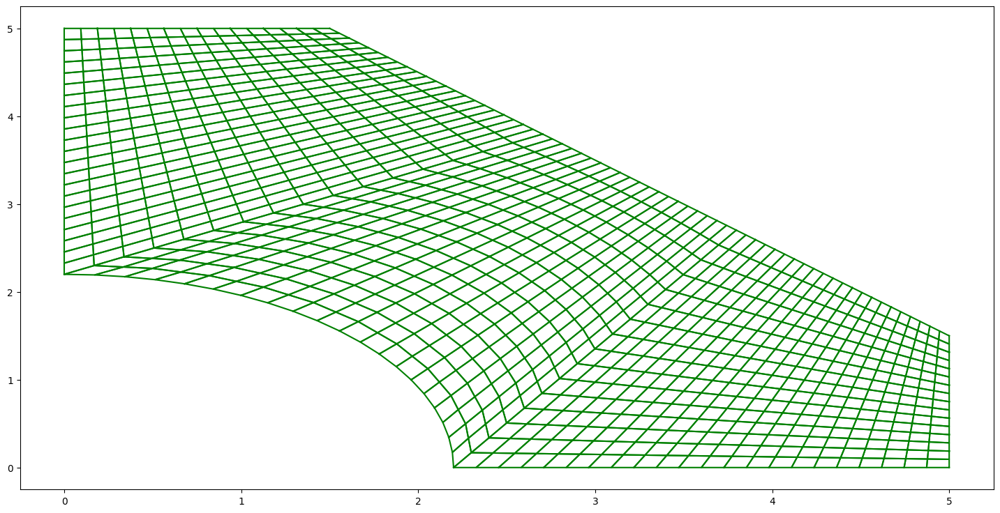

In [ ]:
filename_1 = '0.09375.k'
verts=get_verts(filename=filename_1)
triag=get_triag(filename=filename_1)
quadroplot(triag, verts)

100%|██████████| 82/82 [00:00<00:00, 214155.00it/s]


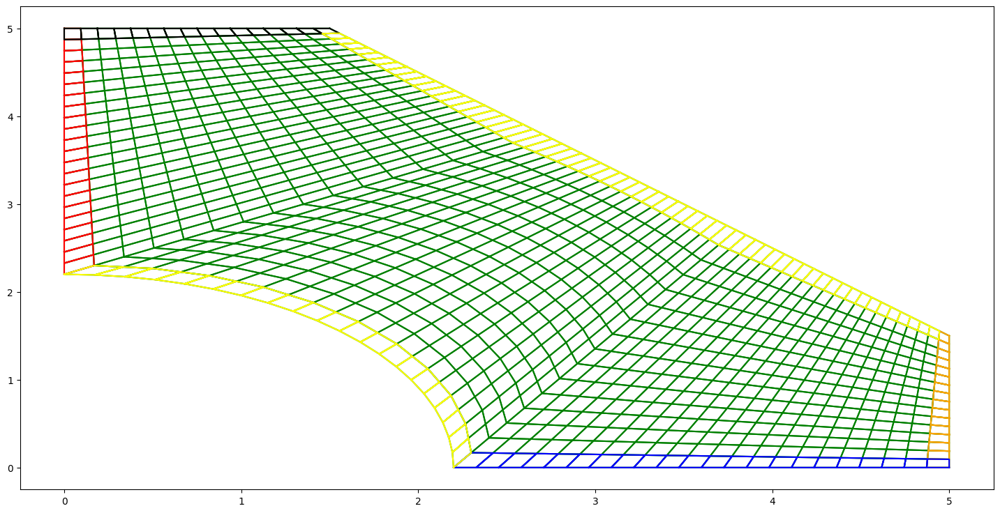

In [ ]:
left_data, right_data, up_data, down_data, inner_data = obtain_borders(verts, None, triag, left = 0, right = 5, up = 5, down = 0, a1 = 18, a2 = 9)

In [ ]:
zs = [i*0.1 for i in range(1, 30)]

In [ ]:
#dmp = np.sqrt(E/(2*(1+nu))/ro)*4/0.12
dmp = np.sqrt(E/(2*(1+nu))/ro)*4/10

0.1


100%|██████████| 2210/2210 [00:00<00:00, 265014.49it/s]


Выходные данные были обрезаны до нескольких последних строк (5000).
max_dU:  0.29875092462577935
max_dU:  0.1962400343168817
max_dU:  0.18996052908127115
max_dU:  0.3201877514057422
max_dU:  0.23929037430402222
max_dU:  0.15046111099079942
max_dU:  0.268819481858262
max_dU:  0.13113383609304297
max_dU:  0.2191397870915628
max_dU:  0.2848515429255192
max_dU:  0.17996007725795582
max_dU:  0.14942137292729987
max_dU:  0.2698805939846737
max_dU:  0.14292072602537992
max_dU:  0.15866046952238713
max_dU:  0.19651655035095655
max_dU:  0.18562181447334364
max_dU:  0.20010154772348698
max_dU:  0.3606514366050939
max_dU:  0.18671750261454886
max_dU:  0.2497905530327657
max_dU:  0.27847666174562713
max_dU:  0.21341529758742955
max_dU:  0.17275862551061227
max_dU:  0.2611164069879652
max_dU:  0.14598295490391788
max_dU:  0.19337466863295666
max_dU:  0.2057500103255989
max_dU:  0.28330506078371814
max_dU:  0.14272696674320828
max_dU:  0.1855843439334684
max_dU:  0.14749806013730035
max_dU:  0.14008

100%|██████████| 1024/1024 [00:01<00:00, 997.16it/s]


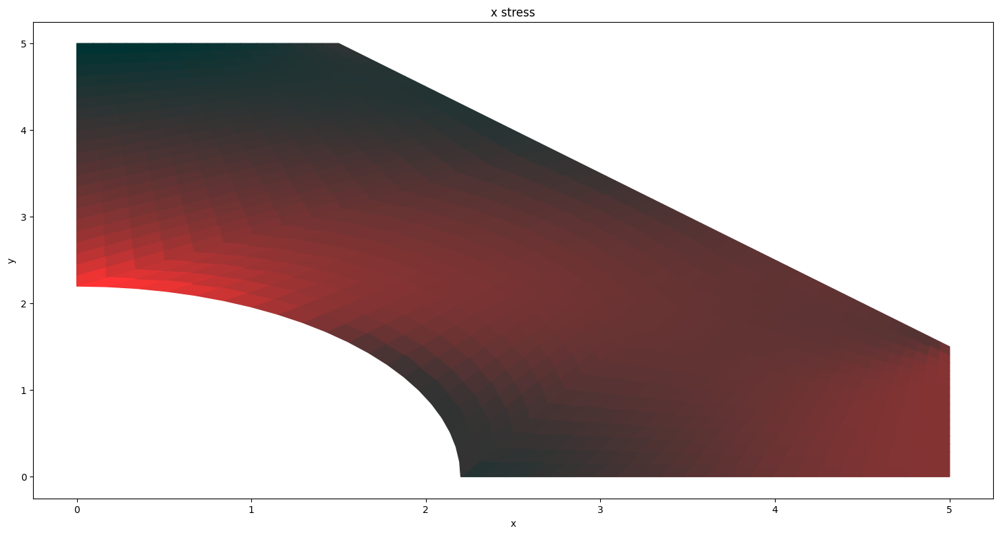

9955
0.2


100%|██████████| 2210/2210 [00:00<00:00, 197087.34it/s]


max_dU:  4.1055664707080615
max_dU:  6.941860551505812
max_dU:  7.062994726081495
max_dU:  6.938714414331671
max_dU:  6.6104138678192115
max_dU:  6.618993052057867
max_dU:  6.633503474299999
max_dU:  6.468334754302475
max_dU:  6.470709170064876
max_dU:  6.487625981759106
max_dU:  6.39426019751015
max_dU:  6.397338417683687
max_dU:  6.386221036177989
max_dU:  6.3327639030902505
max_dU:  6.321832956060824
max_dU:  6.2963919752992155
max_dU:  6.264092341327936
max_dU:  6.283512678848291
max_dU:  6.24094726474294
max_dU:  6.241151541149311
max_dU:  6.208321505469666
max_dU:  6.166028341092456
max_dU:  6.158966980041778
max_dU:  6.167763331628125
max_dU:  6.1635535107361585
max_dU:  6.752162149495394
max_dU:  6.081706549848132
max_dU:  6.0980497317901845
max_dU:  6.086191467498243
max_dU:  6.069515565888533
max_dU:  6.025476270514753
max_dU:  5.9871455273848815
max_dU:  6.837706471359267
max_dU:  6.002982926183335
max_dU:  6.302005211424033
max_dU:  5.939719955013338
max_dU:  5.929486813211

100%|██████████| 1024/1024 [00:00<00:00, 1267.99it/s]


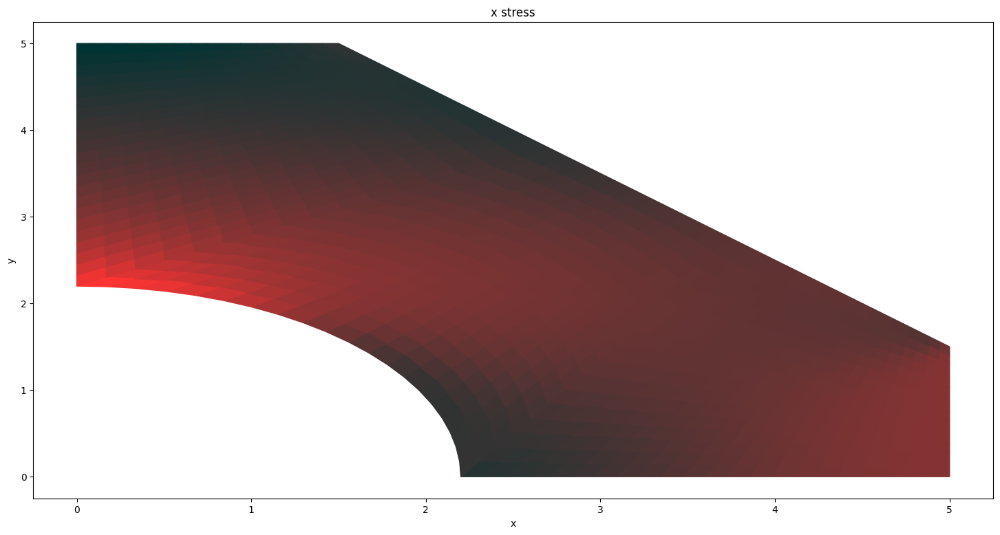

4444
0.30000000000000004


100%|██████████| 2210/2210 [00:00<00:00, 174086.54it/s]


max_dU:  4.10313649164672
max_dU:  6.935653443535836
max_dU:  7.052549604394972
max_dU:  6.924461593659496
max_dU:  6.592885239259153
max_dU:  6.59753006747619
max_dU:  6.608089690804542
max_dU:  6.439694734977524
max_dU:  6.438318338574712
max_dU:  6.451333677967332
max_dU:  6.354720624876308
max_dU:  6.35404766493718
max_dU:  6.339286695671153
max_dU:  6.28248096974706
max_dU:  6.267930253692468
max_dU:  6.239103781508375
max_dU:  6.203628136398419
max_dU:  6.218981703383246
max_dU:  6.1731799774561695
max_dU:  6.16979257915855
max_dU:  6.133772130728155
max_dU:  6.088402130859129
max_dU:  6.07775898535435
max_dU:  6.082871474829889
max_dU:  6.075159666696695
max_dU:  6.652113518105887
max_dU:  5.987524830696997
max_dU:  6.000082655443155
max_dU:  5.984896797415567
max_dU:  5.964894650278321
max_dU:  5.918124013709838
max_dU:  5.877205707828932
max_dU:  6.708337667266252
max_dU:  5.885715505888611
max_dU:  6.1758356444693865
max_dU:  5.818624403658006
max_dU:  5.803502294536328
max_d

100%|██████████| 1024/1024 [00:00<00:00, 1368.51it/s]


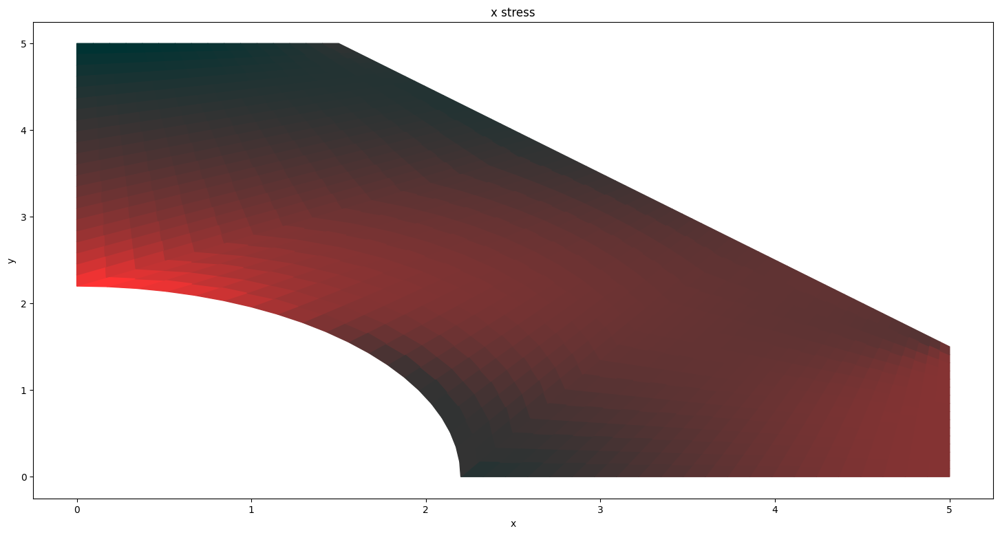

3077
0.4


100%|██████████| 2210/2210 [00:00<00:00, 209781.65it/s]


max_dU:  4.100709387367921
max_dU:  6.929456159913688
max_dU:  7.042128274027615
max_dU:  6.91025279589683
max_dU:  6.575420056987456
max_dU:  6.5761611337781805
max_dU:  6.582806771437438
max_dU:  6.4112161410081345
max_dU:  6.406135857958364
max_dU:  6.41530102094611
max_dU:  6.315484115055928
max_dU:  6.311120519479411
max_dU:  6.29278145482218
max_dU:  6.2326817252678595
max_dU:  6.214581836187793
max_dU:  6.1824529165028475
max_dU:  6.143980360528506
max_dU:  6.155243418750443
max_dU:  6.106278175063463
max_dU:  6.099398914699817
max_dU:  6.060288458096091
max_dU:  6.011929648792829
max_dU:  5.997787970145013
max_dU:  5.999329681086433
max_dU:  5.988231199617088
max_dU:  6.553880176194381
max_dU:  5.895037918249671
max_dU:  5.903939779510236
max_dU:  5.885552629131204
max_dU:  5.862325957548895
max_dU:  5.81294237453262
max_dU:  5.769604063886767
max_dU:  6.581994733489887
max_dU:  5.771051036999701
max_dU:  6.052691810929378
max_dU:  5.70102509679072
max_dU:  5.68056522959305
max

100%|██████████| 1024/1024 [00:00<00:00, 1379.93it/s]


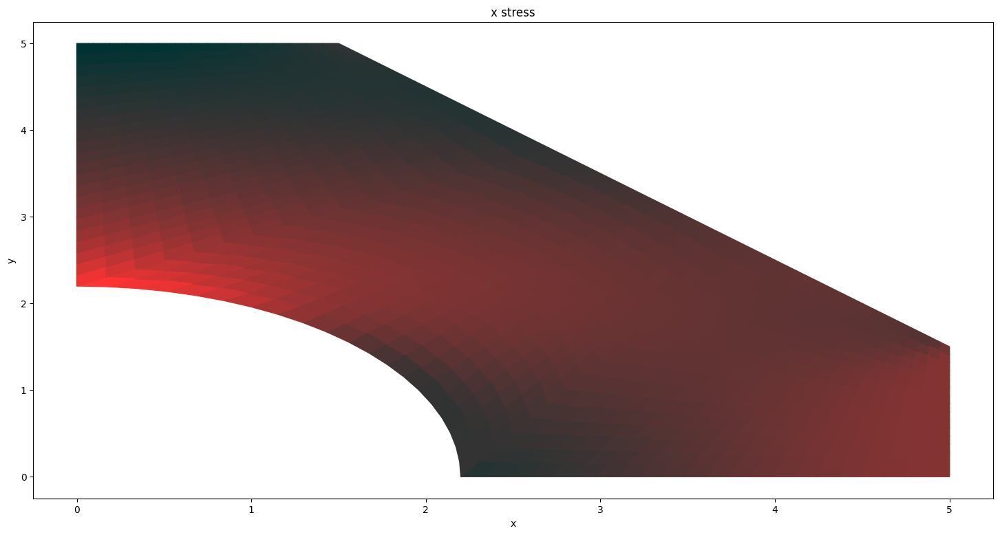

2562
0.5


100%|██████████| 2210/2210 [00:00<00:00, 129331.01it/s]


max_dU:  4.098285152773169
max_dU:  6.923268678818072
max_dU:  7.031730665384252
max_dU:  6.896087856057099
max_dU:  6.558018046249648
max_dU:  6.554885767046976
max_dU:  6.557653933957987
max_dU:  6.382897924785753
max_dU:  6.374160191738765
max_dU:  6.379525890299174
max_dU:  6.276548032731324
max_dU:  6.268553523572161
max_dU:  6.246700878014361
max_dU:  6.183360941262331
max_dU:  6.161781313060865
max_dU:  6.1264314129950925
max_dU:  6.085136585165895
max_dU:  6.092286952937321
max_dU:  6.040229581142141
max_dU:  6.029956025442842
max_dU:  5.987853520634825
max_dU:  5.9365918482963425
max_dU:  5.919033164666919
max_dU:  5.917114288297239
max_dU:  5.902741339357297
max_dU:  6.457425305001941
max_dU:  5.804212149397018
max_dU:  5.809583652809021
max_dU:  5.788117586818971
max_dU:  5.761765434462244
max_dU:  5.709883387029033
max_dU:  5.664285806958053
max_dU:  6.458598740932812
max_dU:  5.6589263579493005
max_dU:  5.932493258272347
max_dU:  5.586808554339264
max_dU:  5.56059498019509

100%|██████████| 1024/1024 [00:00<00:00, 1455.13it/s]


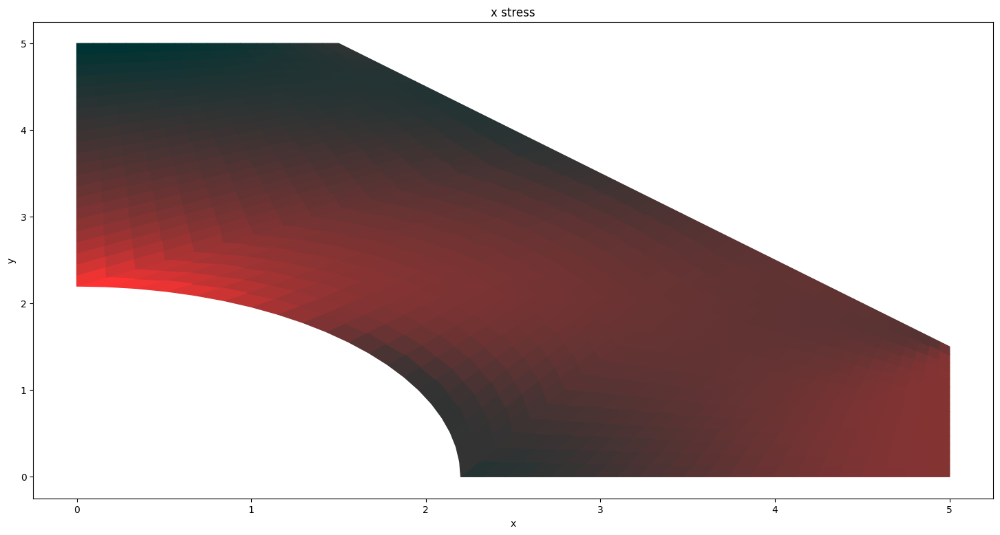

2084
0.6000000000000001


100%|██████████| 2210/2210 [00:00<00:00, 206685.07it/s]


max_dU:  4.095863782776022
max_dU:  6.917090978489657
max_dU:  7.021356709115748
max_dU:  6.88196660986851
max_dU:  6.540678933650628
max_dU:  6.533703486155461
max_dU:  6.532630401296255
max_dU:  6.354739046206019
max_dU:  6.342389815839059
max_dU:  6.344006184490991
max_dU:  6.2379097675128445
max_dU:  6.226343255122513
max_dU:  6.2010405791952525
max_dU:  6.134513450390415
max_dU:  6.109522373294707
max_dU:  6.071031410868398
max_dU:  6.027084585445957
max_dU:  6.030101594114105
max_dU:  5.975022106132019
max_dU:  5.961449623298467
max_dU:  5.916450640769298
max_dU:  5.862370019290071
max_dU:  5.841474172000425
max_dU:  5.836202077513137
max_dU:  5.818663838139925
max_dU:  6.362712912208002
max_dU:  5.715014574521625
max_dU:  5.716977644331504
max_dU:  5.692551230616067
max_dU:  5.66317003473694
max_dU:  5.60890021337881
max_dU:  5.561197516118104
max_dU:  6.338073030434556
max_dU:  5.549279937237229
max_dU:  5.81516189006475
max_dU:  5.4758652356455
max_dU:  5.443513176358904
max_d

100%|██████████| 1024/1024 [00:00<00:00, 1220.58it/s]


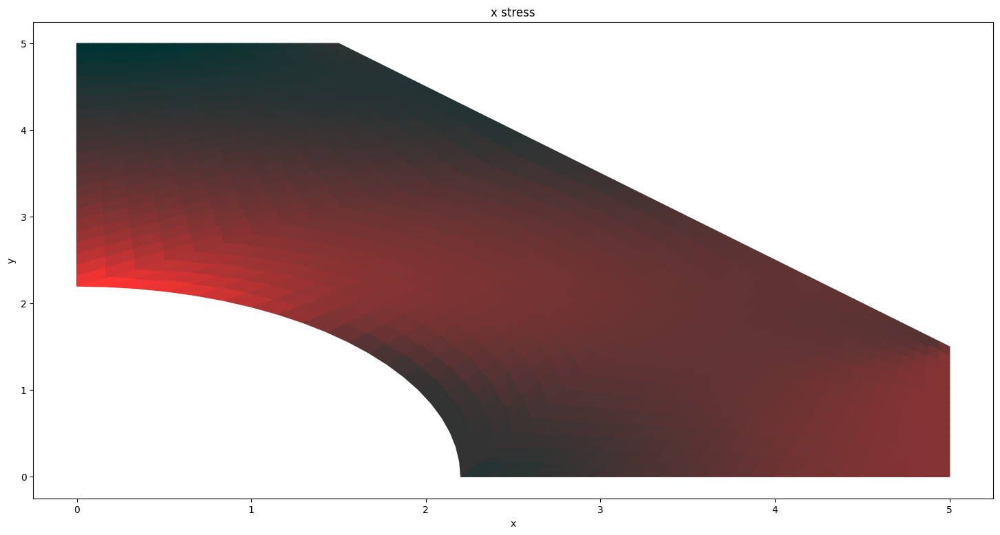

1709
0.7000000000000001


100%|██████████| 2210/2210 [00:00<00:00, 204248.55it/s]


max_dU:  4.093445272302047
max_dU:  6.910923037230852
max_dU:  7.011006336117973
max_dU:  6.867888893770552
max_dU:  6.52340244714713
max_dU:  6.512613812748591
max_dU:  6.507735401515972
max_dU:  6.326738472610549
max_dU:  6.310823218475214
max_dU:  6.308739820667625
max_dU:  6.199566733687376
max_dU:  6.184486327292461
max_dU:  6.1557962212902355
max_dU:  6.086134145607363
max_dU:  6.057798784296237
max_dU:  6.016245155658034
max_dU:  5.969812336679206
max_dU:  5.96867678814938
max_dU:  5.910643844341037
max_dU:  5.893865650447858
max_dU:  5.84606342511014
max_dU:  5.789245781977261
max_dU:  5.765090961027439
max_dU:  5.756570264229054
max_dU:  5.735972959862961
max_dU:  6.269707811734228
max_dU:  5.6274129416755585
max_dU:  5.6260859244533385
max_dU:  5.598814034476663
max_dU:  5.566497694958253
max_dU:  5.509947116128177
max_dU:  5.460287102463595
max_dU:  6.220343141972007
max_dU:  5.442051829462827
max_dU:  5.700621890856179
max_dU:  5.36808939663799
max_dU:  5.329243649702275
ma

100%|██████████| 1024/1024 [00:00<00:00, 1234.22it/s]


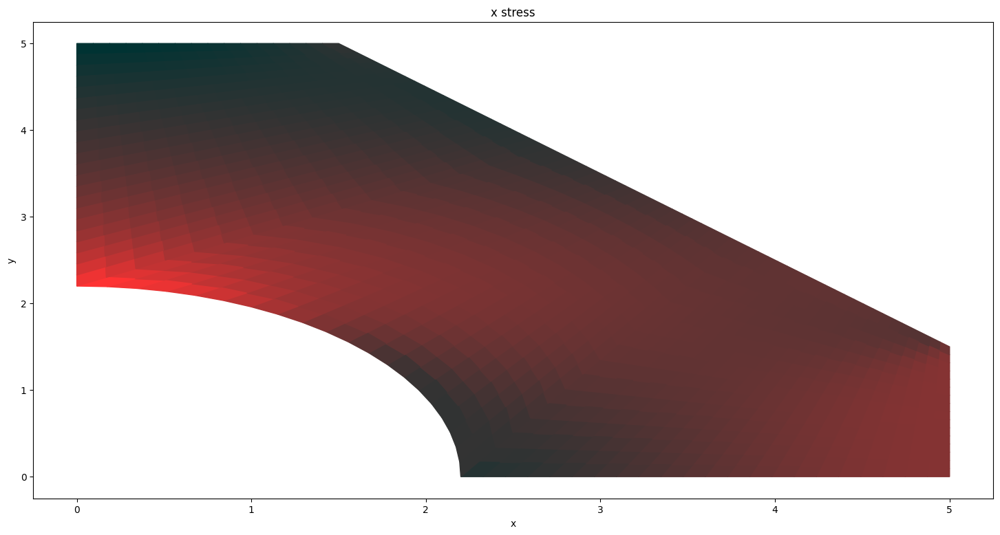

1248
0.8


100%|██████████| 2210/2210 [00:00<00:00, 198110.92it/s]


max_dU:  4.091029616288791
max_dU:  6.904764833405601
max_dU:  7.000679477530806
max_dU:  6.8538545449105115
max_dU:  6.50618831604025
max_dU:  6.4916162712258485
max_dU:  6.482968167777732
max_dU:  6.298895178729191
max_dU:  6.279458900049612
max_dU:  6.273724734479427
max_dU:  6.161516369969502
max_dU:  6.142979388113011
max_dU:  6.11096351562334
max_dU:  6.03821797941855
max_dU:  6.006604390865624
max_dU:  5.96206499705491
max_dU:  5.913308010902054
max_dU:  5.908002136165783
max_dU:  5.847083071000886
max_dU:  5.827190275441696
max_dU:  5.776675759371999
max_dU:  5.717201080729072
max_dU:  5.689863859543246
max_dU:  5.678196489854422
max_dU:  5.654643469639338
max_dU:  6.178375604073734
max_dU:  5.541375681121238
max_dU:  5.536873446588552
max_dU:  5.506867364567573
max_dU:  5.471707311085217
max_dU:  5.4129794311304495
max_dU:  5.361503774418075
max_dU:  6.1053367462064045
max_dU:  5.3371836325837885
max_dU:  5.588799653624195
max_dU:  5.263378952339751
max_dU:  5.21771236886237
m

100%|██████████| 1024/1024 [00:00<00:00, 1401.19it/s]


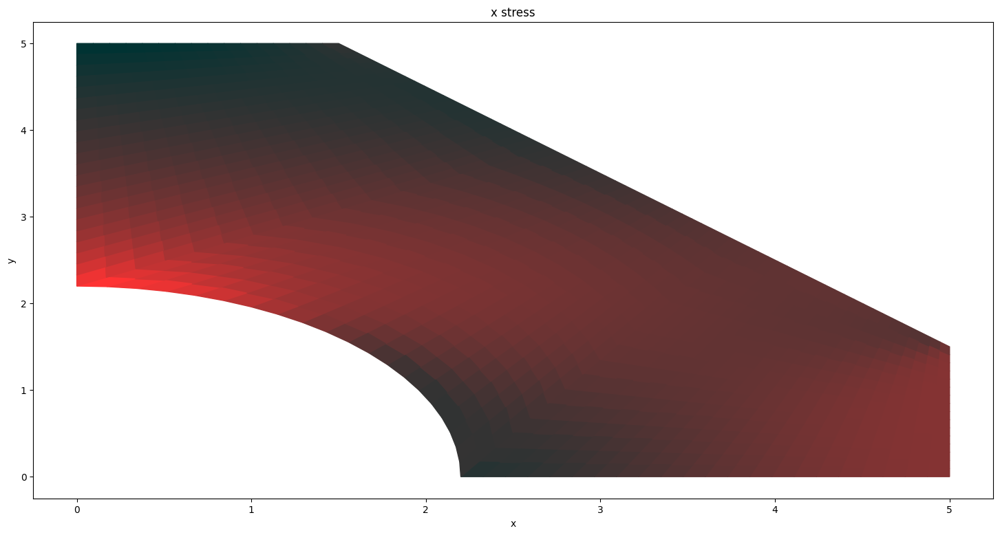

1288
0.9


100%|██████████| 2210/2210 [00:00<00:00, 158535.49it/s]


max_dU:  4.088616809685747
max_dU:  6.898616345439162
max_dU:  6.990376064737126
max_dU:  6.839863401140009
max_dU:  6.489036270968037
max_dU:  6.470710388723796
max_dU:  6.458327938302452
max_dU:  6.2712081466228025
max_dU:  6.24829537304563
max_dU:  6.238958879905498
max_dU:  6.123756139255333
max_dU:  6.101819120102736
max_dU:  6.066538221345291
max_dU:  5.990759963143982
max_dU:  5.955933114179778
max_dU:  5.9084833874312475
max_dU:  5.857559973488691
max_dU:  5.848067392135153
max_dU:  5.784328239371718
max_dU:  5.761409889368078
max_dU:  5.708271803386096
max_dU:  5.646218178087034
max_dU:  5.615773547503098
max_dU:  5.60105881335735
max_dU:  5.57465062355833
max_dU:  6.088682657132629
max_dU:  5.456871890226716
max_dU:  5.449305929278768
max_dU:  5.4166734581923786
max_dU:  5.37875871553925
max_dU:  5.317953541175827
max_dU:  5.264798003970703
max_dU:  5.992983578294785
max_dU:  5.234618446366021
max_dU:  5.4796237096873455
max_dU:  5.1616353445054655
max_dU:  5.1088473768701155

100%|██████████| 1024/1024 [00:00<00:00, 1181.51it/s]


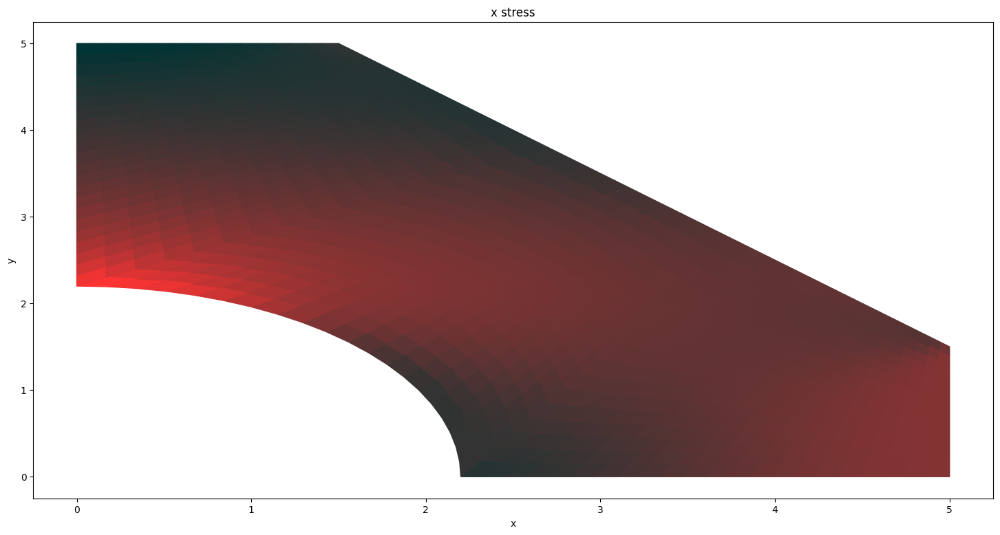

1276
1.0


100%|██████████| 2210/2210 [00:00<00:00, 175823.44it/s]


max_dU:  4.08620684745431
max_dU:  6.892477551817903
max_dU:  6.980096029361799
max_dU:  6.82591530101154
max_dU:  6.471946043898085
max_dU:  6.449895695098759
max_dU:  6.433813956335139
max_dU:  6.243676365626434
max_dU:  6.217331161923155
max_dU:  6.204440229079905
max_dU:  6.08628352837893
max_dU:  6.061002239890708
max_dU:  6.022516144868597
max_dU:  5.943755166192291
max_dU:  5.905778950789841
max_dU:  5.855492880388068
max_dU:  5.802556779824137
max_dU:  5.788862460512468
max_dU:  5.722367977895155
max_dU:  5.696511102087869
max_dU:  5.640835986205345
max_dU:  5.576279648880648
max_dU:  5.542801050400845
max_dU:  5.525135703079058
max_dU:  5.495970158663945
max_dU:  6.000596087569783
max_dU:  5.373871318707121
max_dU:  5.363349838706483
max_dU:  5.328195403230704
max_dU:  5.287612654859704
max_dU:  5.22482685029239
max_dU:  5.17012149382248
max_dU:  5.883215373889204
max_dU:  5.134300831990583
max_dU:  5.3730246609990315
max_dU:  5.062763414193878
max_dU:  5.002578730420243
max_d

100%|██████████| 1024/1024 [00:01<00:00, 890.24it/s]


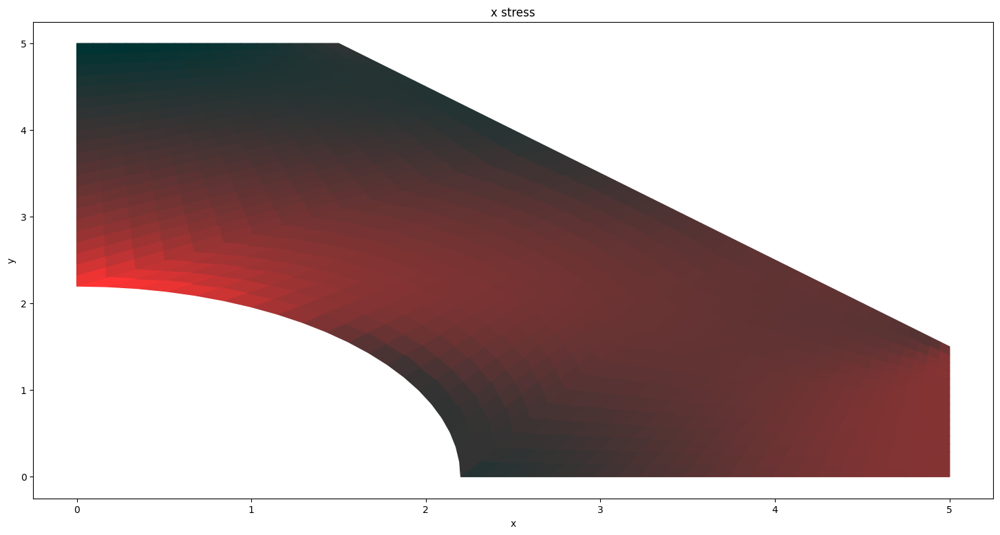

1134
1.1


100%|██████████| 2210/2210 [00:00<00:00, 153897.69it/s]


max_dU:  4.083799724567752
max_dU:  6.886348431089086
max_dU:  6.969839303270688
max_dU:  6.8120100837750615
max_dU:  6.454917368120206
max_dU:  6.42917172290964
max_dU:  6.409425470108909
max_dU:  6.216298832293058
max_dU:  6.186564803015111
max_dU:  6.17016677211965
max_dU:  6.049096047871336
max_dU:  6.020525497843779
max_dU:  5.978893139309647
max_dU:  5.897198715344136
max_dU:  5.856135971632442
max_dU:  5.803086129324075
max_dU:  5.748287172036299
max_dU:  5.730377393907982
max_dU:  5.661191087394721
max_dU:  5.632480738536286
max_dU:  5.574353001300172
max_dU:  5.507368374457815
max_dU:  5.4709277327768895
max_dU:  5.450406028714876
max_dU:  5.418578283145569
max_dU:  5.9140837426204005
max_dU:  5.2923443542040705
max_dU:  5.278972371621886
max_dU:  5.241397118079699
max_dU:  5.198230767911718
max_dU:  5.133557758700716
max_dU:  5.077427145414964
max_dU:  5.77596580724652
max_dU:  5.036176772784572
max_dU:  5.268935114736475
max_dU:  4.966671279086993
max_dU:  4.898838440978055


100%|██████████| 1024/1024 [00:00<00:00, 1195.54it/s]


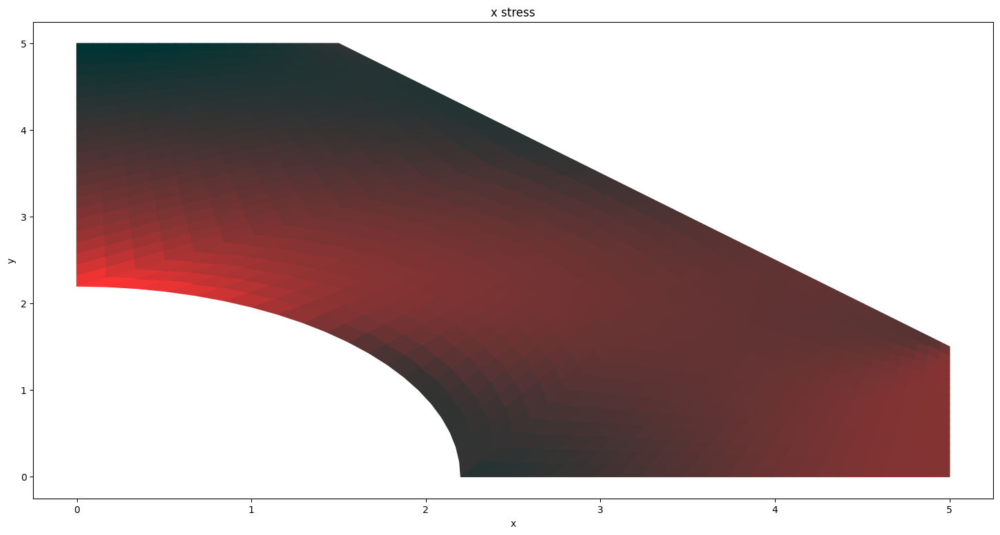

1325
1.2000000000000002


100%|██████████| 2210/2210 [00:00<00:00, 198675.67it/s]


max_dU:  4.081395436011182
max_dU:  6.880228961860669
max_dU:  6.959605818569659
max_dU:  6.798147589374572
max_dU:  6.43794997823913
max_dU:  6.408538007400835
max_dU:  6.385161732809307
max_dU:  6.18907455033771
max_dU:  6.155994844424895
max_dU:  6.136136516954352
max_dU:  6.012191231722178
max_dU:  5.98038567769813
max_dU:  5.935665103937723
max_dU:  5.851085794044897
max_dU:  5.806998321054524
max_dU:  5.751255886025651
max_dU:  5.6947400757867594
max_dU:  5.672602390796811
max_dU:  5.600786538322912
max_dU:  5.569305835089508
max_dU:  5.5088078018433455
max_dU:  5.439467537025846
max_dU:  5.400135291852938
max_dU:  5.376849053458419
max_dU:  5.342451666736276
max_dU:  5.829114182390884
max_dU:  5.2122620081951165
max_dU:  5.1961414386733695
max_dU:  5.1562433320851255
max_dU:  5.110575564632491
max_dU:  5.044639804176684
max_dU:  4.98666902781707
max_dU:  5.671170431377436
max_dU:  4.940193636043789
max_dU:  5.1672896201027
max_dU:  4.873270215375531
max_dU:  4.797560417665996
ma

100%|██████████| 1024/1024 [00:01<00:00, 926.65it/s]


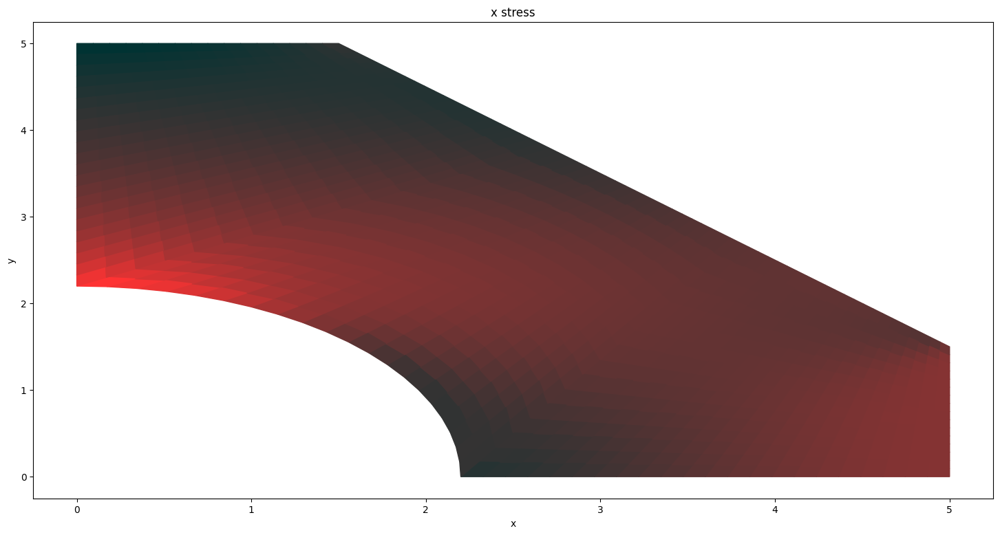

1537
1.3


100%|██████████| 2210/2210 [00:00<00:00, 182594.54it/s]


max_dU:  4.07899397678151
max_dU:  6.874119122801082
max_dU:  6.949395507603597
max_dU:  6.78432765844473
max_dU:  6.421043610167264
max_dU:  6.387994086485274
max_dU:  6.361022002538888
max_dU:  6.162002530582133
max_dU:  6.12561984592479
max_dU:  6.102347489157652
max_dU:  5.975566637143788
max_dU:  5.940579596195088
max_dU:  5.892827983630826
max_dU:  5.805411641706472
max_dU:  5.758360215851579
max_dU:  5.699994999277637
max_dU:  5.641904597118477
max_dU:  5.61552779326549
max_dU:  5.541143468054057
max_dU:  5.506973635995144
max_dU:  5.4441855960821135
max_dU:  5.372560614100908
max_dU:  5.330405751290903
max_dU:  5.30444442630539
max_dU:  5.267567431314165
max_dU:  5.74565666261223
max_dU:  5.133595902225404
max_dU:  5.114825648131782
max_dU:  5.072699566449766
max_dU:  5.024610405302157
max_dU:  4.962475961903651
max_dU:  4.897802347446473
max_dU:  5.568766620164105
max_dU:  4.84630013591604
max_dU:  5.068024607265097
max_dU:  4.782474544036501
max_dU:  4.6986804118747525
max_dU

100%|██████████| 1024/1024 [00:00<00:00, 1152.86it/s]


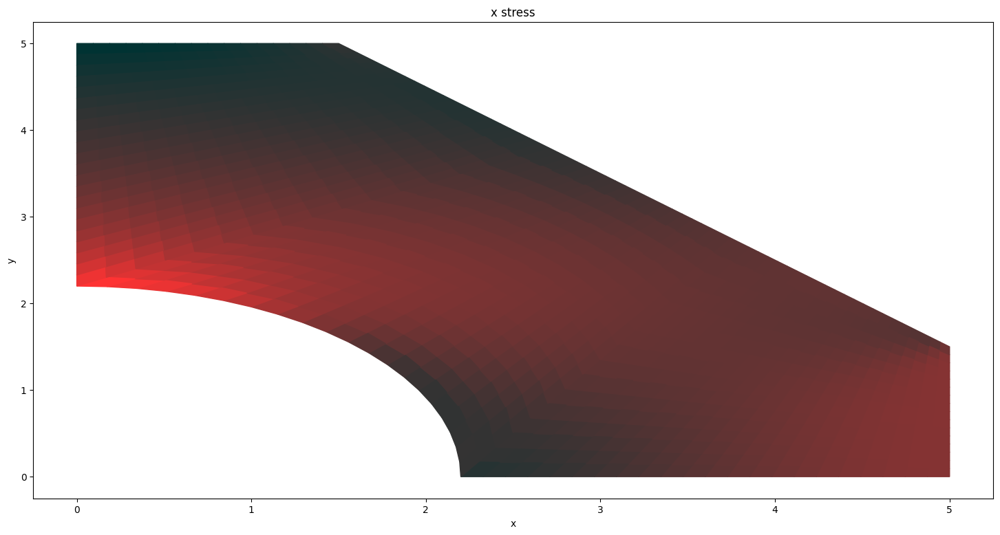

1715
1.4000000000000001


100%|██████████| 2210/2210 [00:00<00:00, 183975.31it/s]


max_dU:  4.0765953418874155
max_dU:  6.868018892639034
max_dU:  6.939208302955414
max_dU:  6.77055013230747
max_dU:  6.404198001117466
max_dU:  6.367539500727576
max_dU:  6.3370055422820695
max_dU:  6.135081790899843
max_dU:  6.095438378855262
max_dU:  6.0687977317802835
max_dU:  5.939219844337834
max_dU:  5.901104102721065
max_dU:  5.850377768338219
max_dU:  5.760171553018127
max_dU:  5.710215944319032
max_dU:  5.649296413494542
max_dU:  5.589770019360108
max_dU:  5.559144084794732
max_dU:  5.4822511782222145
max_dU:  5.445471589865346
max_dU:  5.380471842795954
max_dU:  5.306631373063733
max_dU:  5.261721455073549
max_dU:  5.233172174513789
max_dU:  5.1957867827472155
max_dU:  5.663681117839692
max_dU:  5.056318254453985
max_dU:  5.034994289998878
max_dU:  4.990732115607166
max_dU:  4.940299480326006
max_dU:  4.882290440370827
max_dU:  4.8107834186024165
max_dU:  5.468693512378296
max_dU:  4.7544462973147095
max_dU:  4.971078328351023
max_dU:  4.694201521336599
max_dU:  4.60213596354

100%|██████████| 1024/1024 [00:00<00:00, 1268.12it/s]


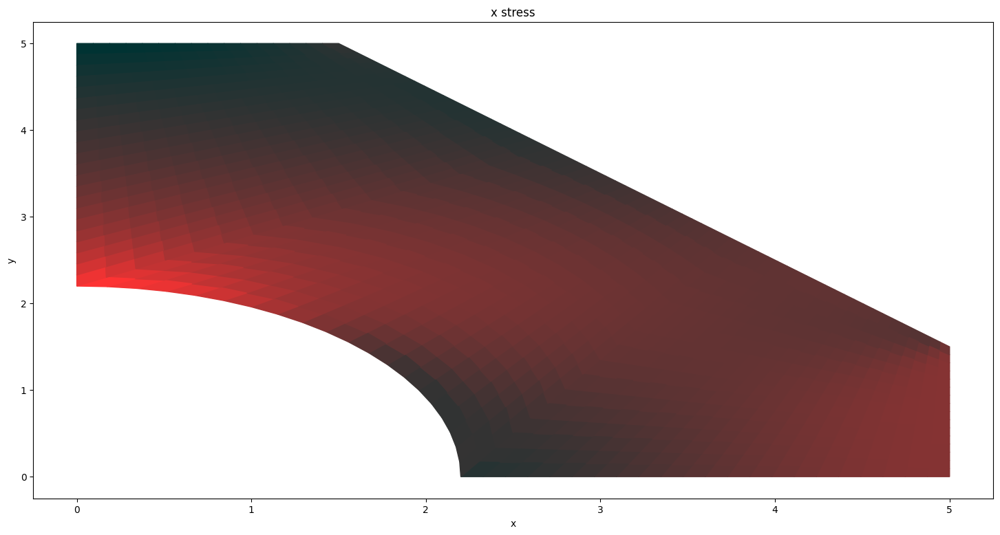

1874
1.5


100%|██████████| 2210/2210 [00:00<00:00, 207862.31it/s]


max_dU:  4.074199526349311
max_dU:  6.861928250163293
max_dU:  6.929044137445077
max_dU:  6.756814852968651
max_dU:  6.387412889595916
max_dU:  6.34717379332733
max_dU:  6.313111619870271
max_dU:  6.108311356161687
max_dU:  6.065449026025245
max_dU:  6.0354853051848405
max_dU:  5.903148456264432
max_dU:  5.861956078951711
max_dU:  5.808310492549609
max_dU:  5.715360877266221
max_dU:  5.6625598653166875
max_dU:  5.599153167371931
max_dU:  5.538325800085313
max_dU:  5.503441888077905
max_dU:  5.424099132103347
max_dU:  5.384787346231511
max_dU:  5.317652246838338
max_dU:  5.241663865819489
max_dU:  5.194065061504332
max_dU:  5.163012696217151
max_dU:  5.12705659175775
max_dU:  5.583158145085683
max_dU:  4.98040186650746
max_dU:  4.956617320490703
max_dU:  4.910308029049041
max_dU:  4.857607790515039
max_dU:  4.804029004092813
max_dU:  4.725569634787839
max_dU:  5.370891957535658
max_dU:  4.664583420833287
max_dU:  4.876390800430077
max_dU:  4.608371233400036
max_dU:  4.507866349071389
ma

100%|██████████| 1024/1024 [00:00<00:00, 1208.78it/s]


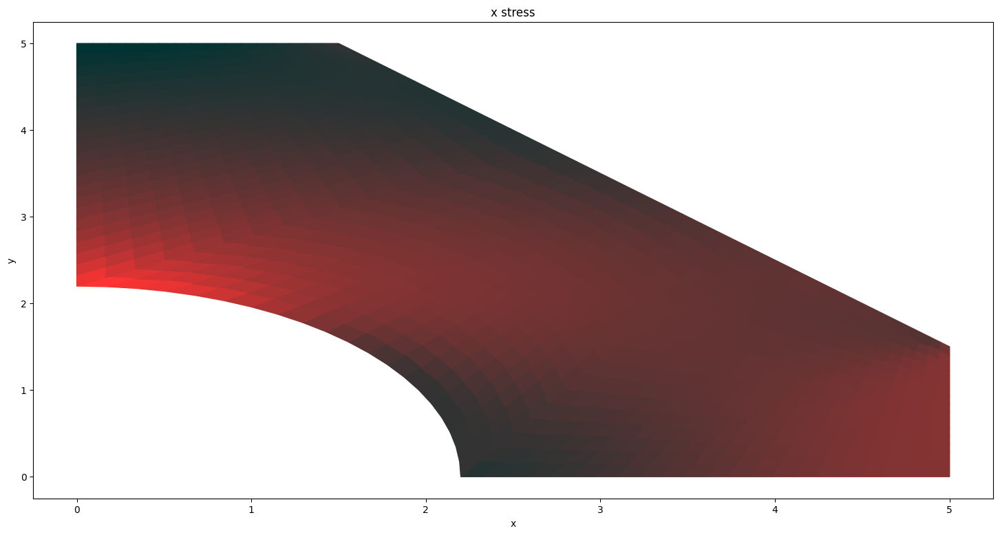

2023
1.6


100%|██████████| 2210/2210 [00:00<00:00, 204514.43it/s]


max_dU:  4.071806525199311
max_dU:  6.855847174222493
max_dU:  6.918902944128626
max_dU:  6.743121663114733
max_dU:  6.370688015394964
max_dU:  6.326896510102464
max_dU:  6.289339507947302
max_dU:  6.081690258181817
max_dU:  6.035650381613275
max_dU:  6.002408286882182
max_dU:  5.8673500984137
max_dU:  5.823132438500069
max_dU:  5.76662223477091
max_dU:  5.670975017662742
max_dU:  5.61538640734593
max_dU:  5.549558392557631
max_dU:  5.48756156812625
max_dU:  5.448411962874561
max_dU:  5.366676952040924
max_dU:  5.3249087521594
max_dU:  5.255712754760858
max_dU:  5.177642423559789
max_dU:  5.127419537324113
max_dU:  5.093946753187665
max_dU:  5.059656566741995
max_dU:  5.504058987875185
max_dU:  4.905820110633598
max_dU:  4.879665346886714
max_dU:  4.8313950935950345
max_dU:  4.776501127852187
max_dU:  4.727639017935335
max_dU:  4.642119440798907
max_dU:  5.275304463521856
max_dU:  4.576664048632273
max_dU:  4.783903750413125
max_dU:  4.524906494687219
max_dU:  4.415812530768626
max_dU:

100%|██████████| 1024/1024 [00:00<00:00, 1193.53it/s]


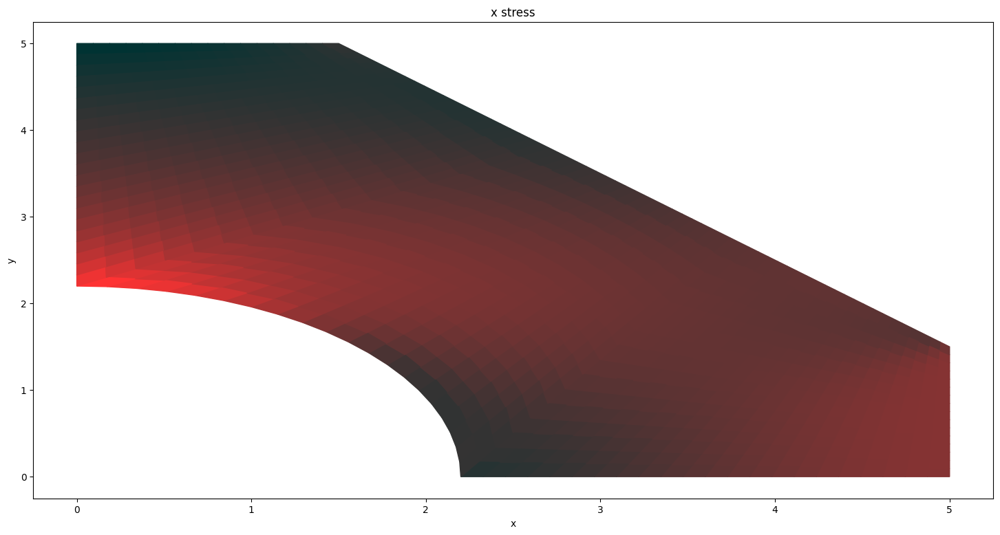

2164
1.7000000000000002


100%|██████████| 2210/2210 [00:00<00:00, 190282.30it/s]


max_dU:  4.06941633348119
max_dU:  6.84977564372492
max_dU:  6.908784656297213
max_dU:  6.729470406109445
max_dU:  6.354023119586074
max_dU:  6.306707199472768
max_dU:  6.265688483935015
max_dU:  6.055217535664145
max_dU:  6.006041051069584
max_dU:  5.969564771369463
max_dU:  5.831822418579743
max_dU:  5.784630126568822
max_dU:  5.725309117006454
max_dU:  5.6270094306824685
max_dU:  5.568690067639616
max_dU:  5.5005053123424785
max_dU:  5.437467120640375
max_dU:  5.394045203898472
max_dU:  5.30997441691433
max_dU:  5.26582384892356
max_dU:  5.194639550518211
max_dU:  5.11455165162479
max_dU:  5.061768151942363
max_dU:  5.025955463746003
max_dU:  4.993557424213644
max_dU:  5.426355520711978
max_dU:  4.832546917148005
max_dU:  4.804109612735863
max_dU:  4.753961816093664
max_dU:  4.696946056731926
max_dU:  4.653069397599141
max_dU:  4.5603923055610425
max_dU:  5.181875145931497
max_dU:  4.4906419312707255
max_dU:  4.693560561796841
max_dU:  4.443732750235463
max_dU:  4.325917107867824
ma

100%|██████████| 1024/1024 [00:00<00:00, 1065.40it/s]


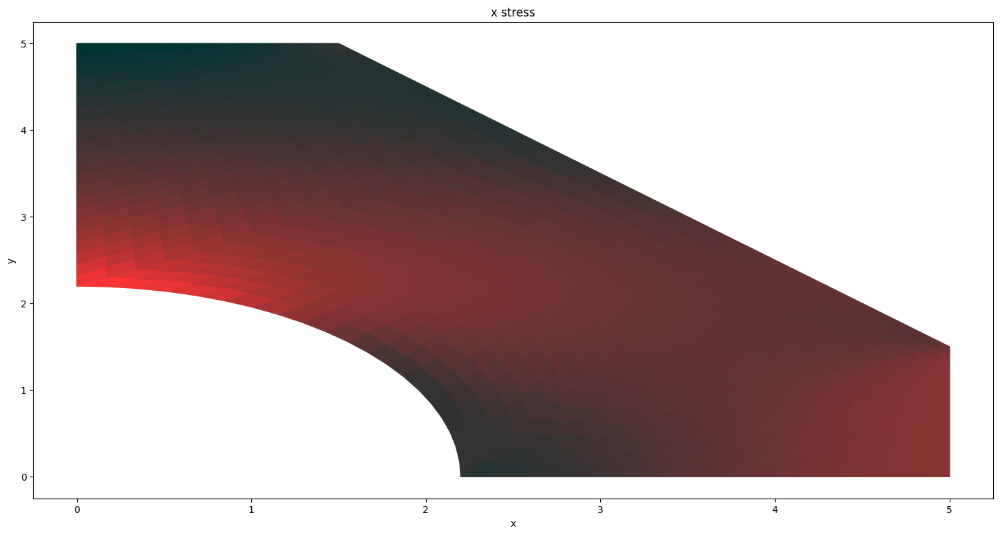

2299
1.8


100%|██████████| 2210/2210 [00:00<00:00, 204271.05it/s]


max_dU:  4.067028946250356
max_dU:  6.843792500427343
max_dU:  6.898689207476134
max_dU:  6.715860925990489
max_dU:  6.337417944512782
max_dU:  6.28660541244349
max_dU:  6.242157829999244
max_dU:  6.028892234149216
max_dU:  5.976619651019049
max_dU:  5.936952869969806
max_dU:  5.79656308663704
max_dU:  5.746446119606492
max_dU:  5.684367304247587
max_dU:  5.583459625408682
max_dU:  5.522465411264373
max_dU:  5.4519872403703
max_dU:  5.388032420229381
max_dU:  5.340332638739576
max_dU:  5.253981459649215
max_dU:  5.2075208687400565
max_dU:  5.134419051252443
max_dU:  5.05237642446344
max_dU:  4.997094471780552
max_dU:  4.95902029581482
max_dU:  4.928730576354148
max_dU:  5.350020233944242
max_dU:  4.76055676216689
max_dU:  4.729921983410933
max_dU:  4.677977406543801
max_dU:  4.618909895661247
max_dU:  4.580270561687652
max_dU:  4.480348695690823
max_dU:  5.090549679059536
max_dU:  4.40647199545563
max_dU:  4.605306223193189
max_dU:  4.364777981519438
max_dU:  4.238124268979412
max_dU: 

100%|██████████| 1024/1024 [00:00<00:00, 1061.73it/s]


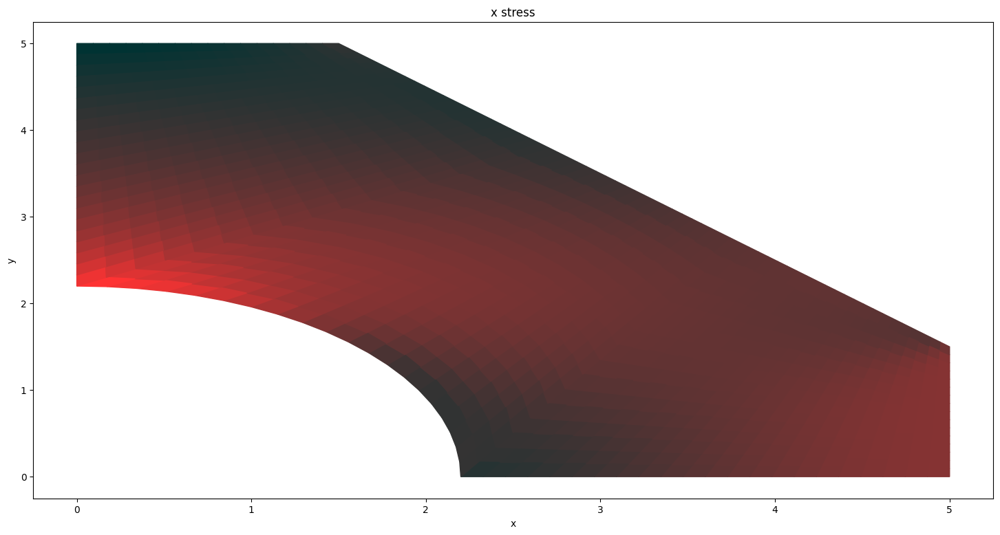

2430
1.9000000000000001


100%|██████████| 2210/2210 [00:00<00:00, 163819.73it/s]


max_dU:  4.064644358573814
max_dU:  6.837876769670364
max_dU:  6.888616531423863
max_dU:  6.70229306746626
max_dU:  6.32087223378372
max_dU:  6.266590702589061
max_dU:  6.218746833015984
max_dU:  6.002713405961522
max_dU:  5.947384809165065
max_dU:  5.904570710673562
max_dU:  5.761569794319165
max_dU:  5.708577424967584
max_dU:  5.643793003967588
max_dU:  5.5403211628873406
max_dU:  5.476707070235222
max_dU:  5.403997579366847
max_dU:  5.339247592109398
max_dU:  5.287265425819275
max_dU:  5.198688164769188
max_dU:  5.149988231556364
max_dU:  5.075037903154955
max_dU:  4.991101880689883
max_dU:  4.9333823547254685
max_dU:  4.893123060112873
max_dU:  4.865148113630885
max_dU:  5.275026219018997
max_dU:  4.689824655619276
max_dU:  4.657074932002691
max_dU:  4.6034117616259795
max_dU:  4.542360699410318
max_dU:  4.5091943853041245
max_dU:  4.401950049763887
max_dU:  5.001275248489651
max_dU:  4.324110312682875
max_dU:  4.519087278576035
max_dU:  4.287972615793235
max_dU:  4.152379745987169

100%|██████████| 1024/1024 [00:00<00:00, 1096.12it/s]


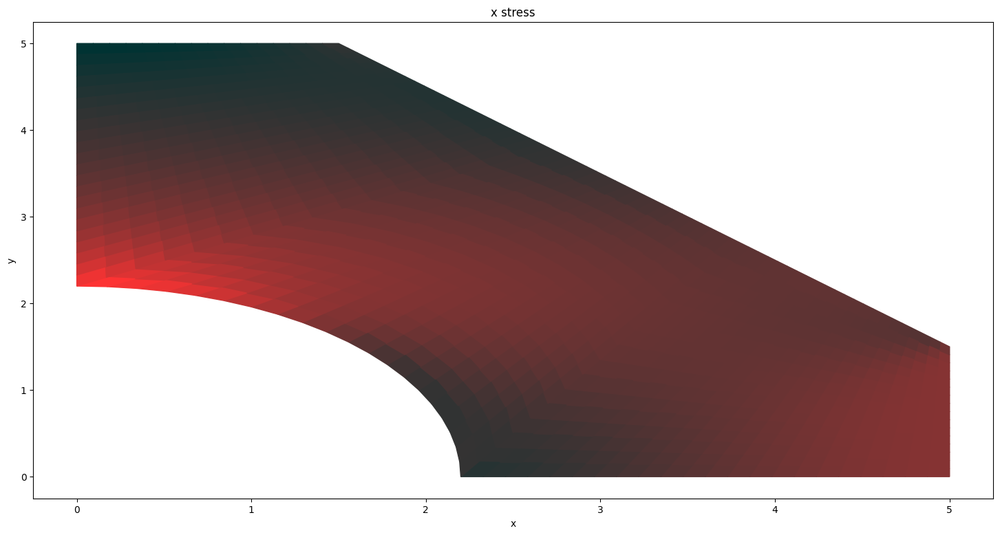

2557
2.0


100%|██████████| 2210/2210 [00:00<00:00, 160888.18it/s]


max_dU:  4.06226256553013
max_dU:  6.831970200895732
max_dU:  6.878566562131106
max_dU:  6.688766675912586
max_dU:  6.3043857322656525
max_dU:  6.246662626036957
max_dU:  6.195454784537837
max_dU:  5.9766801101572815
max_dU:  5.91833516419427
max_dU:  5.872416437981153
max_dU:  5.72684025499991
max_dU:  5.671021080576639
max_dU:  5.603582465622807
max_dU:  5.497589655489538
max_dU:  5.431409742642267
max_dU:  5.356529819887397
max_dU:  5.291102921331599
max_dU:  5.2348348523785475
max_dU:  5.144084765988052
max_dU:  5.093214541897468
max_dU:  5.016482977404845
max_dU:  4.9307134182342285
max_dU:  4.870615944690293
max_dU:  4.8282459034868985
max_dU:  4.8027827878651905
max_dU:  5.201347154114975
max_dU:  4.620326129532048
max_dU:  4.585541525545709
max_dU:  4.530235448633527
max_dU:  4.46726724160145
max_dU:  4.439794155130352
max_dU:  4.325158753269501
max_dU:  4.914000505225473
max_dU:  4.243514068744575
max_dU:  4.434851779189087
max_dU:  4.213249438783846
max_dU:  4.068630769325884

100%|██████████| 1024/1024 [00:00<00:00, 1097.86it/s]


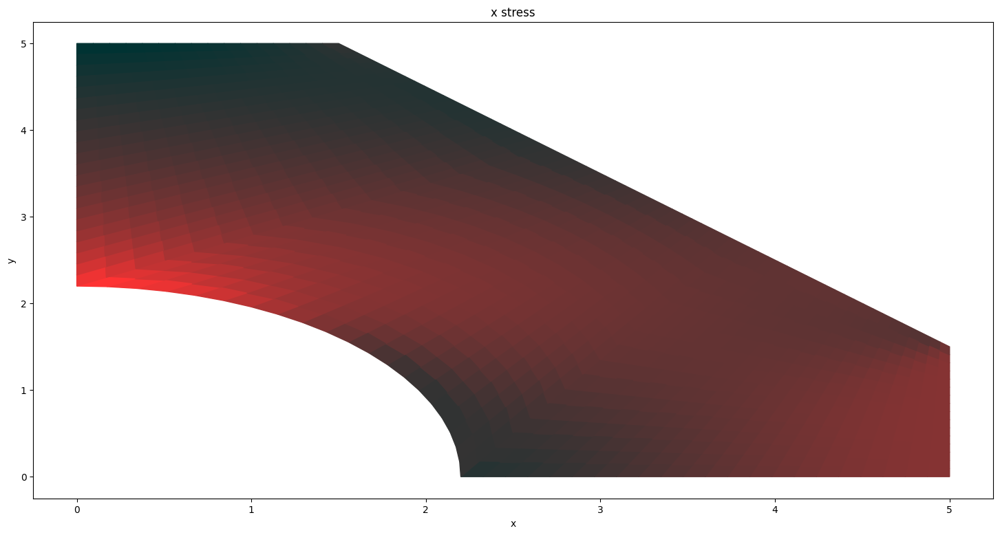

2681
2.1


100%|██████████| 2210/2210 [00:00<00:00, 197637.83it/s]


max_dU:  4.059883562209398
max_dU:  6.826072774092855
max_dU:  6.868539233819835
max_dU:  6.675281597369468
max_dU:  6.287958186076582
max_dU:  6.22682074145162
max_dU:  6.172280980760714
max_dU:  5.950791412472597
max_dU:  5.889469365682155
max_dU:  5.840488212747487
max_dU:  5.69237220347667
max_dU:  5.633774154596101
max_dU:  5.563731980159932
max_dU:  5.455260766282165
max_dU:  5.386568191789335
max_dU:  5.309577539082677
max_dU:  5.243588850052128
max_dU:  5.183032332498286
max_dU:  5.090161643841902
max_dU:  5.037188585767057
max_dU:  4.958741366182002
max_dU:  4.871196689585699
max_dU:  4.808779666281237
max_dU:  4.764371302378263
max_dU:  4.7416079957380335
max_dU:  5.128957290143648
max_dU:  4.552037226581503
max_dU:  4.51529541156767
max_dU:  4.458419689793295
max_dU:  4.393598997725251
max_dU:  4.372024525937506
max_dU:  4.256653599487145
max_dU:  4.828675521310175
max_dU:  4.164641534078042
max_dU:  4.352549237052711
max_dU:  4.140543510607839
max_dU:  3.986826024600506
max

100%|██████████| 1024/1024 [00:00<00:00, 1064.22it/s]


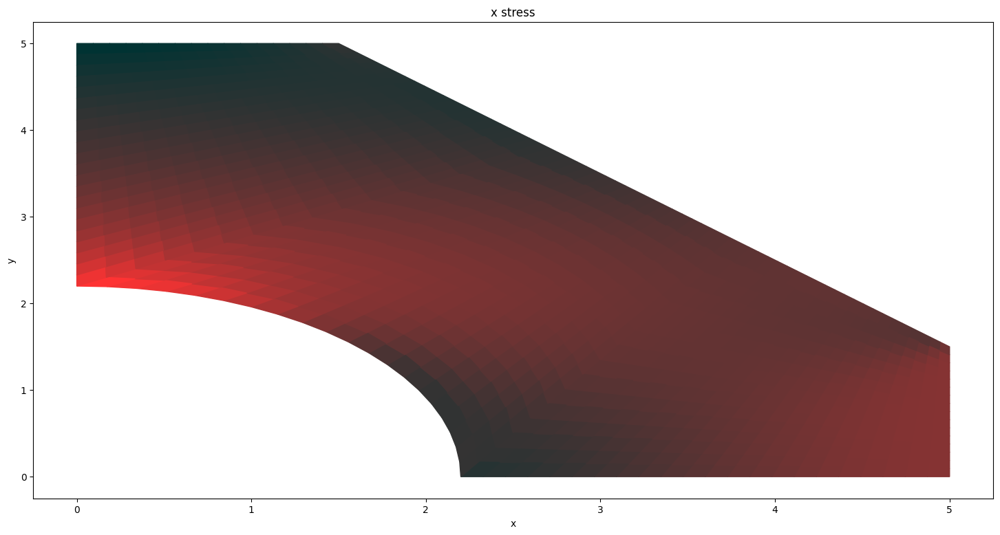

2802
2.2


100%|██████████| 2210/2210 [00:00<00:00, 151843.07it/s]


max_dU:  4.05750734371321
max_dU:  6.820184469307154
max_dU:  6.858534480942357
max_dU:  6.661837678537871
max_dU:  6.271589342578879
max_dU:  6.20706461001853
max_dU:  6.149224722490787
max_dU:  5.925046385272095
max_dU:  5.860786073999534
max_dU:  5.808784212027932
max_dU:  5.658163395756142
max_dU:  5.596833745097995
max_dU:  5.524237879529349
max_dU:  5.413330208406702
max_dU:  5.342177245344381
max_dU:  5.263134399482952
max_dU:  5.196695974850491
max_dU:  5.131849405151388
max_dU:  5.036909323360458
max_dU:  4.981899327602935
max_dU:  4.901800378753702
max_dU:  4.812537597126483
max_dU:  4.747858219567609
max_dU:  4.7014820564216775
max_dU:  4.681597762722284
max_dU:  5.057831437108192
max_dU:  4.484934488905105
max_dU:  4.446310804954548
max_dU:  4.387936346966478
max_dU:  4.321326128573261
max_dU:  4.3058414784824
max_dU:  4.190496391677093
max_dU:  4.745251746886224
max_dU:  4.087452034932565
max_dU:  4.272130580015361
max_dU:  4.069792084789627
max_dU:  3.9163371758093564
max

100%|██████████| 1024/1024 [00:01<00:00, 875.46it/s]


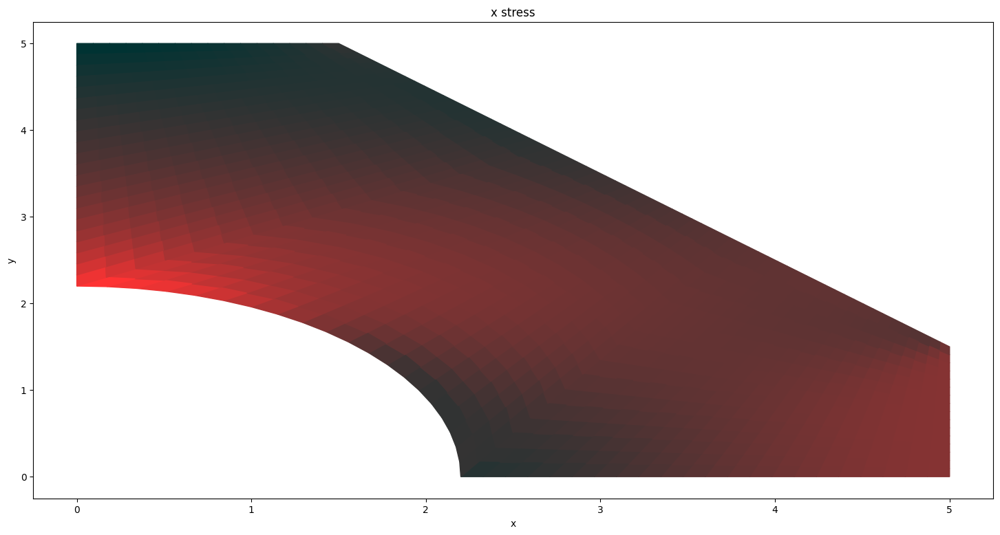

2920
2.3000000000000003


100%|██████████| 2210/2210 [00:00<00:00, 200771.34it/s]


max_dU:  4.055133905154617
max_dU:  6.81430526663986
max_dU:  6.848552238180359
max_dU:  6.648434766776493
max_dU:  6.255278950372466
max_dU:  6.187393795428365
max_dU:  6.1262853151117085
max_dU:  5.8994441074979544
max_dU:  5.832283960219864
max_dU:  5.7773026289257965
max_dU:  5.624211608842282
max_dU:  5.560196979739378
max_dU:  5.485096536204462
max_dU:  5.371793744465939
max_dU:  5.29823179450145
max_dU:  5.217194147799863
max_dU:  5.1504150440956975
max_dU:  5.081277732286012
max_dU:  4.984318471776877
max_dU:  4.927335907285568
max_dU:  4.845647537633187
max_dU:  4.755643955723327
max_dU:  4.6878365749532795
max_dU:  4.639561282173151
max_dU:  4.622726727429449
max_dU:  4.987944950811648
max_dU:  4.418994947167407
max_dU:  4.37856247512384
max_dU:  4.318757906719863
max_dU:  4.25041946407639
max_dU:  4.241202278744352
max_dU:  4.125930061902211
max_dU:  4.6636819686441635
max_dU:  4.011905925330774
max_dU:  4.193548108296
max_dU:  4.000934530265014
max_dU:  3.8488847420982095
m

100%|██████████| 1024/1024 [00:00<00:00, 1044.50it/s]


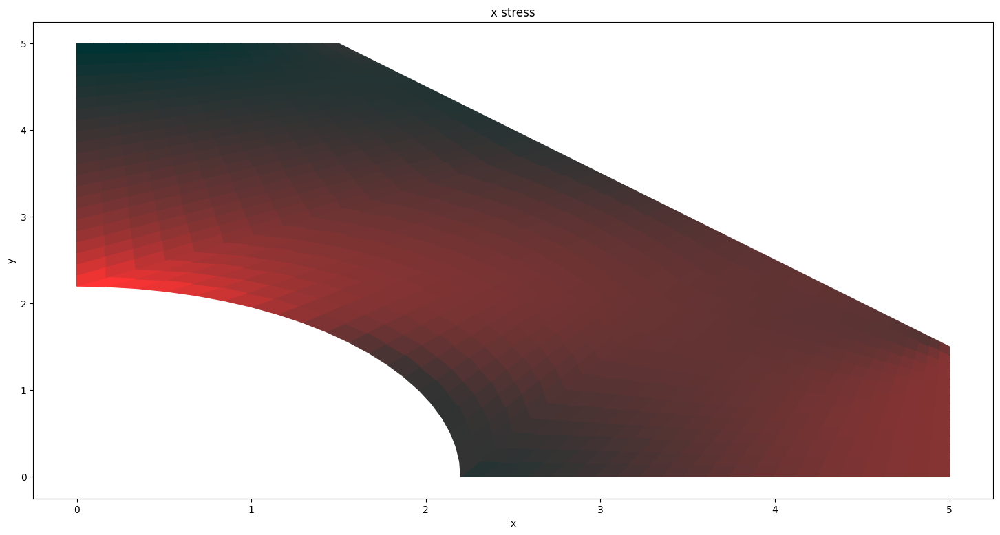

3036
2.4000000000000004


100%|██████████| 2210/2210 [00:00<00:00, 202760.78it/s]


max_dU:  4.052763241658096
max_dU:  6.808435146247829
max_dU:  6.838592440443971
max_dU:  6.6350727100985925
max_dU:  6.239026759288035
max_dU:  6.167807863861283
max_dU:  6.103462068552078
max_dU:  5.873983664619367
max_dU:  5.803961706027422
max_dU:  5.746041672441377
max_dU:  5.590514640526525
max_dU:  5.523861015441448
max_dU:  5.446304362706943
max_dU:  5.3306471859186315
max_dU:  5.254726793154137
max_dU:  5.17175061374587
max_dU:  5.104736955358937
max_dU:  5.031309096939523
max_dU:  4.932379896275462
max_dU:  4.873487637198862
max_dU:  4.790270574808862
max_dU:  4.702539417793615
max_dU:  4.628699968147513
max_dU:  4.578592406964538
max_dU:  4.564970126361005
max_dU:  4.919273719903352
max_dU:  4.358006521024777
max_dU:  4.312025733498542
max_dU:  4.250857465758437
max_dU:  4.180850487539094
max_dU:  4.178065438458548
max_dU:  4.0629105442833335
max_dU:  4.583920269613991
max_dU:  3.9379645598020394
max_dU:  4.11675545246369
max_dU:  3.9339122562557134
max_dU:  3.78328110615981

100%|██████████| 1024/1024 [00:00<00:00, 1050.53it/s]


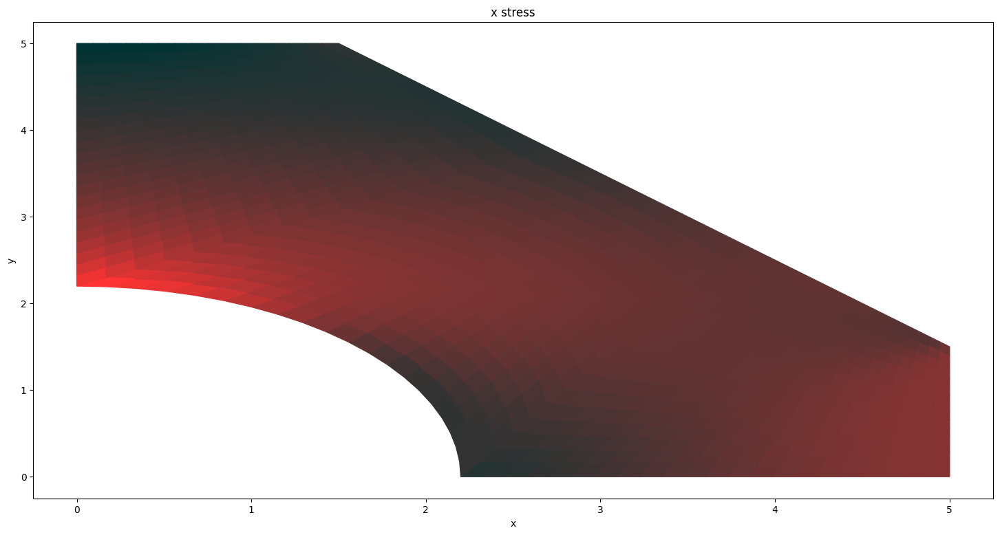

3150
2.5


100%|██████████| 2210/2210 [00:00<00:00, 156024.44it/s]


max_dU:  4.050395348359523
max_dU:  6.802574088343361
max_dU:  6.828655022870843
max_dU:  6.621751357168789
max_dU:  6.222832520380307
max_dU:  6.1483063839713
max_dU:  6.080754297253126
max_dU:  5.848664148582419
max_dU:  5.775818003626309
max_dU:  5.714999567322452
max_dU:  5.557070309180186
max_dU:  5.487823038072365
max_dU:  5.407857811137812
max_dU:  5.2898863924819075
max_dU:  5.211657257080234
max_dU:  5.1267977088709245
max_dU:  5.059652752872296
max_dU:  4.981935401382599
max_dU:  4.8810845417765485
max_dU:  4.8203439993422
max_dU:  4.735657428042874
max_dU:  4.650322488169763
max_dU:  4.570433895233115
max_dU:  4.5185591628819815
max_dU:  4.508303779052257
max_dU:  4.851794153256483
max_dU:  4.300583117534111
max_dU:  4.2466764212745245
max_dU:  4.184208716710213
max_dU:  4.112591320259167
max_dU:  4.116390676903726
max_dU:  4.001395095834081
max_dU:  4.50592199025459
max_dU:  3.8655902668660564
max_dU:  4.041707532804207
max_dU:  3.868668639908141
max_dU:  3.719467432693722


100%|██████████| 1024/1024 [00:01<00:00, 992.51it/s]


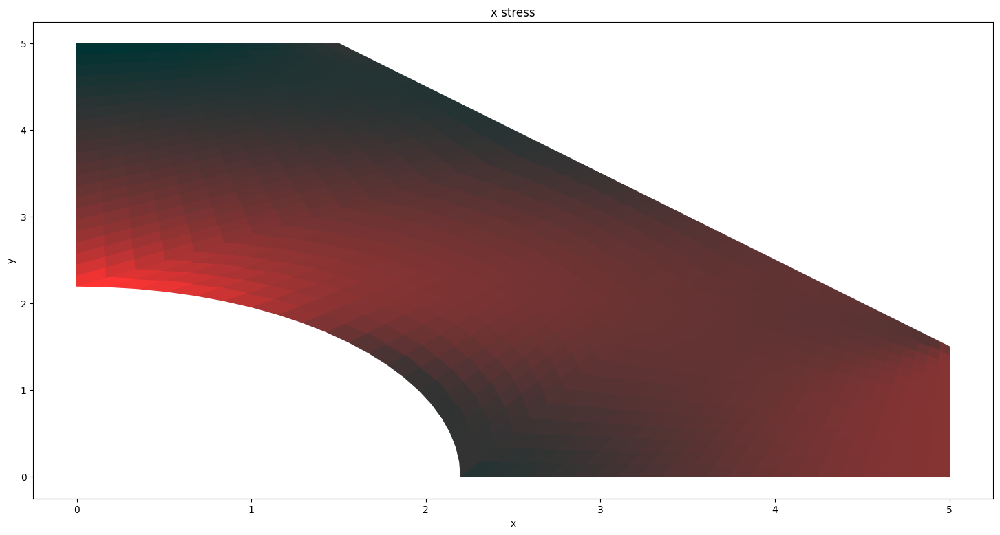

3263
2.6


100%|██████████| 2210/2210 [00:00<00:00, 176893.80it/s]


max_dU:  4.048030220406133
max_dU:  6.796722073193992
max_dU:  6.818739920825201
max_dU:  6.608470557299922
max_dU:  6.20669598592134
max_dU:  6.1288889268707845
max_dU:  6.058161320136699
max_dU:  5.823484657760372
max_dU:  5.747851555650287
max_dU:  5.684174553916317
max_dU:  5.5238764535490725
max_dU:  5.45208026213367
max_dU:  5.369753372714271
max_dU:  5.249507271541325
max_dU:  5.169018263137556
max_dU:  5.082329425416201
max_dU:  5.01515362503255
max_dU:  4.933148665293006
max_dU:  4.830423488757996
max_dU:  4.76789464249285
max_dU:  4.681796237237612
max_dU:  4.598976165155814
max_dU:  4.513024107830033
max_dU:  4.459445580865745
max_dU:  4.452704073599555
max_dU:  4.785483167666104
max_dU:  4.244327409415343
max_dU:  4.1824908974743025
max_dU:  4.1187859342545945
max_dU:  4.04561470652348
max_dU:  4.056138883903576
max_dU:  3.9413422546199195
max_dU:  4.429643690794756
max_dU:  3.804115287755702
max_dU:  3.9683605200274963
max_dU:  3.8051489565910392
max_dU:  3.657386917563357

100%|██████████| 1024/1024 [00:00<00:00, 1060.23it/s]


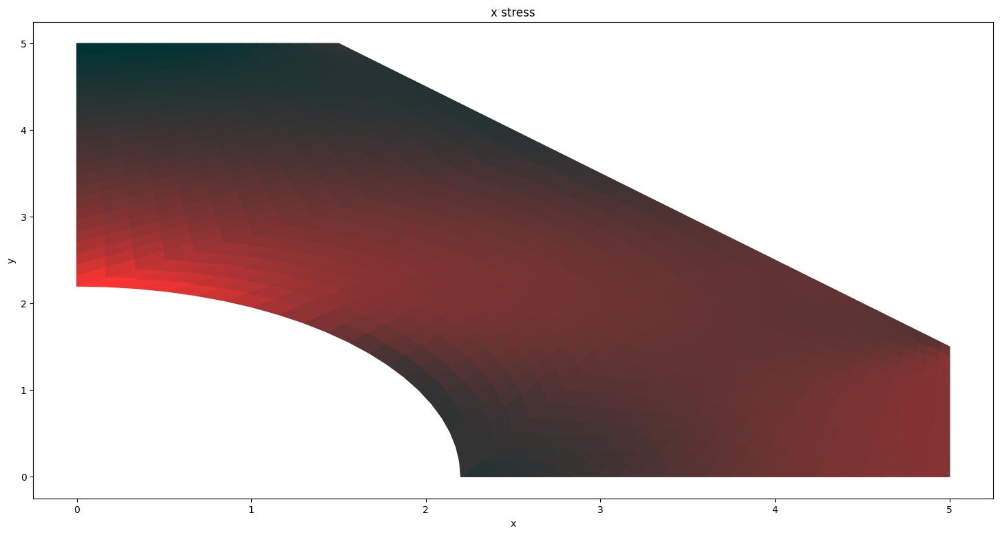

3373
2.7


100%|██████████| 2210/2210 [00:00<00:00, 135672.43it/s]


max_dU:  4.0456678529564885
max_dU:  6.7908790811223305
max_dU:  6.808847069896929
max_dU:  6.595230160449902
max_dU:  6.190616909393855
max_dU:  6.109555066115044
max_dU:  6.03568246057345
max_dU:  5.79844429690437
max_dU:  5.720061075073441
max_dU:  5.653564888023247
max_dU:  5.49093093255026
max_dU:  5.4166299304502665
max_dU:  5.331987577312238
max_dU:  5.209505777568524
max_dU:  5.1268049484706575
max_dU:  5.03833983518455
max_dU:  4.971230901948837
max_dU:  4.884941023958538
max_dU:  4.780387951112609
max_dU:  4.716129379417785
max_dU:  4.628675340868952
max_dU:  4.548483799697549
max_dU:  4.456456608352435
max_dU:  4.401235984928827
max_dU:  4.398147952560021
max_dU:  4.720318175860211
max_dU:  4.189212041596723
max_dU:  4.119446027280224
max_dU:  4.054563961585691
max_dU:  3.9798939989702253
max_dU:  3.997272084001758
max_dU:  3.882711799288127
max_dU:  4.35504311478612
max_dU:  3.7452380826479432
max_dU:  3.896671797265253
max_dU:  3.743300312752451
max_dU:  3.5969847139695204

100%|██████████| 1024/1024 [00:01<00:00, 980.12it/s]


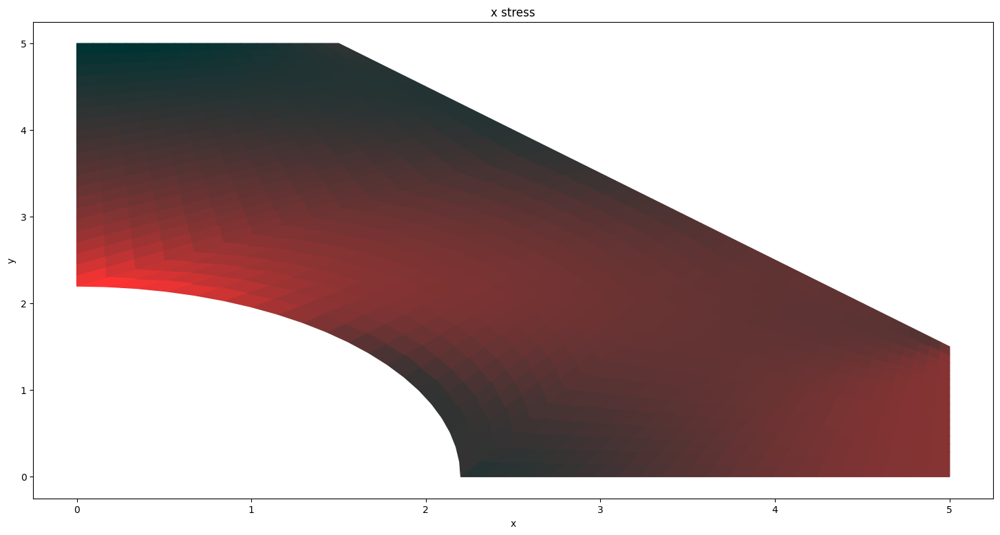

3482
2.8000000000000003


100%|██████████| 2210/2210 [00:00<00:00, 196944.97it/s]


max_dU:  4.043308241180444
max_dU:  6.785045092505851
max_dU:  6.7989764059006434
max_dU:  6.582030017218586
max_dU:  6.1745950454846295
max_dU:  6.0903043776870325
max_dU:  6.013317046351278
max_dU:  5.77354217709454
max_dU:  5.692445285121656
max_dU:  5.6231688407514415
max_dU:  5.458231625071012
max_dU:  5.381469313863968
max_dU:  5.294556993014465
max_dU:  5.16987791154634
max_dU:  5.085012509728393
max_dU:  4.994823088427503
max_dU:  4.927876053034303
max_dU:  4.837304726508671
max_dU:  4.730969274040892
max_dU:  4.665038184134066
max_dU:  4.576283272484944
max_dU:  4.498829087672178
max_dU:  4.400717645357441
max_dU:  4.343914986491976
max_dU:  4.344612899214201
max_dU:  4.65627707481505
max_dU:  4.135210353682941
max_dU:  4.057519170640445
max_dU:  3.996440180262164
max_dU:  3.9154031443083555
max_dU:  3.93975340177327
max_dU:  3.825464709922827
max_dU:  4.282079153824807
max_dU:  3.687837664712524
max_dU:  3.8265999233180388
max_dU:  3.683071581239334
max_dU:  3.538207861401928

100%|██████████| 1024/1024 [00:00<00:00, 1044.16it/s]


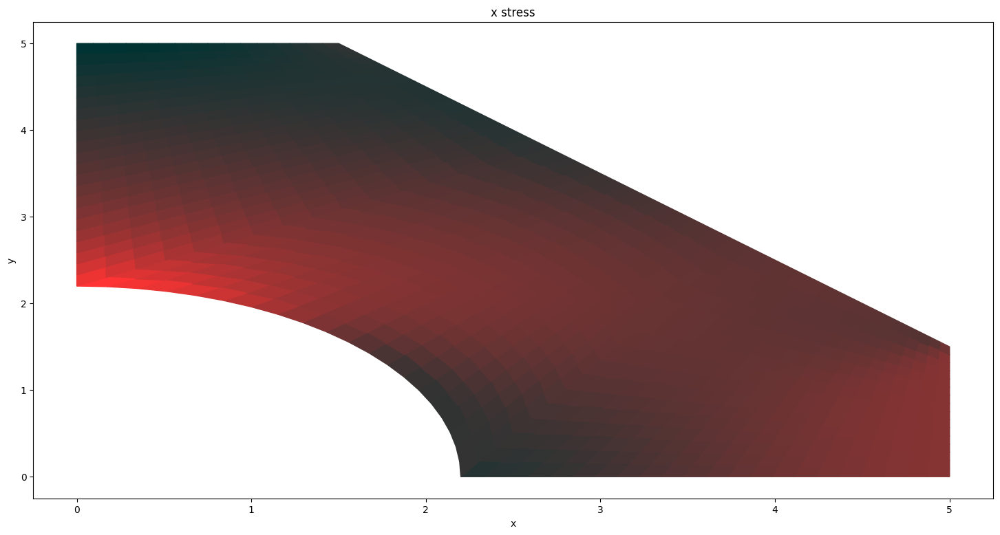

3589
2.9000000000000004


100%|██████████| 2210/2210 [00:00<00:00, 177796.33it/s]


max_dU:  4.040951380259124
max_dU:  6.779220087776717
max_dU:  6.789127864874789
max_dU:  6.568869978844664
max_dU:  6.158630150077926
max_dU:  6.0711364399821495
max_dU:  5.99106440964402
max_dU:  5.7487774156915
max_dU:  5.665002919184889
max_dU:  5.592984698373407
max_dU:  5.425776429769811
max_dU:  5.346595710930504
max_dU:  5.257458225664245
max_dU:  5.13061972040127
max_dU:  5.04363620229208
max_dU:  4.951773412748475
max_dU:  4.885080684639807
max_dU:  4.790232134174401
max_dU:  4.682158931978568
max_dU:  4.6146111892169035
max_dU:  4.524608757268666
max_dU:  4.449996062353095
max_dU:  4.345793708983647
max_dU:  4.287467478832601
max_dU:  4.292076924181778
max_dU:  4.593338234366497
max_dU:  4.0822963613670495
max_dU:  3.996688171141001
max_dU:  3.9424032665136024
max_dU:  3.852116669385344
max_dU:  3.88354702823424
max_dU:  3.769563130180725
max_dU:  4.210711813404226
max_dU:  3.6318709400569142
max_dU:  3.7581045971040377
max_dU:  3.6244133389871744
max_dU:  3.4810052172613664

100%|██████████| 1024/1024 [00:00<00:00, 1035.18it/s]


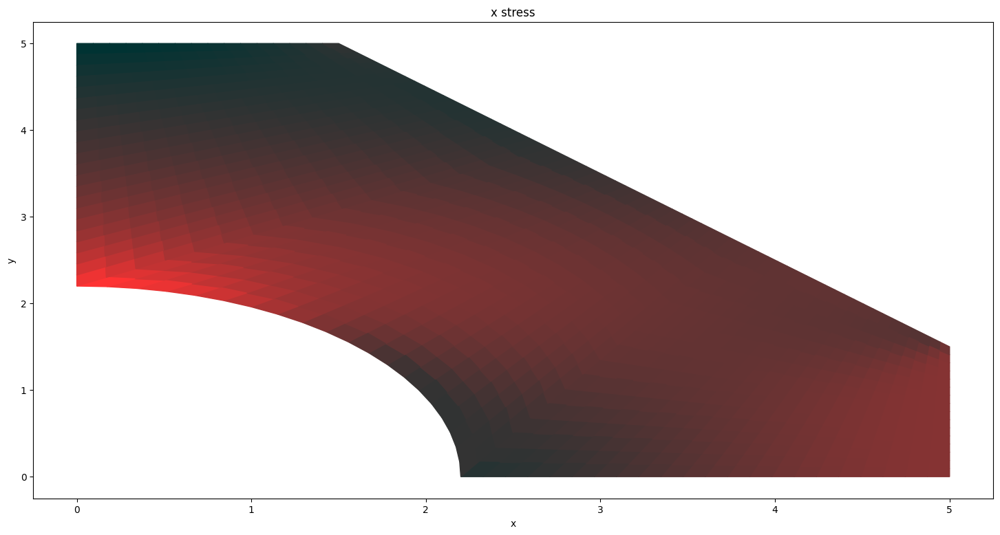

3695


In [ ]:
logs = []
for elem in zs:
    print(elem)
    i = NewMarkc24(verts, triag, left_data, right_data, up_data, down_data, inner_data, float(filename_1[:-2]), E, nu, ro, P, elem*dmp, filename_1, eps=0.01)
    print(i)
    logs.append(i)

In [ ]:
logs

[9955,
 4444,
 3077,
 2562,
 2084,
 1709,
 1248,
 1288,
 1276,
 1134,
 1325,
 1537,
 1715,
 1874,
 2023,
 2164,
 2299,
 2430,
 2557,
 2681,
 2802,
 2920,
 3036,
 3150,
 3263,
 3373,
 3482,
 3589,
 3695]

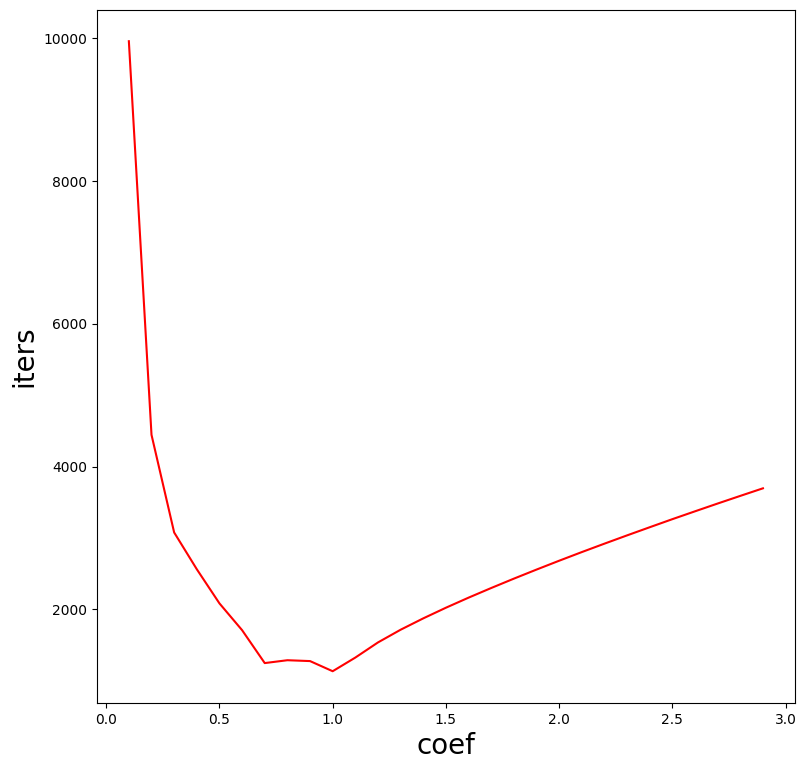

In [ ]:
plt.figure(figsize = (9,9))
plt.plot(zs, logs,color='red')
plt.xlabel('coef', fontsize=20)
plt.ylabel('iters', fontsize=20)
plt.show()

100%|██████████| 2210/2210 [00:00<00:00, 247349.22it/s]


max_dU:  4.08620684745431
max_dU:  6.892477551817903
max_dU:  6.980096029361799
max_dU:  6.82591530101154
max_dU:  6.471946043898085
max_dU:  6.449895695098759
max_dU:  6.433813956335139
max_dU:  6.243676365626434
max_dU:  6.217331161923155
time:  7.405656621799313e-05


100%|██████████| 1024/1024 [00:00<00:00, 1496.06it/s]


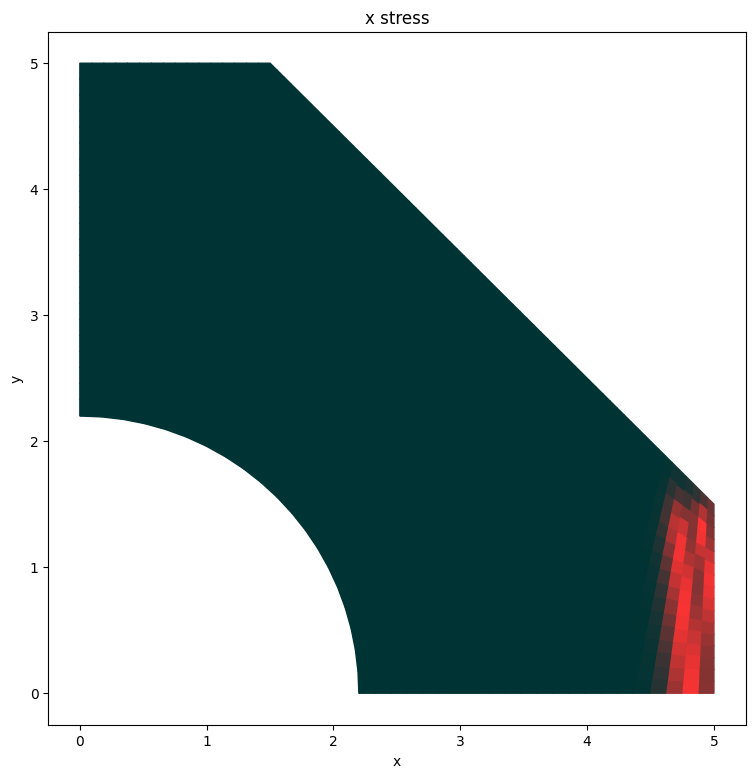

max_dU:  6.204440229079905
max_dU:  6.08628352837893
max_dU:  6.061002239890708
max_dU:  6.022516144868597
max_dU:  5.943755166192291
max_dU:  5.905778950789841
max_dU:  5.855492880388068
max_dU:  5.802556779824137
max_dU:  5.788862460512468
max_dU:  5.722367977895155
time:  0.00016662727399048455


100%|██████████| 1024/1024 [00:00<00:00, 1188.50it/s]


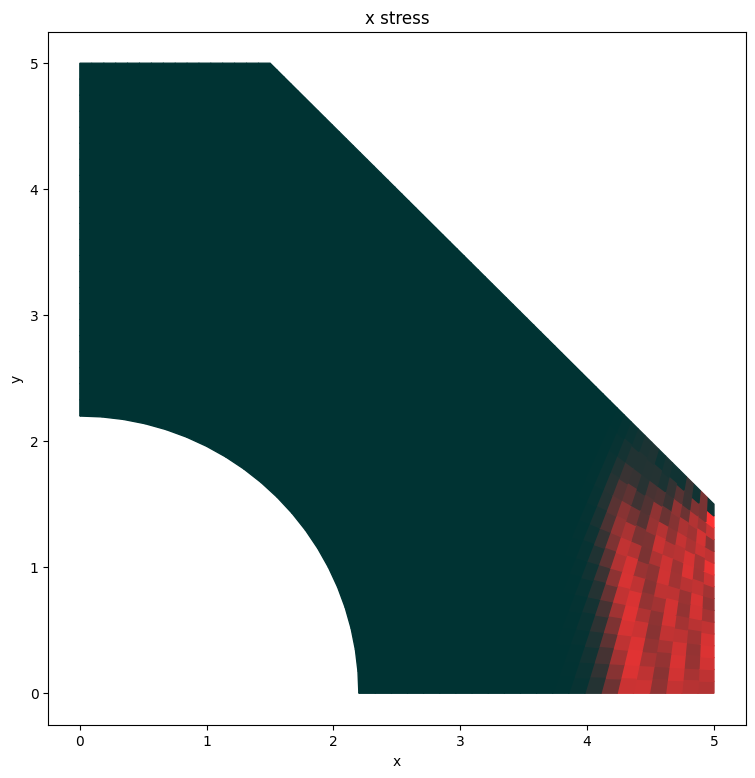

max_dU:  5.696511102087869
max_dU:  5.640835986205345
max_dU:  5.576279648880648
max_dU:  5.542801050400845
max_dU:  5.525135703079058
max_dU:  5.495970158663945
max_dU:  6.000596087569783
max_dU:  5.373871318707121
max_dU:  5.363349838706483
max_dU:  5.328195403230704
time:  0.00025919798176297595


100%|██████████| 1024/1024 [00:01<00:00, 990.78it/s]


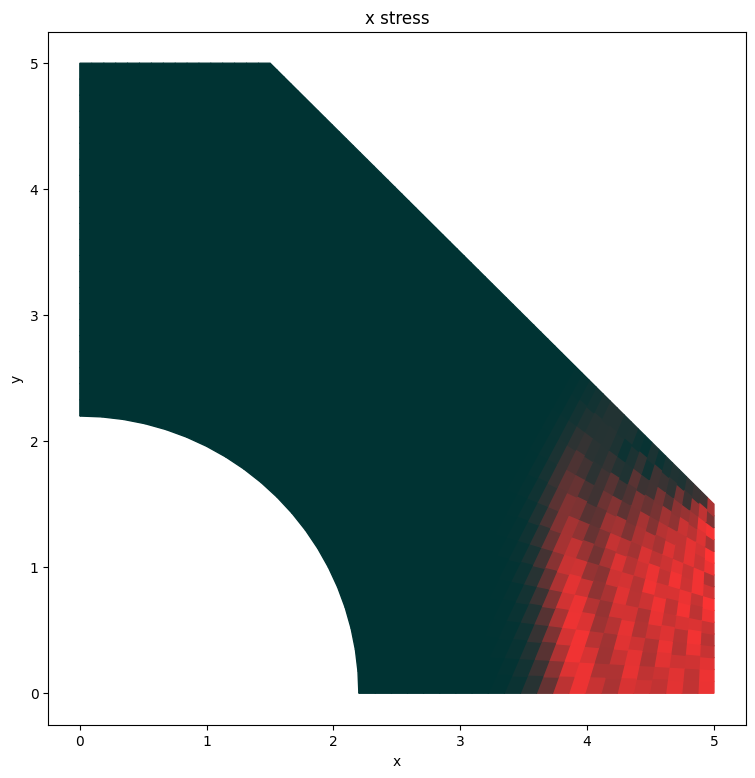

max_dU:  5.287612654859704
max_dU:  5.22482685029239
max_dU:  5.17012149382248
max_dU:  5.883215373889204
max_dU:  5.134300831990583
max_dU:  5.3730246609990315
max_dU:  5.062763414193878
max_dU:  5.002578730420243
max_dU:  5.543705244534222
max_dU:  4.904371247473269
time:  0.0003517686895354671


100%|██████████| 1024/1024 [00:00<00:00, 1272.37it/s]


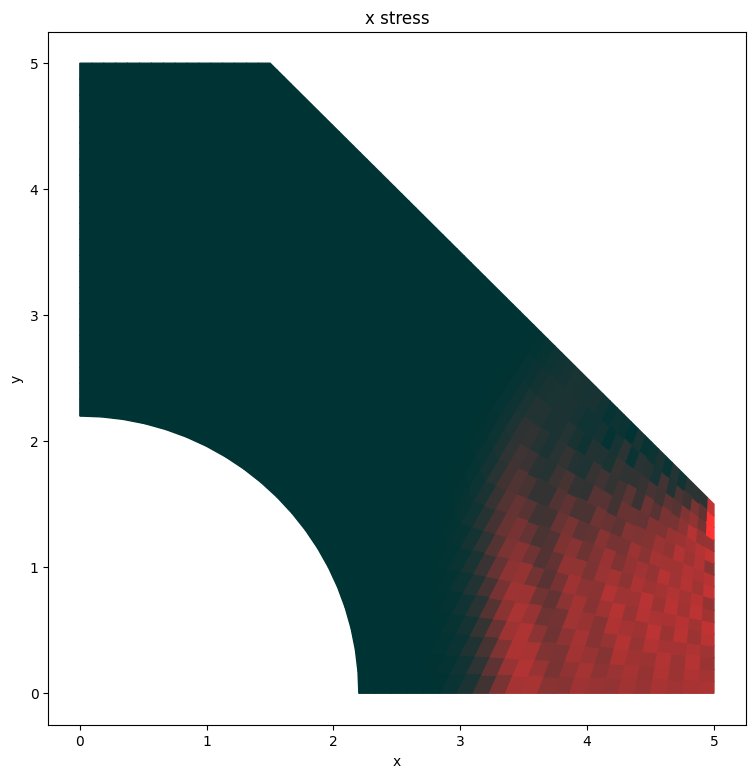

max_dU:  4.835988196924767
max_dU:  5.015767671436494
max_dU:  4.790168751078365
max_dU:  4.764396767936522
max_dU:  5.069806988683289
max_dU:  4.639144616518646
max_dU:  4.796789598093977
max_dU:  5.001873729722485
max_dU:  4.460731058358978
max_dU:  4.43922456917376
time:  0.00044433939730795826


100%|██████████| 1024/1024 [00:00<00:00, 1366.80it/s]


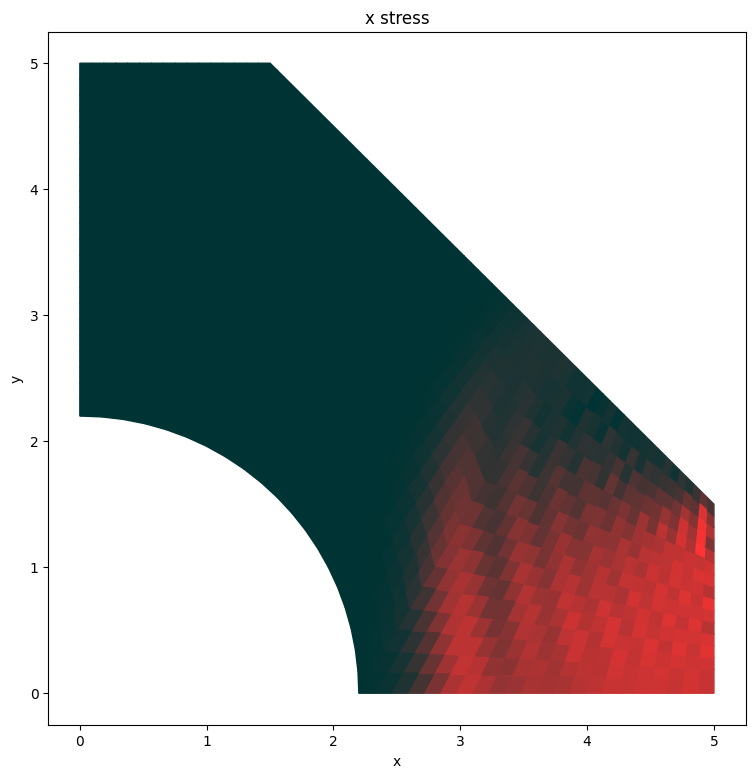

max_dU:  4.414302657718407
max_dU:  4.379226778995283
max_dU:  4.391602848831678
max_dU:  4.491650835375486
max_dU:  4.484459283151976
max_dU:  4.481784349728986
max_dU:  4.719941619401968
max_dU:  4.489116121562848
max_dU:  4.484978530130432
max_dU:  4.382307357019603
time:  0.0005369101050804495


100%|██████████| 1024/1024 [00:00<00:00, 1445.93it/s]


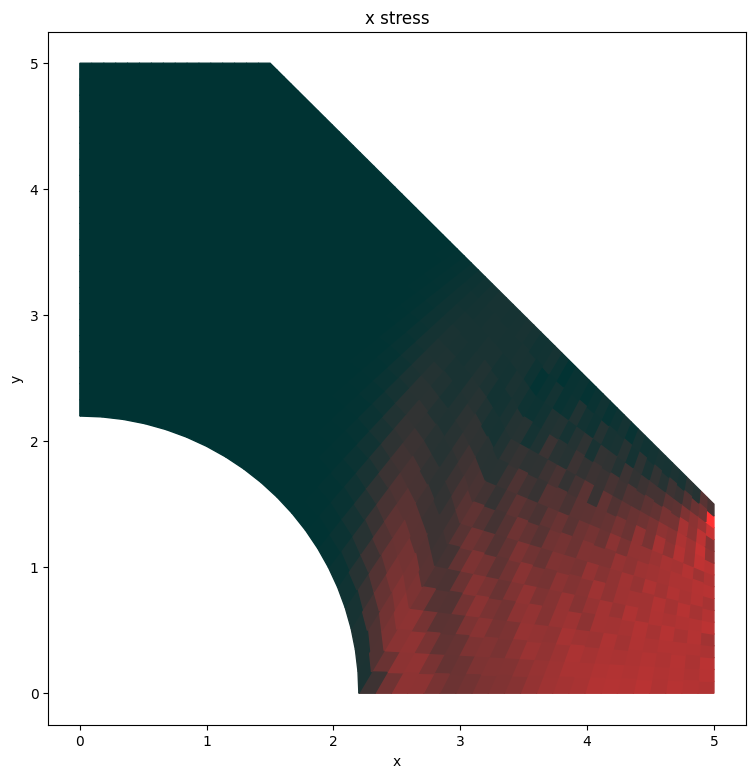

max_dU:  4.239905394562463
max_dU:  4.2847877217895265
max_dU:  4.755151251762222
max_dU:  5.434010585434312
max_dU:  6.031706385828148
max_dU:  6.511689186938078
max_dU:  6.89446023138576
max_dU:  7.121561318872031
max_dU:  7.181703394317802
max_dU:  7.077317788127244
time:  0.0006294808128529406


100%|██████████| 1024/1024 [00:00<00:00, 1279.74it/s]


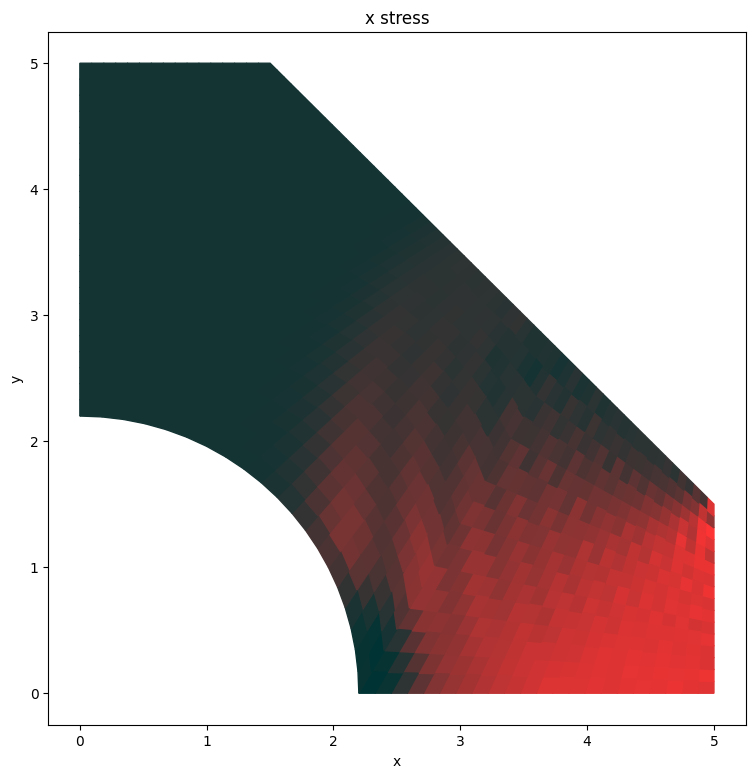

max_dU:  6.824321044877014
max_dU:  6.450187749940729
max_dU:  5.990675104342089
max_dU:  5.566362674861934
max_dU:  5.48312396115159
max_dU:  5.674365542991991
max_dU:  5.747401148195299
max_dU:  5.706287290911977
max_dU:  5.789356501624791
max_dU:  5.777778084982024
time:  0.0007220515206254318


100%|██████████| 1024/1024 [00:00<00:00, 1213.83it/s]


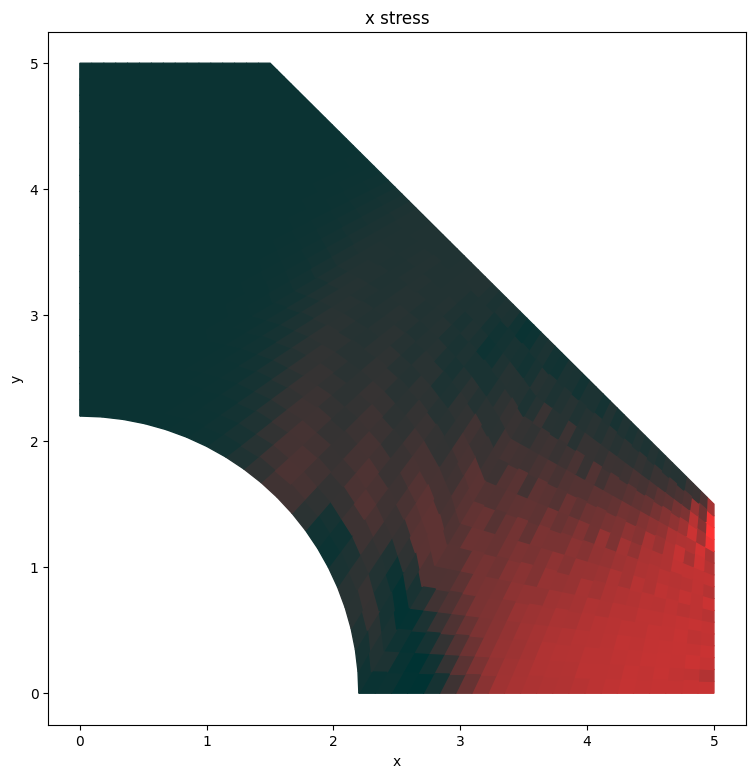

max_dU:  5.648635258212796
max_dU:  5.545058583817625
max_dU:  5.529480248436009
max_dU:  5.629807723531292
max_dU:  5.705715927374928
max_dU:  5.663678237273181
max_dU:  5.502273799002742
max_dU:  5.259004115886889
max_dU:  5.1055829534759125
max_dU:  4.974822941586668
time:  0.000814622228397923


100%|██████████| 1024/1024 [00:01<00:00, 950.70it/s]


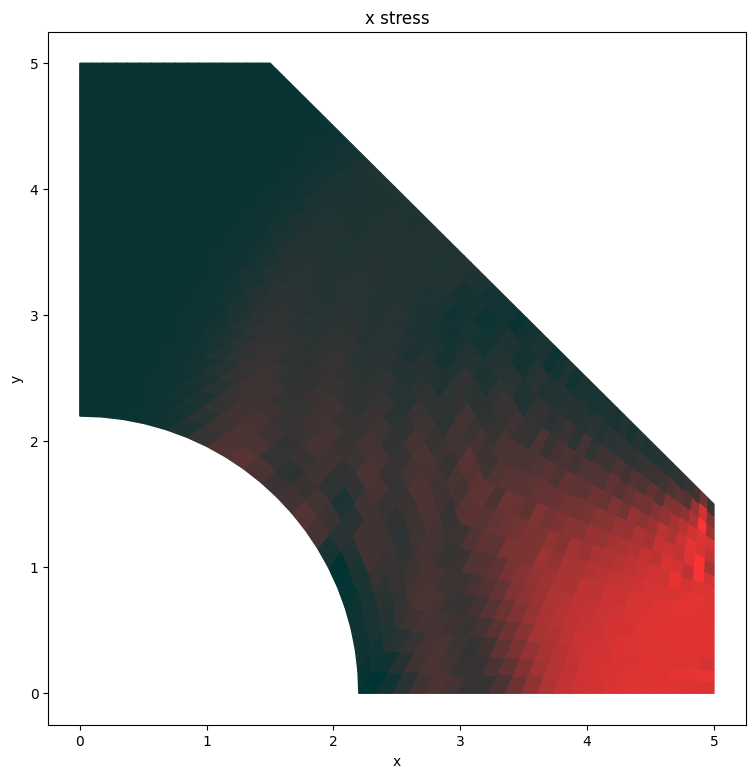

max_dU:  4.837546674926929
max_dU:  4.718211769649334
max_dU:  4.622833508566585
max_dU:  4.449386279504757
max_dU:  4.397973826706852
max_dU:  4.393898312978757
max_dU:  4.37831895969756
max_dU:  4.261971646294023
max_dU:  4.135187809185863
max_dU:  4.152690022657285
time:  0.0009071929361704141


100%|██████████| 1024/1024 [00:00<00:00, 1190.87it/s]


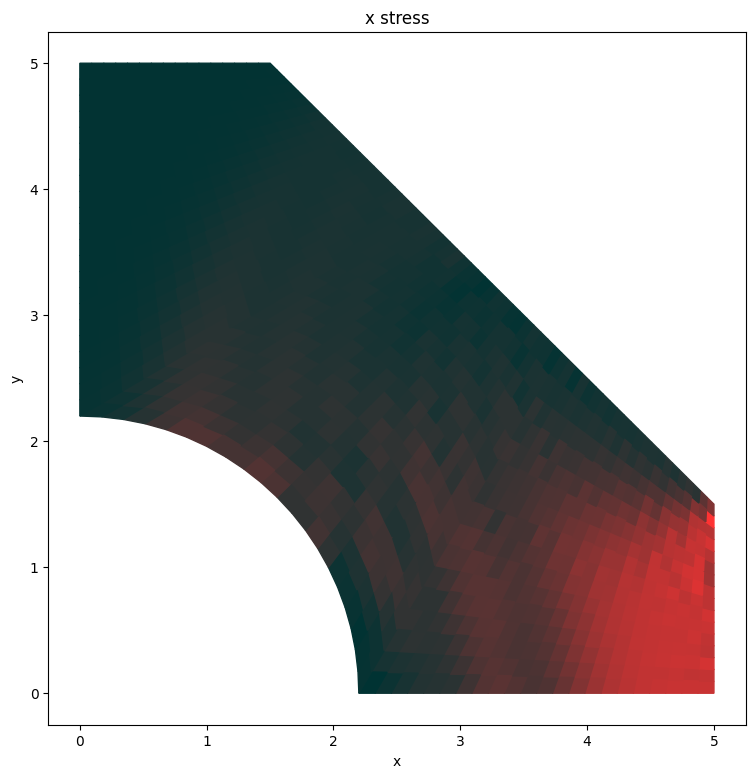

max_dU:  4.136274481593468
max_dU:  4.089817518626107
max_dU:  4.124360775794692
max_dU:  4.211940461661671
max_dU:  4.267105095318886
max_dU:  4.279130236951843
max_dU:  4.244392303604226
max_dU:  4.166581333912191
max_dU:  4.055453605610341
max_dU:  3.9244378170456495
time:  0.0009997636439429056


100%|██████████| 1024/1024 [00:00<00:00, 1413.46it/s]


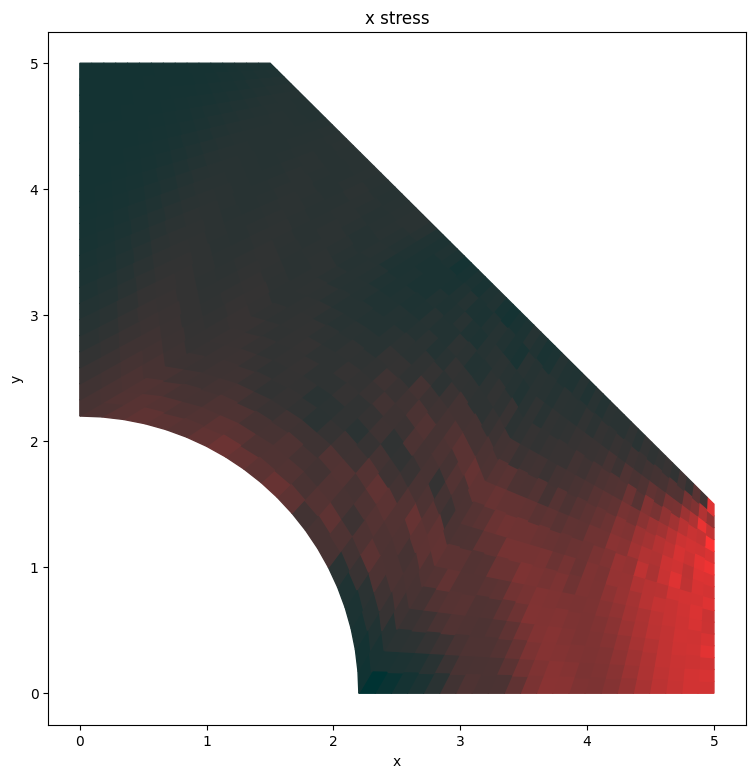

max_dU:  3.799254120443666
max_dU:  3.6856893847395145
max_dU:  3.598050125942797
max_dU:  3.5261478235257244
max_dU:  3.642888759717044
max_dU:  3.3571119581377546
max_dU:  3.3293136054876546
max_dU:  3.3041559241424467
max_dU:  3.6472993025518328
max_dU:  3.179282391602162
time:  0.0010923343517153978


100%|██████████| 1024/1024 [00:00<00:00, 1169.21it/s]


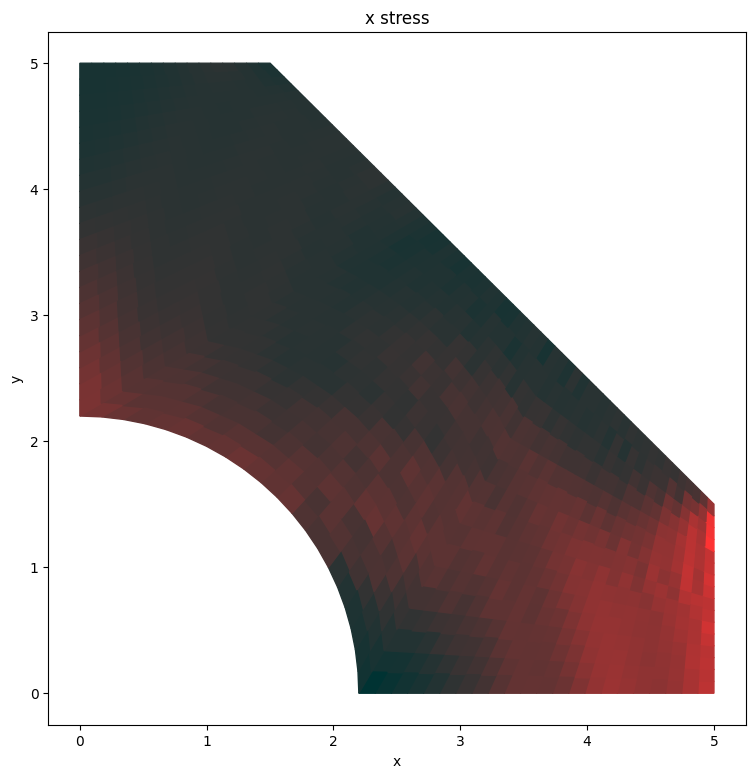

max_dU:  3.116439062525188
max_dU:  3.3085369150573185
max_dU:  3.440256370342066
max_dU:  4.027732638515621
max_dU:  3.8656583150374093
max_dU:  4.0487874757662725
max_dU:  4.305538037994677
max_dU:  4.2548009723436335
max_dU:  4.093452609352936
max_dU:  4.125229652706118
time:  0.00118490505948789


100%|██████████| 1024/1024 [00:00<00:00, 1225.29it/s]


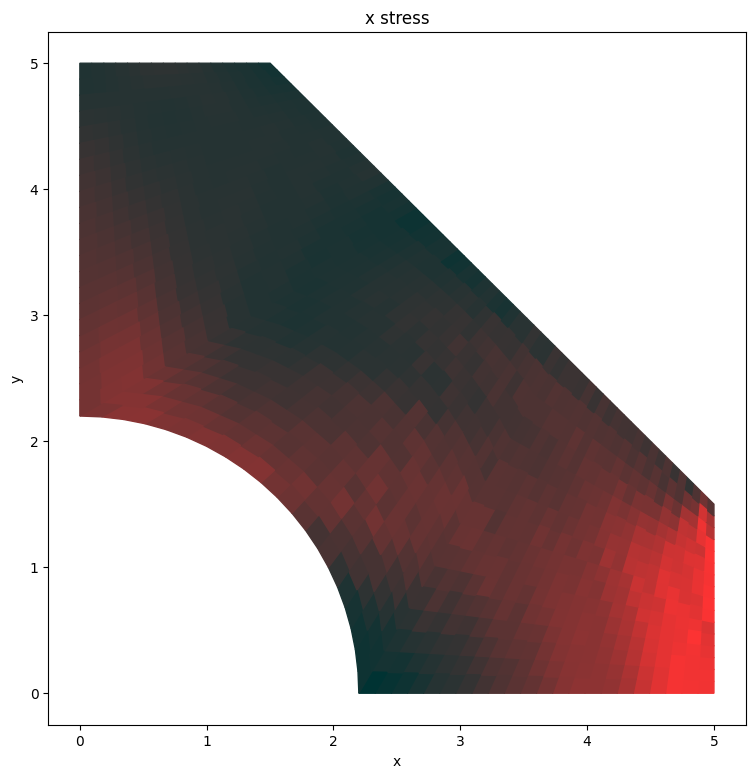

max_dU:  4.381373336504149
max_dU:  4.463920163426936
max_dU:  4.1555692360541086
max_dU:  4.63862543909603
max_dU:  4.262287306881105
max_dU:  4.111248019880521
max_dU:  5.133798068354068
max_dU:  3.7021786526412495
max_dU:  4.005826996144425
max_dU:  3.767539864359612
time:  0.0012774757672603823


100%|██████████| 1024/1024 [00:00<00:00, 1234.40it/s]


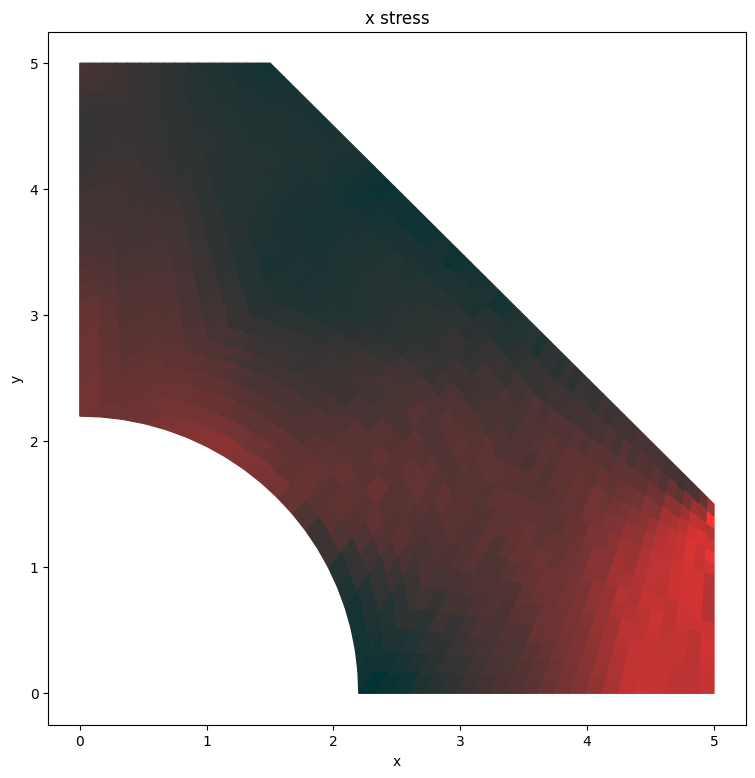

max_dU:  3.395636332955124
max_dU:  3.342723169343409
max_dU:  3.916883370732365
max_dU:  3.4613286690952147
max_dU:  3.4362999464510438
max_dU:  3.8834861188151044
max_dU:  3.4676051573471782
max_dU:  3.5545950885651365
max_dU:  3.649023066835783
max_dU:  3.318760409769093
time:  0.0013700464750328746


100%|██████████| 1024/1024 [00:00<00:00, 1194.95it/s]


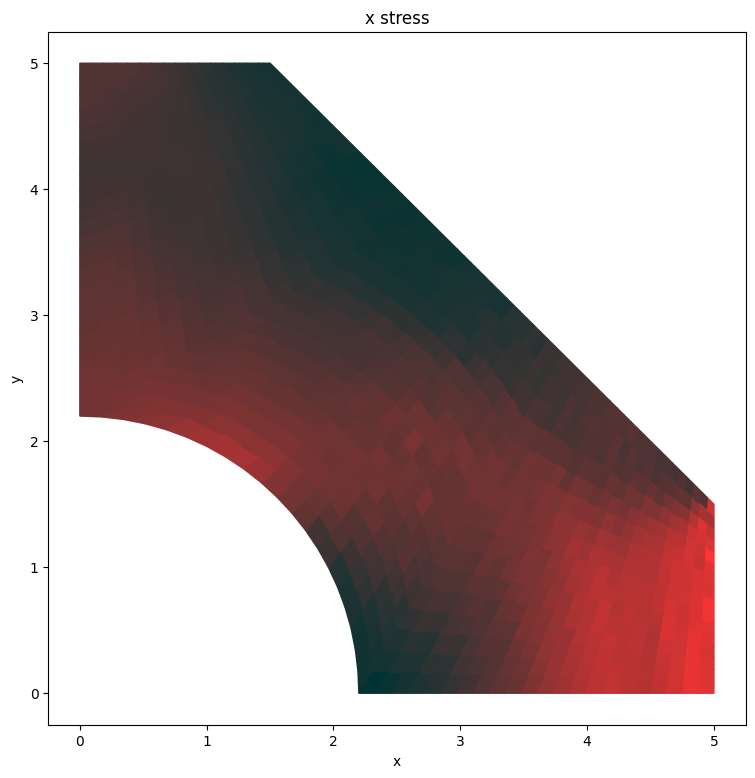

max_dU:  3.381603702261924
max_dU:  3.552482908312134
max_dU:  3.460977703987881
max_dU:  3.304406293315969
max_dU:  3.4729193136055825
max_dU:  3.2137450935511973
max_dU:  3.1190407169954604
max_dU:  3.253210461058581
max_dU:  3.147450047049308
max_dU:  3.017434305587766
time:  0.0014626171828053668


100%|██████████| 1024/1024 [00:00<00:00, 1116.46it/s]


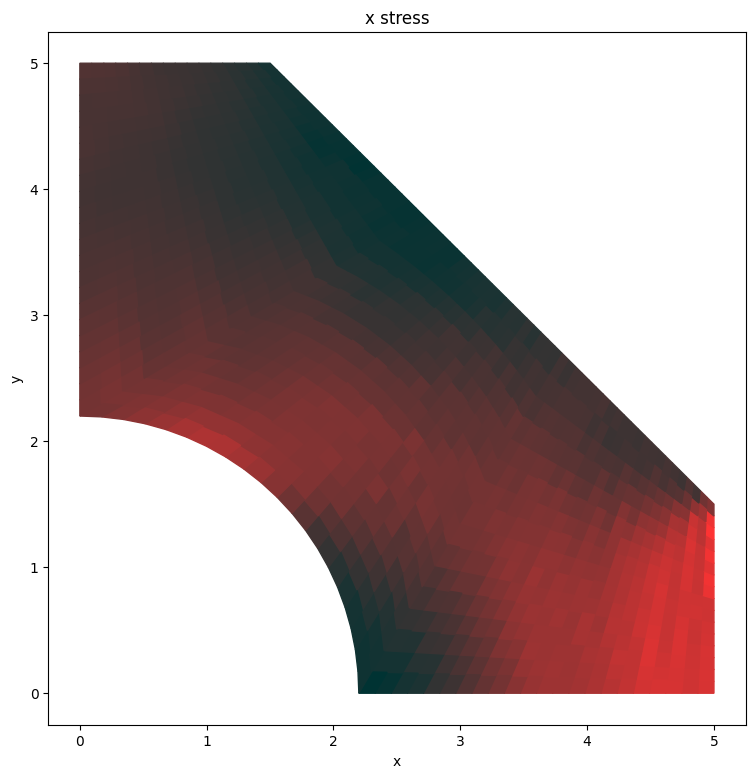

max_dU:  3.588678846941619
max_dU:  3.1493322346011903
max_dU:  3.303303232130905
max_dU:  3.430451948779146
max_dU:  3.3259122074620624
max_dU:  3.0272354657481126
max_dU:  3.52046770541975
max_dU:  3.4750458359205103
max_dU:  2.9744520574104043
max_dU:  3.294903296248772
time:  0.001555187890577859


100%|██████████| 1024/1024 [00:00<00:00, 1162.73it/s]


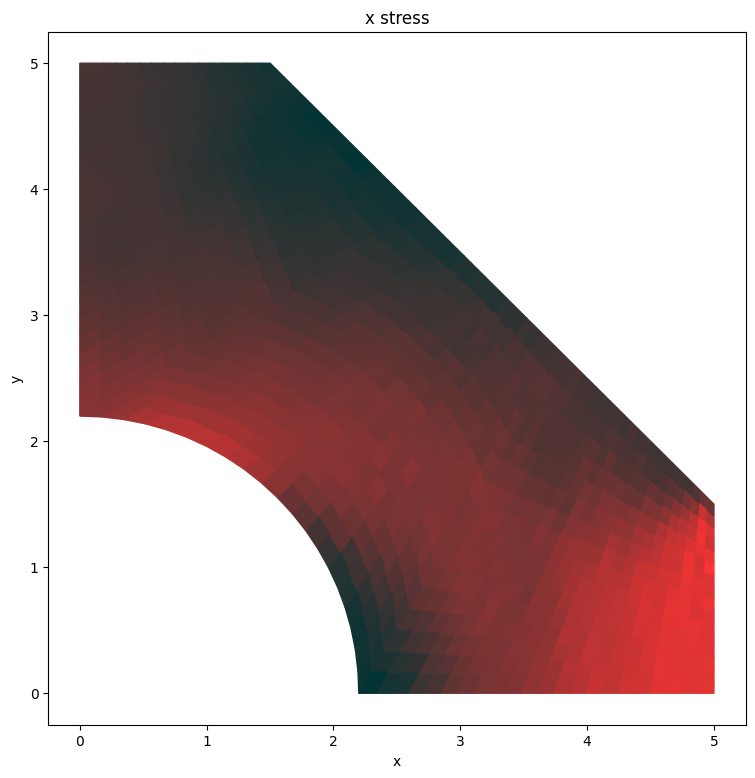

max_dU:  3.404795834011207
max_dU:  3.5351560424887687
max_dU:  3.0927193468460907
max_dU:  3.2397205368102004
max_dU:  3.269894496871292
max_dU:  3.0170131243056866
max_dU:  3.479962893842064
max_dU:  2.7921704975754027
max_dU:  3.4065323685320648
max_dU:  3.2830761804173636
time:  0.0016477585983503513


100%|██████████| 1024/1024 [00:00<00:00, 1212.28it/s]


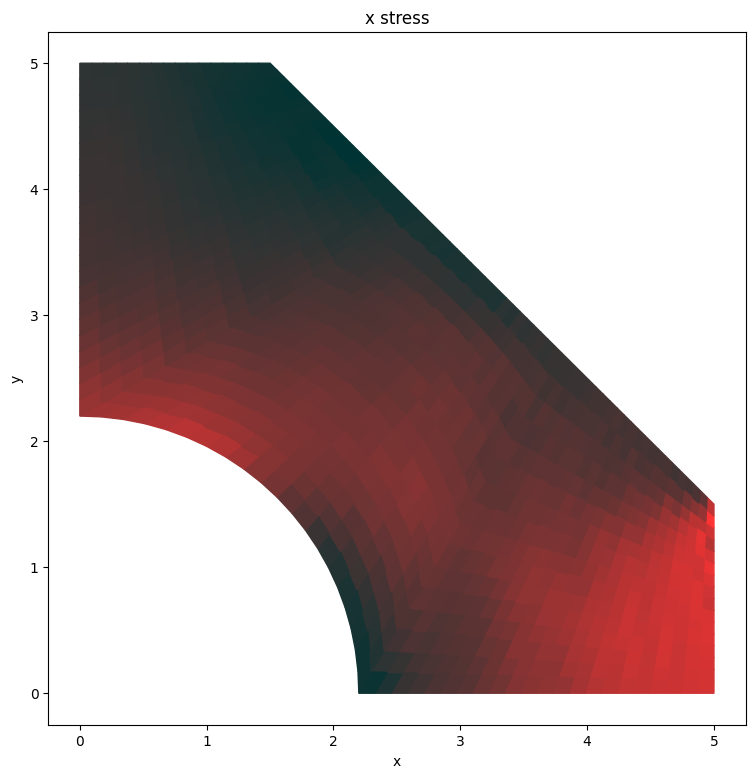

max_dU:  2.8737989300904676
max_dU:  2.918856530626384
max_dU:  3.0820787141244836
max_dU:  3.234244223502902
max_dU:  3.256702079261477
max_dU:  3.252934080036745
max_dU:  3.3035820491412546
max_dU:  3.283372072712104
max_dU:  3.333342552014195
max_dU:  3.3516174532718885
time:  0.0017403293061228435


100%|██████████| 1024/1024 [00:00<00:00, 1196.51it/s]


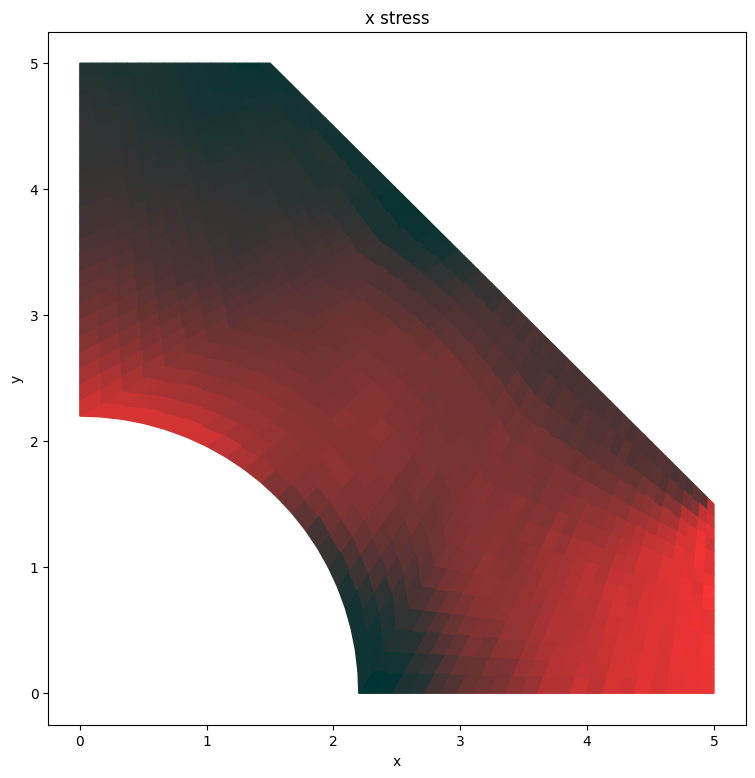

max_dU:  3.3295704949196314
max_dU:  3.261798907632916
max_dU:  3.1453119185656635
max_dU:  2.9806652359085803
max_dU:  2.7752599266217235
max_dU:  2.747918373241337
max_dU:  2.783164917750602
max_dU:  3.2688981459104487
max_dU:  2.8755654161431137
max_dU:  2.8256000302273927
time:  0.0018329000138953358


100%|██████████| 1024/1024 [00:00<00:00, 1326.15it/s]


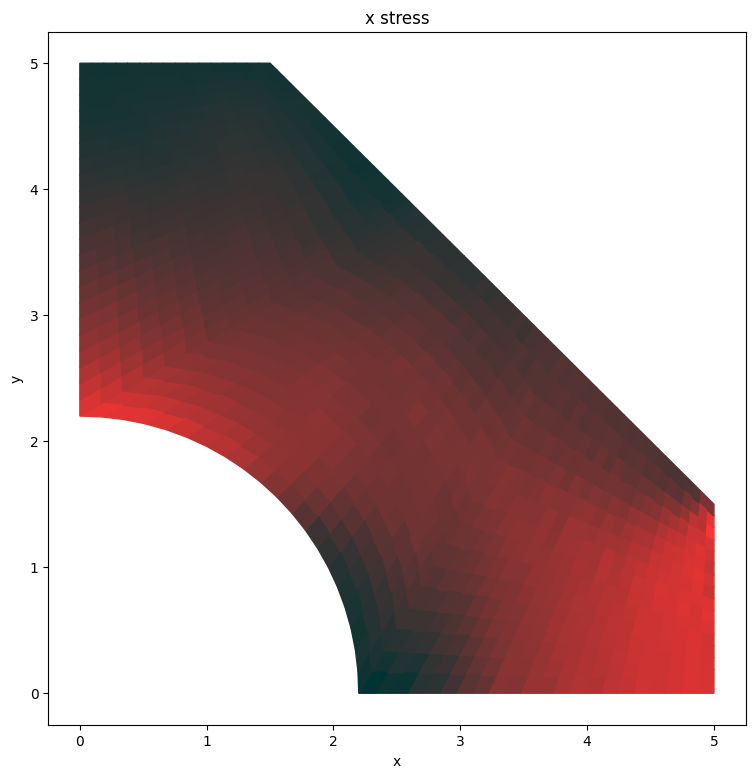

max_dU:  2.7793441999434947
max_dU:  2.8144778291179247
max_dU:  2.7441080392655923
max_dU:  2.980371904893267
max_dU:  2.9226148598112234
max_dU:  2.9378836241003614
max_dU:  2.807341943445128
max_dU:  2.7542909703931593
max_dU:  2.791552458856963
max_dU:  2.7206848127887633
time:  0.001925470721667828


100%|██████████| 1024/1024 [00:00<00:00, 1203.40it/s]


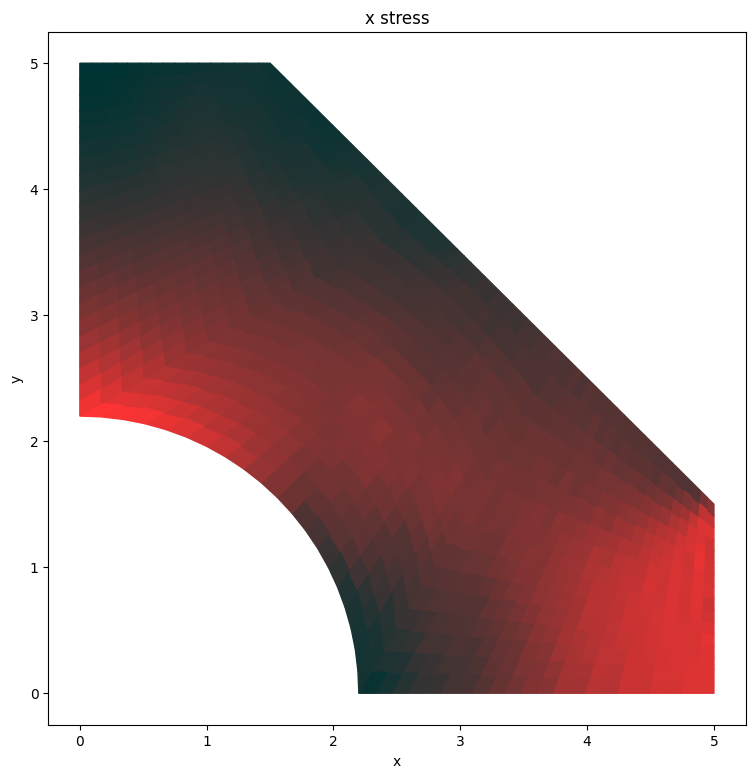

max_dU:  2.5999383714905164
max_dU:  2.423972857169301
max_dU:  2.5047680984861325
max_dU:  2.522447465788543
max_dU:  2.5579904465116736
max_dU:  2.541976029865976
max_dU:  2.4817053233717075
max_dU:  2.4658396190479692
max_dU:  2.463336957620604
max_dU:  2.4017852388952745
time:  0.0020180414294403187


100%|██████████| 1024/1024 [00:01<00:00, 887.35it/s]


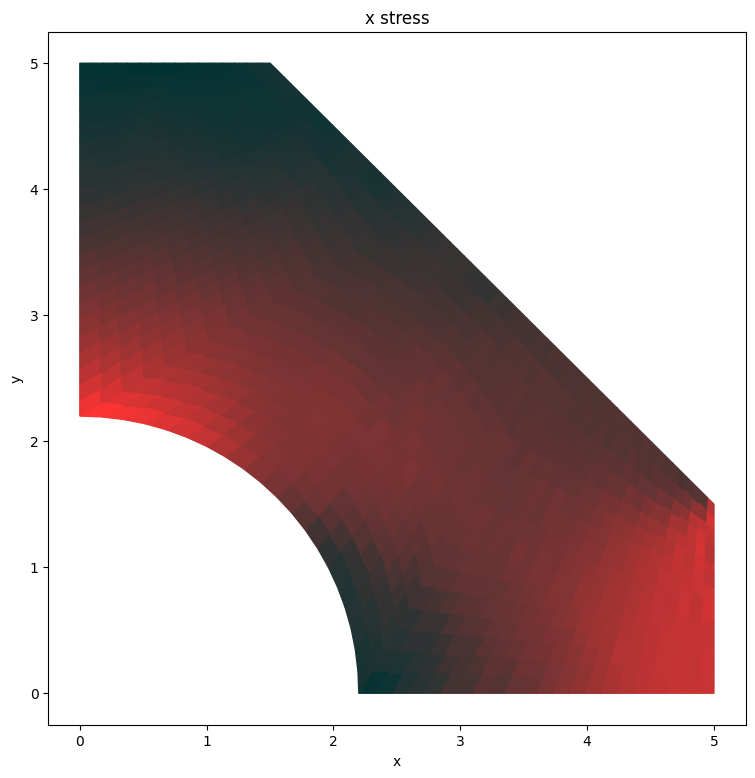

max_dU:  2.34738747917332
max_dU:  2.30558082025607
max_dU:  2.299258647480515
max_dU:  2.2581820676994244
max_dU:  2.2085648867758034
max_dU:  2.1682609327549187
max_dU:  2.135334863888444
max_dU:  2.092735569087608
max_dU:  2.023917495624636
max_dU:  1.995640860858363
time:  0.002110612137212809


100%|██████████| 1024/1024 [00:00<00:00, 1034.21it/s]


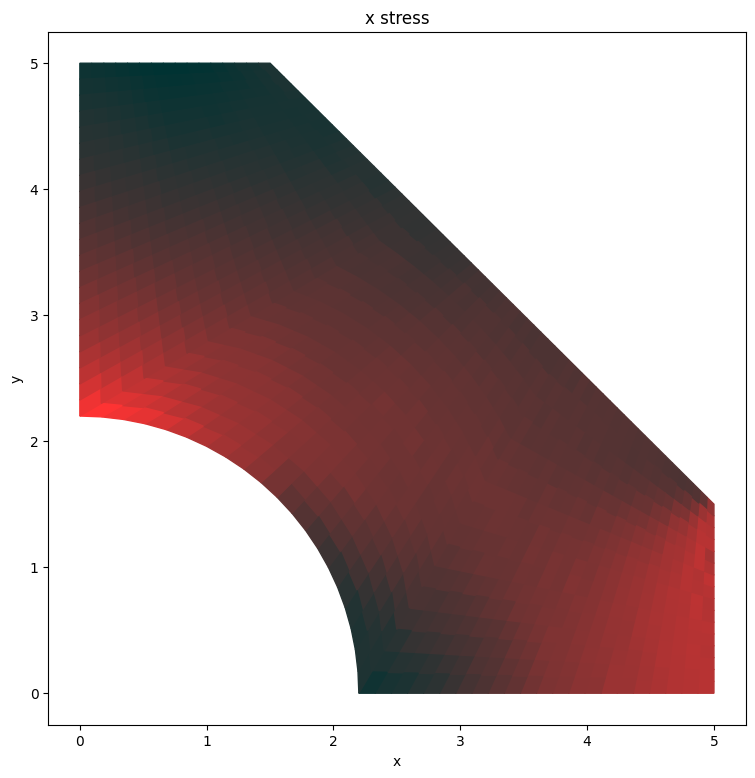

max_dU:  1.9923773026979275
max_dU:  2.0218350354843
max_dU:  2.0476432004783196
max_dU:  1.9527636725136728
max_dU:  2.0517658722461993
max_dU:  2.1176547330813182
max_dU:  1.8680329012099401
max_dU:  2.4178926849116777
max_dU:  2.1228241828921792
max_dU:  2.2946456833591906
time:  0.002203182844985299


100%|██████████| 1024/1024 [00:00<00:00, 1208.03it/s]


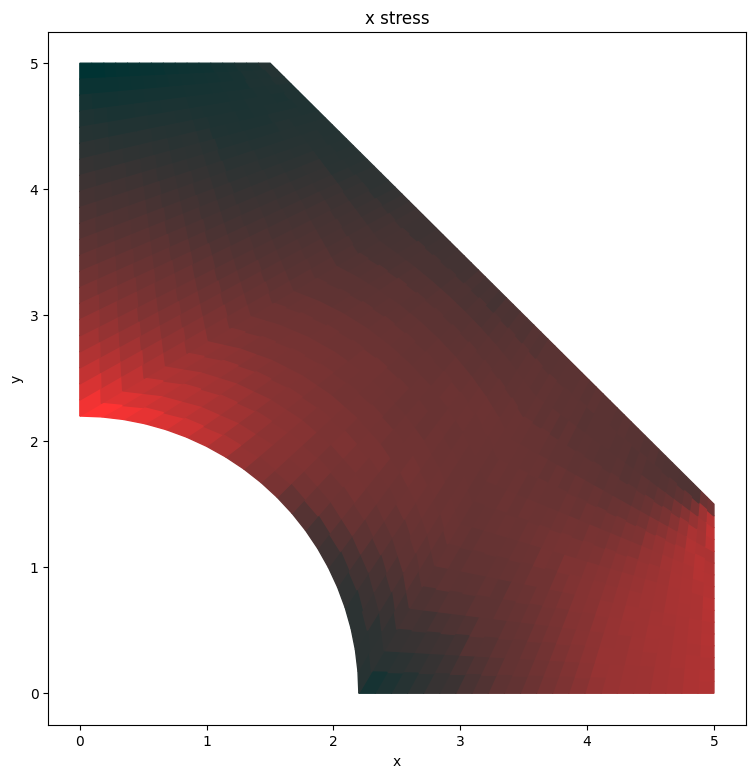

max_dU:  2.140197641976037
max_dU:  2.0212544277374453
max_dU:  2.1917976857162564
max_dU:  2.5536496723328677
max_dU:  1.9509637539743991
max_dU:  2.3185776638971927
max_dU:  2.1003375743425474
max_dU:  2.451165303407869
max_dU:  2.0179182282538903
max_dU:  2.87772544092725
time:  0.002295753552757789


100%|██████████| 1024/1024 [00:00<00:00, 1246.75it/s]


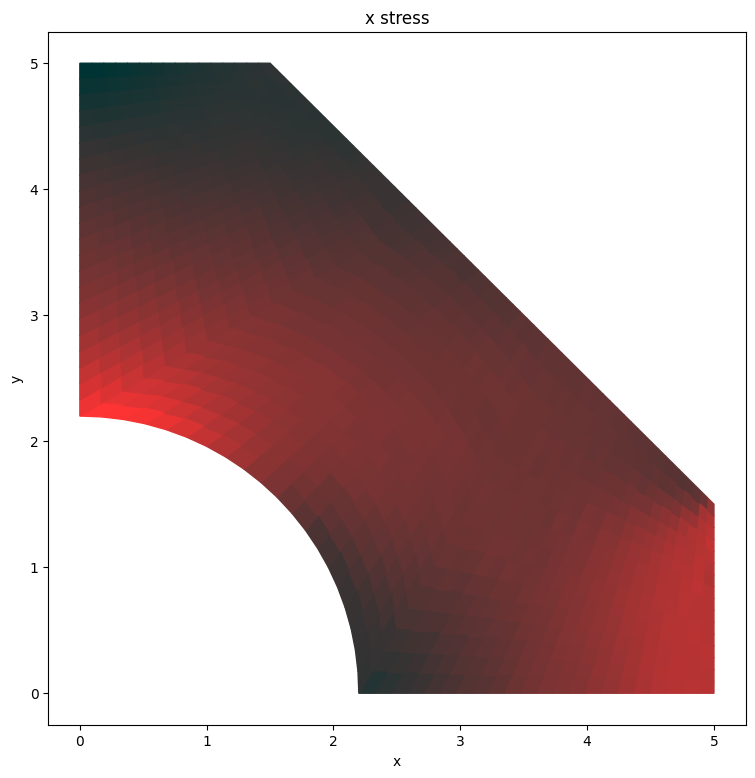

max_dU:  2.02333667988412
max_dU:  2.4629704143842908
max_dU:  2.5194157787718723
max_dU:  1.9207157136650148
max_dU:  2.020221663126458
max_dU:  2.0706628610805433
max_dU:  2.0730732730868575
max_dU:  1.8680391517053447
max_dU:  2.034870802545988
max_dU:  2.0067615311043894
time:  0.002388324260530279


100%|██████████| 1024/1024 [00:00<00:00, 1181.26it/s]


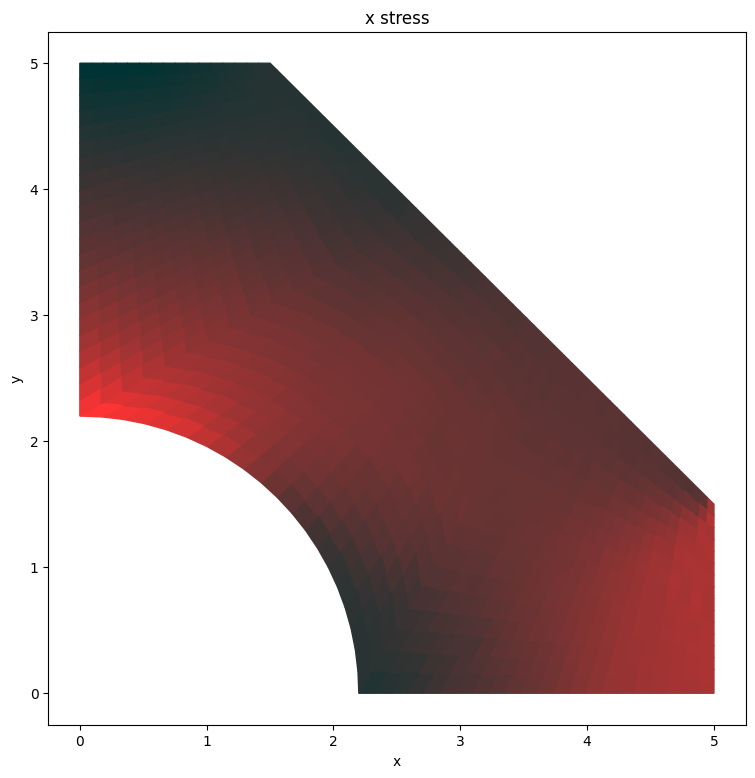

max_dU:  1.8418821280279916
max_dU:  2.0689074587045146
max_dU:  1.7997367871839212
max_dU:  2.1537683772049396
max_dU:  1.8089844884562483
max_dU:  1.78945439248738
max_dU:  1.7937403301936221
max_dU:  2.0311314475259885
max_dU:  1.7205511891294036
max_dU:  1.7086661647523405
time:  0.002480894968302769


100%|██████████| 1024/1024 [00:00<00:00, 1122.13it/s]


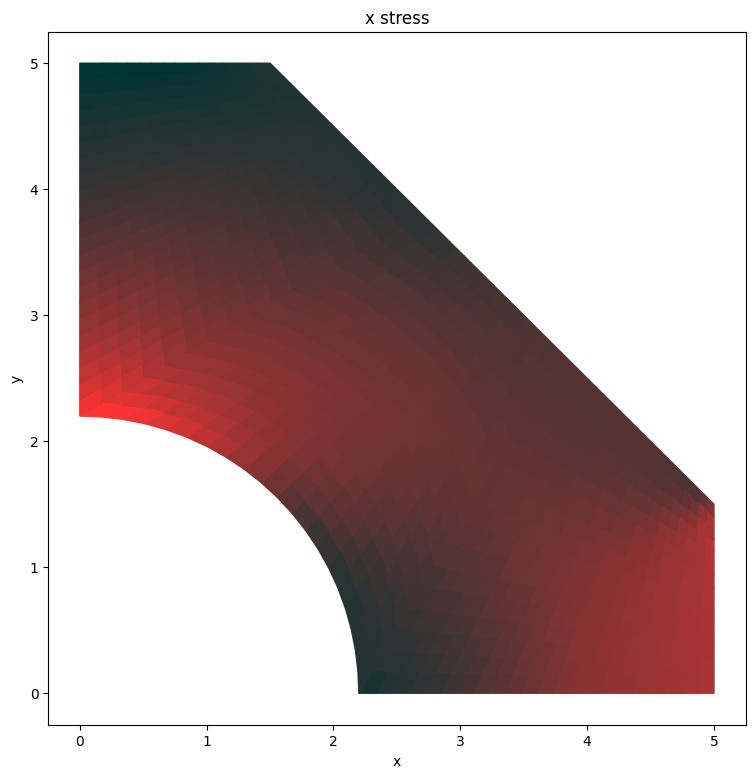

max_dU:  1.6859563110113256
max_dU:  1.8213822510937803
max_dU:  1.851790501339588
max_dU:  1.929046877735324
max_dU:  1.8176976661343633
max_dU:  1.7093919212643194
max_dU:  1.6458989519037617
max_dU:  1.7202046930644679
max_dU:  1.7134888385377078
max_dU:  1.7090219347396893
time:  0.002573465676075259


100%|██████████| 1024/1024 [00:01<00:00, 957.94it/s]


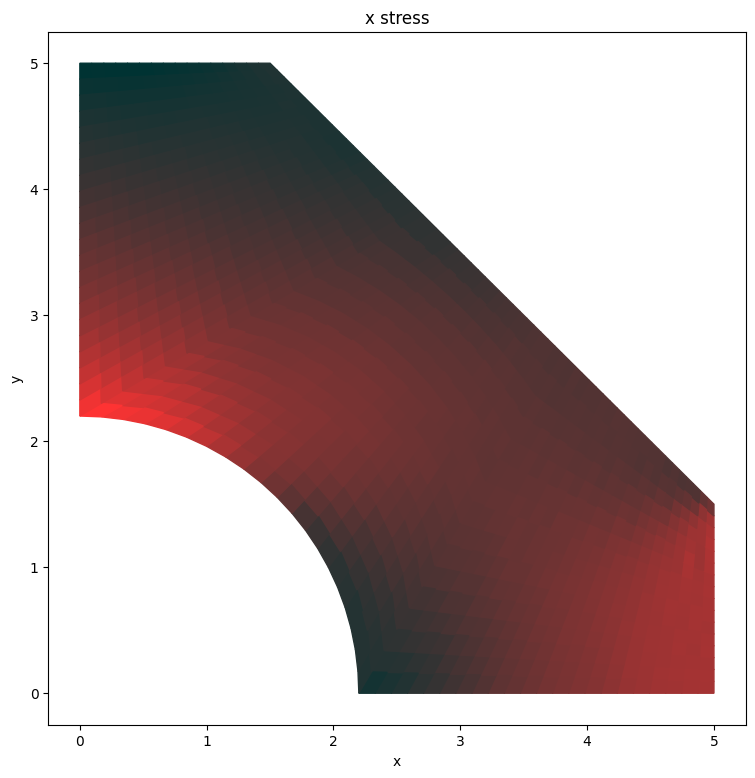

max_dU:  1.7281153951255883
max_dU:  1.7438741563454496
max_dU:  1.8338761896085087
max_dU:  1.7118916471317562
max_dU:  1.6707872507752157
max_dU:  1.7233337201553782
max_dU:  1.7422944462183836
max_dU:  1.727332321274589
max_dU:  1.7226396368303698
max_dU:  1.7231804930423693
time:  0.0026660363838477493


100%|██████████| 1024/1024 [00:01<00:00, 961.09it/s] 


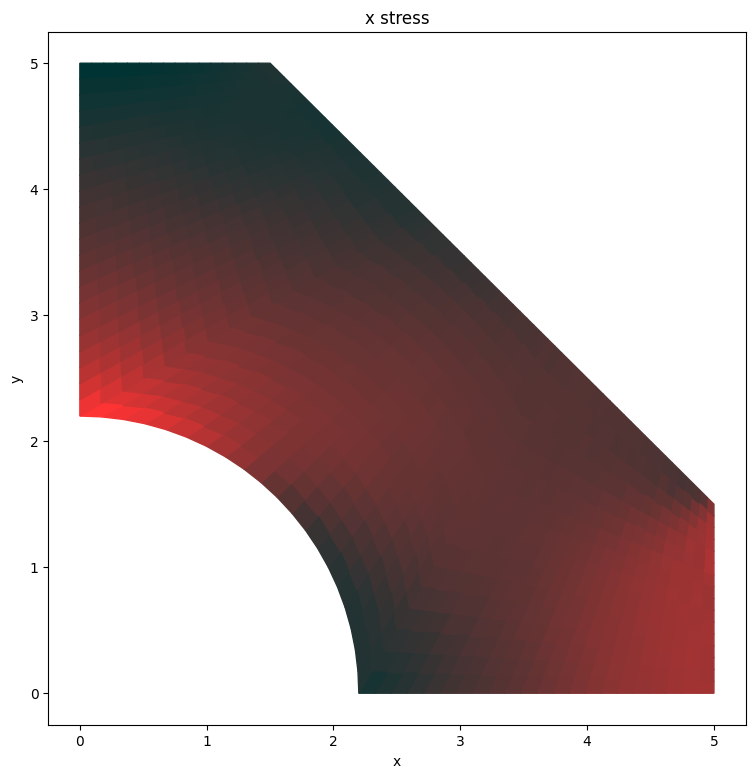

max_dU:  1.7197299481815038
max_dU:  1.7024140501513463
max_dU:  1.6623531976911219
max_dU:  1.6772681367927518
max_dU:  1.68428459741066
max_dU:  1.6733050754190733
max_dU:  1.6738767239051724
max_dU:  1.7078029822472842
max_dU:  1.727947959871371
max_dU:  1.7347670630984982
time:  0.0027586070916202393


100%|██████████| 1024/1024 [00:00<00:00, 1096.86it/s]


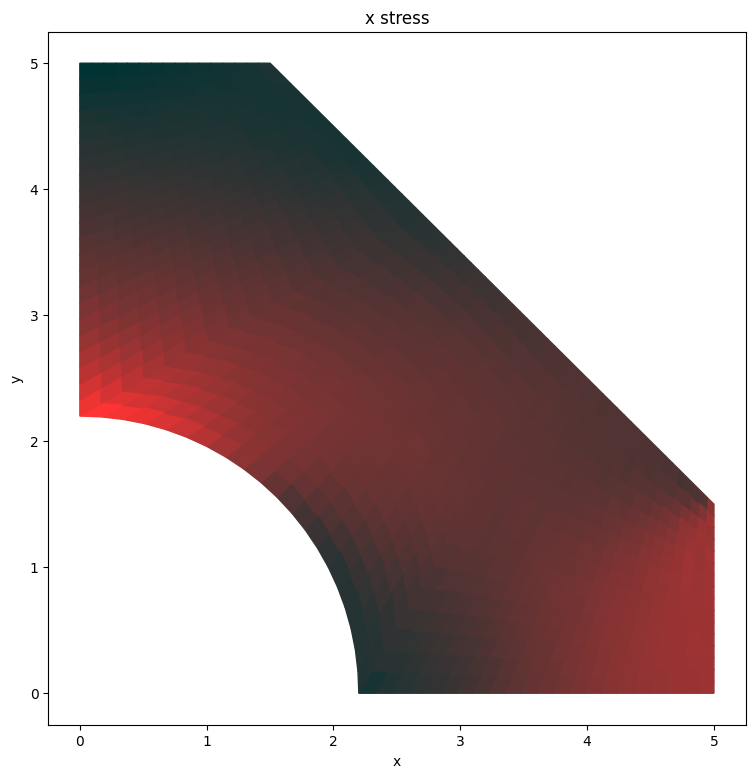

max_dU:  1.7461126831647584
max_dU:  1.785089592225442
max_dU:  1.7485259926949563
max_dU:  1.7458294079999093
max_dU:  1.7470633692325024
max_dU:  1.7290464172745152
max_dU:  1.7100350260199628
max_dU:  1.7490918415566266
max_dU:  1.6158507039355725
max_dU:  1.6025113498508476
time:  0.0028511777993927294


100%|██████████| 1024/1024 [00:00<00:00, 1129.40it/s]


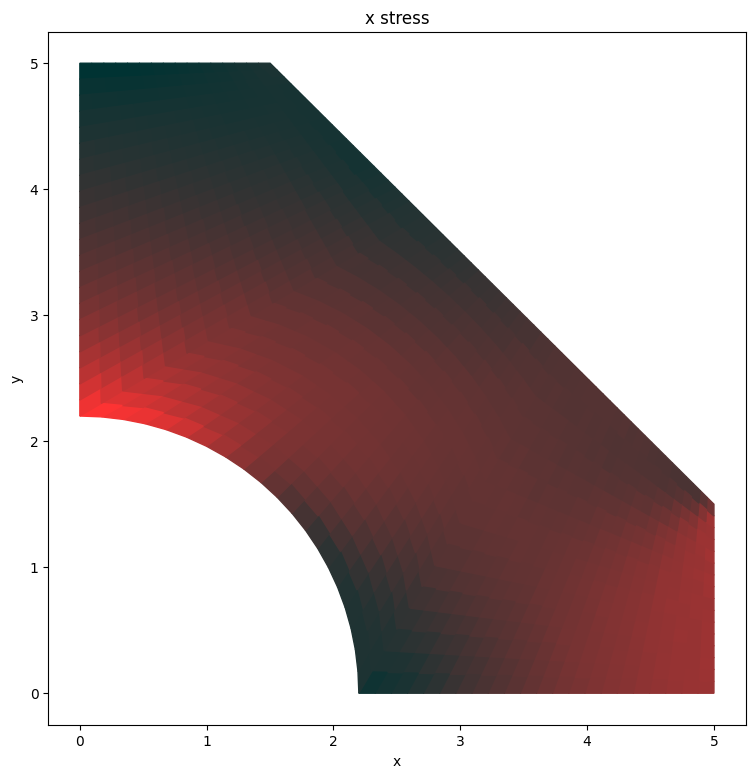

max_dU:  1.6374514673007674
max_dU:  1.581449993016272
max_dU:  1.6220988535196479
max_dU:  1.6768584927164119
max_dU:  1.7064079259514444
max_dU:  1.7383478113849014
max_dU:  1.7706052981812628
max_dU:  1.7724715139099843
max_dU:  1.730044813706112
max_dU:  1.7164905277749989
time:  0.0029437485071652195


100%|██████████| 1024/1024 [00:00<00:00, 1113.15it/s]


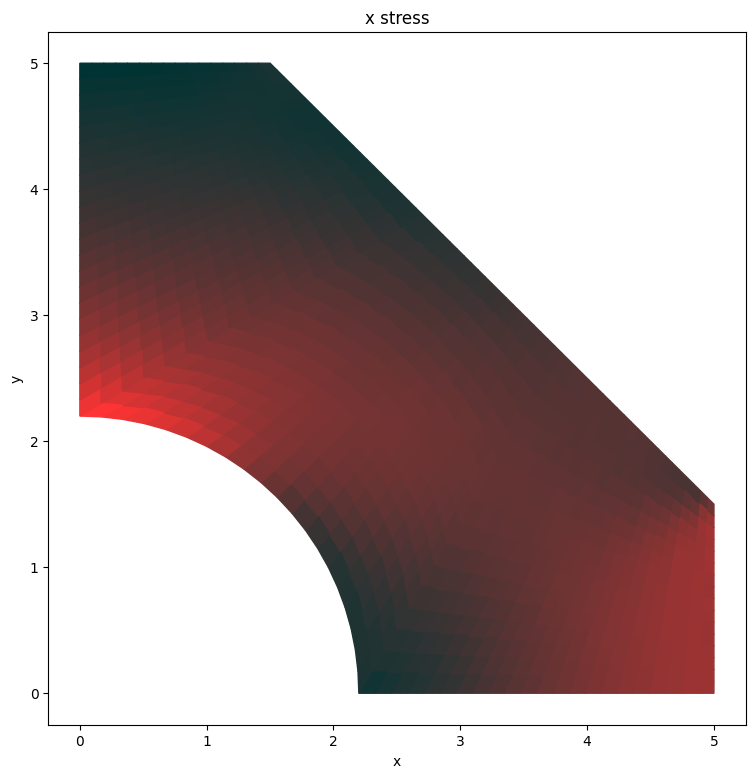

max_dU:  1.6945714275735613
max_dU:  1.7092949967578583
max_dU:  1.6790062555574545
max_dU:  1.8198104338237246
max_dU:  1.6034312505518244
max_dU:  1.5975605070464274
max_dU:  1.5637040867432663
max_dU:  1.5179633229630631
max_dU:  1.500420833055862
max_dU:  1.4734659615501302
time:  0.0030363192149377096


100%|██████████| 1024/1024 [00:00<00:00, 1120.02it/s]


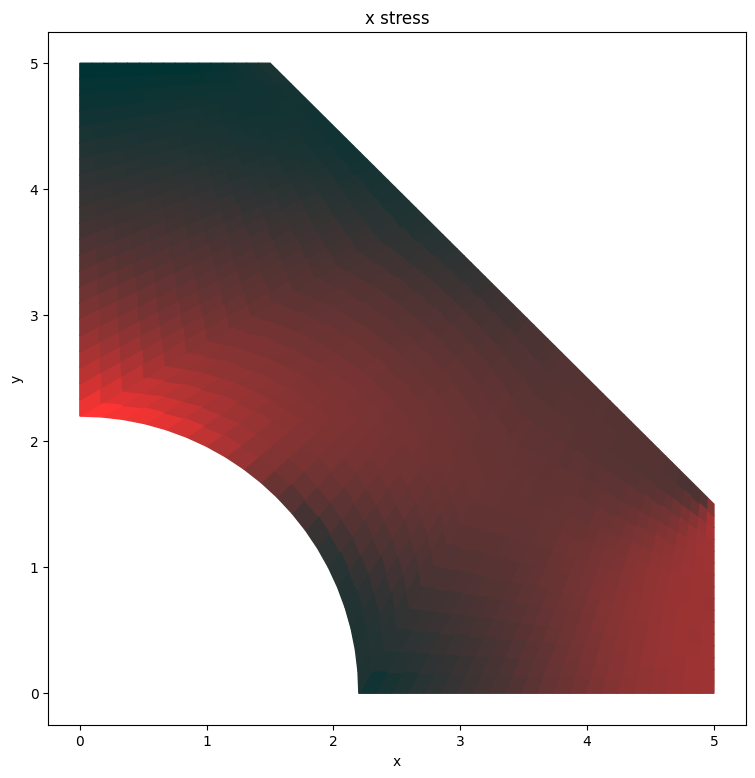

max_dU:  1.464544104416841
max_dU:  1.4496355949633528
max_dU:  1.4589835812463148
max_dU:  1.452287380908869
max_dU:  1.435826341798715
max_dU:  1.4239161659576314
max_dU:  1.407429962069362
max_dU:  1.405070370449946
max_dU:  1.3896720853882019
max_dU:  1.3743852965019976
time:  0.0031288899227101996


100%|██████████| 1024/1024 [00:00<00:00, 1267.12it/s]


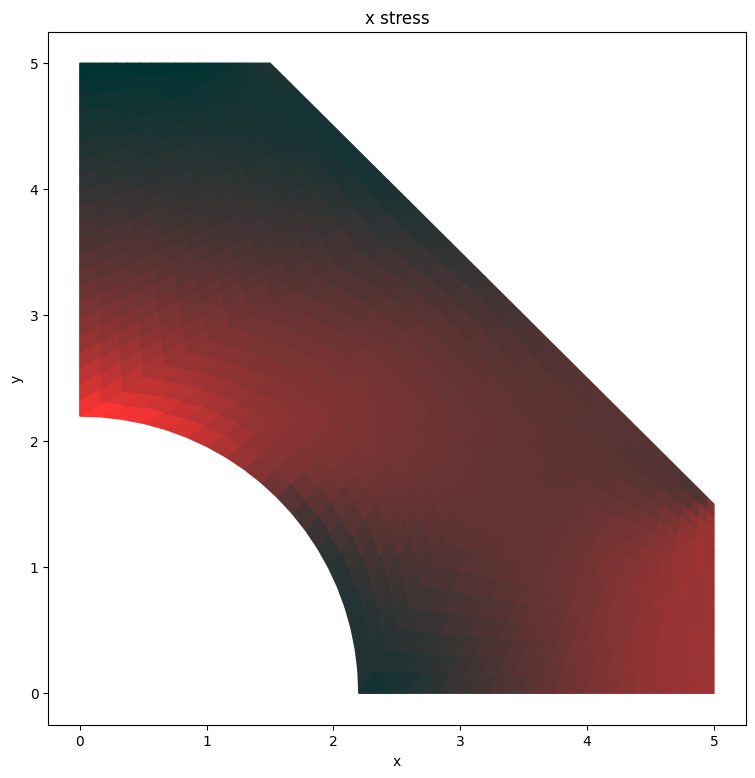

max_dU:  1.3775869572667374
max_dU:  1.3648696296643221
max_dU:  1.338748767809634
max_dU:  1.3023112104562584
max_dU:  1.2996283247635663
max_dU:  1.2973263752866726
max_dU:  1.2973747980525376
max_dU:  1.29719112648678
max_dU:  1.2919435603929001
max_dU:  1.2603134468640182
time:  0.0032214606304826897


100%|██████████| 1024/1024 [00:01<00:00, 983.19it/s]


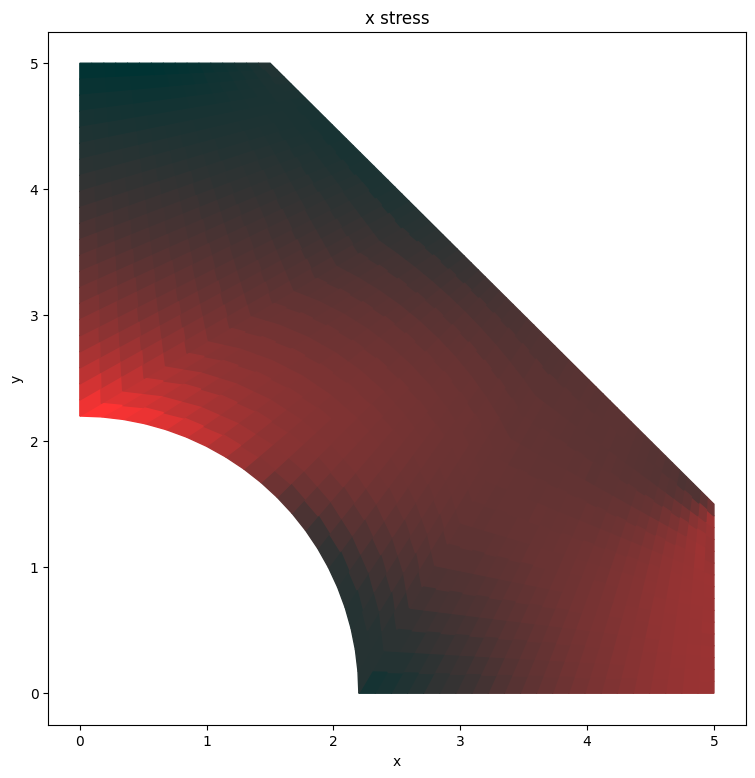

max_dU:  1.2451949900726982
max_dU:  1.2672884911679416
max_dU:  1.2555061458529237
max_dU:  1.2503743432899657
max_dU:  1.2671001533430848
max_dU:  1.2915864505220582
max_dU:  1.2843132257736898
max_dU:  1.2811763150614224
max_dU:  1.2960405889666808
max_dU:  1.3290667205322264
time:  0.0033140313382551798


100%|██████████| 1024/1024 [00:00<00:00, 1028.33it/s]


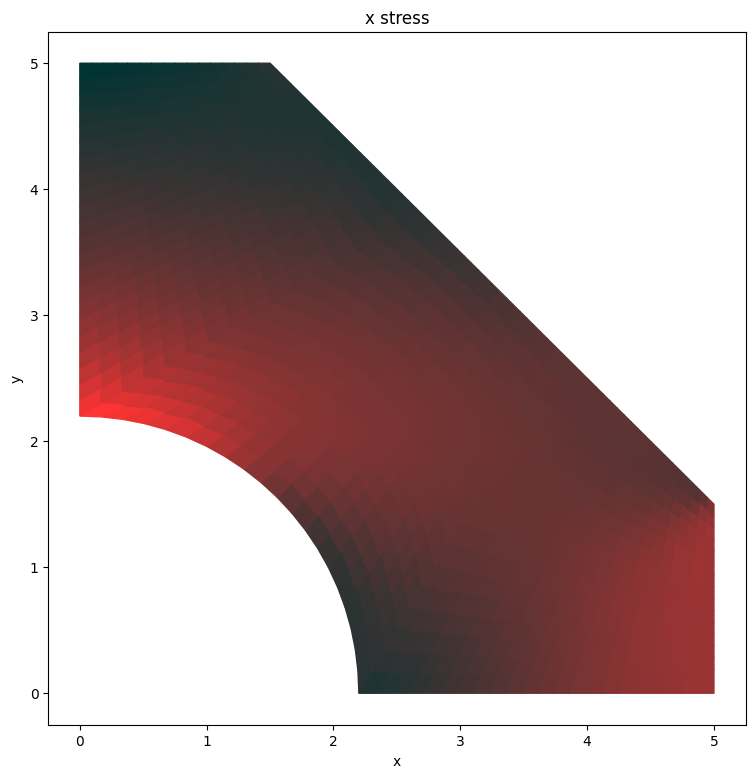

max_dU:  1.3348058525665574
max_dU:  1.3770330823521537
max_dU:  1.3724035201093805
max_dU:  1.3520294662232784
max_dU:  1.3567976146785787
max_dU:  1.3676047904034736
max_dU:  1.3468662097027002
max_dU:  1.2997299903950728
max_dU:  1.3170576180634892
max_dU:  1.2993467708517932
time:  0.00340660204602767


100%|██████████| 1024/1024 [00:00<00:00, 1094.19it/s]


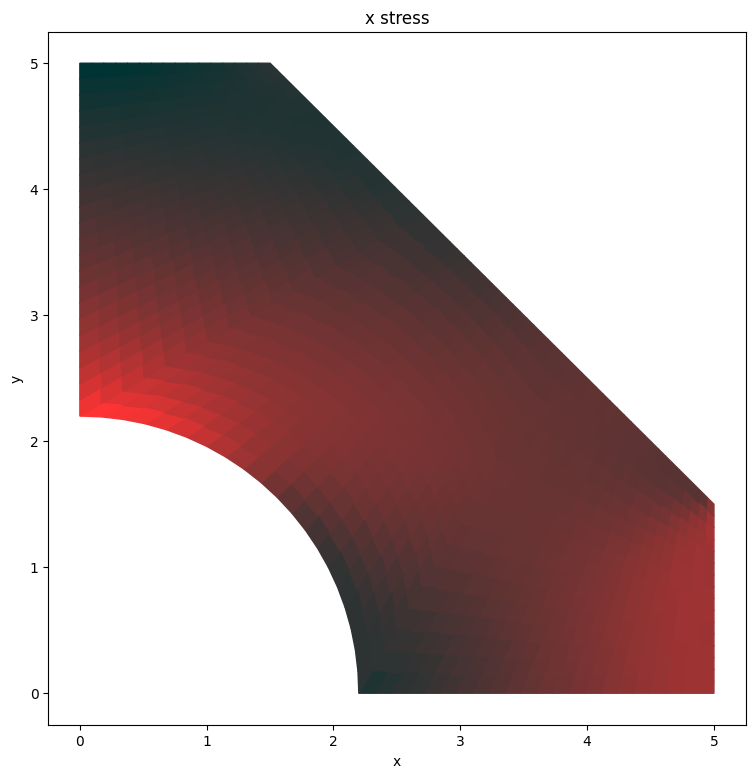

max_dU:  1.2583935035509217
max_dU:  1.2838819924216534
max_dU:  1.2940085669199928
max_dU:  1.2820913284612723
max_dU:  1.2676694850674375
max_dU:  1.3008884564591037
max_dU:  1.324799706268087
max_dU:  1.3290002696547047
max_dU:  1.3187660368194214
max_dU:  1.3205999680643723
time:  0.00349917275380016


100%|██████████| 1024/1024 [00:00<00:00, 1098.46it/s]


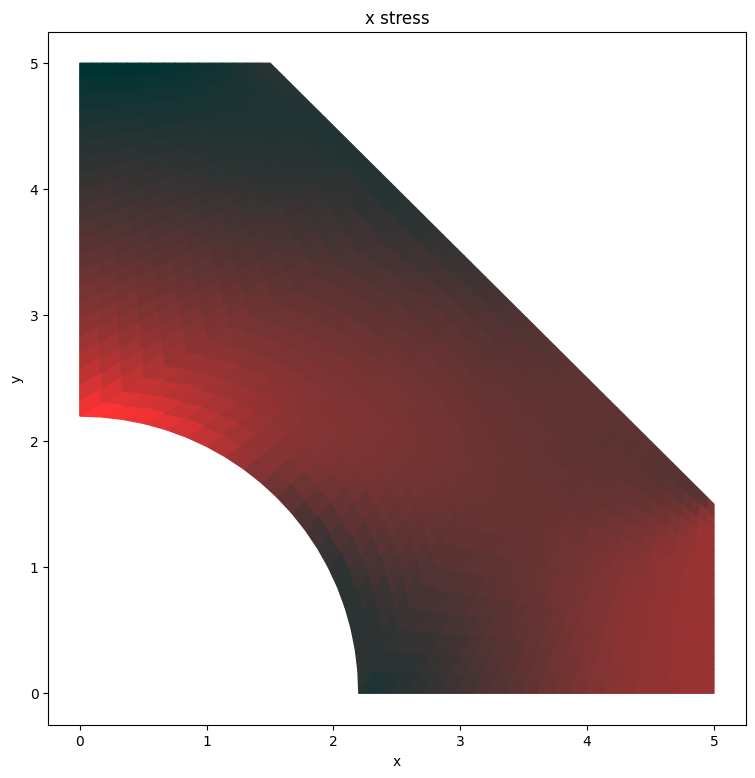

max_dU:  1.2928978354505927
max_dU:  1.2374911490410305
max_dU:  1.209662190618583
max_dU:  1.237341895366518
max_dU:  1.2513085575441543
max_dU:  1.2342429036336504
max_dU:  1.1867533325500337
max_dU:  1.194205133621469
max_dU:  1.2270884336841779
max_dU:  1.2393965185551719
time:  0.00359174346157265


100%|██████████| 1024/1024 [00:00<00:00, 1202.15it/s]


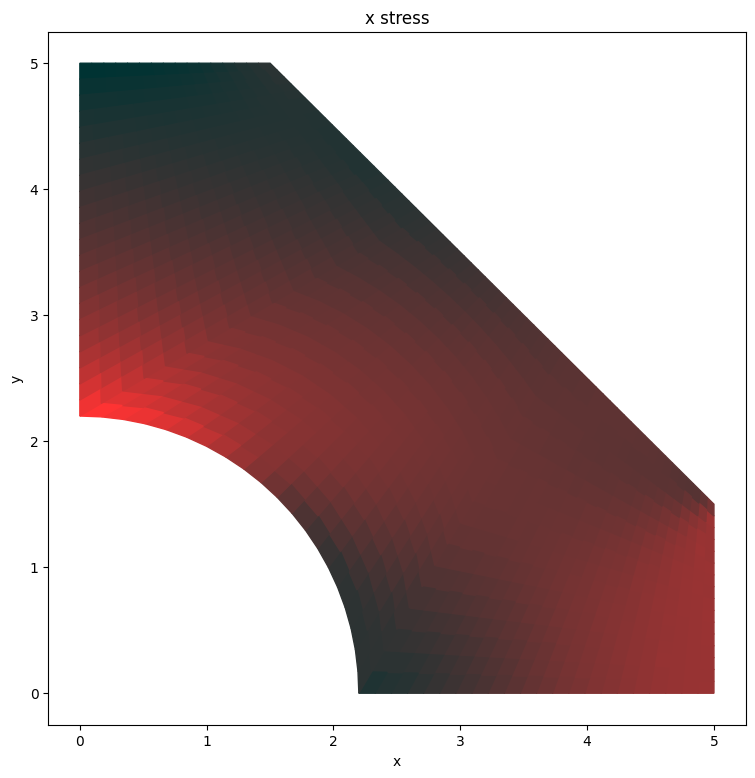

max_dU:  1.2232617137507154
max_dU:  1.178449868362035
max_dU:  1.1112023254223578
max_dU:  1.0514881580346787
max_dU:  1.0488853284858326
max_dU:  1.06598449075313
max_dU:  1.0717405969231482
max_dU:  1.055982542490893
max_dU:  1.0569669559516592
max_dU:  1.1491391472409789
time:  0.00368431416934514


100%|██████████| 1024/1024 [00:00<00:00, 1131.40it/s]


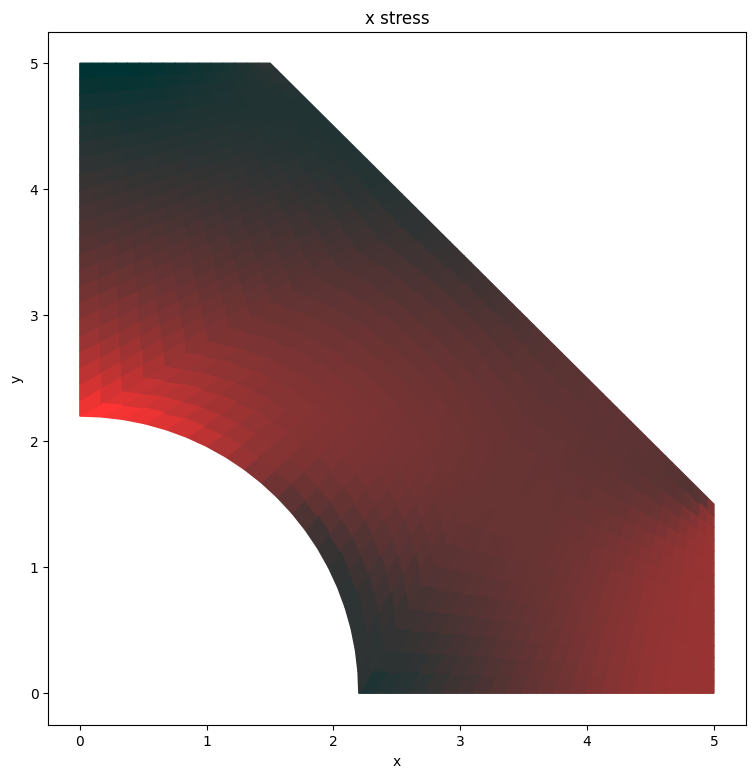

max_dU:  1.065726135646999
max_dU:  1.0289314429023515
max_dU:  1.0828579609450717
max_dU:  1.0044760560077766
max_dU:  0.9989878215537129
max_dU:  1.0232881026519376
max_dU:  0.9702288234692636
max_dU:  0.9847729210566333
max_dU:  0.9935609626461219
max_dU:  0.9760302169162305
time:  0.00377688487711763


100%|██████████| 1024/1024 [00:01<00:00, 796.72it/s]


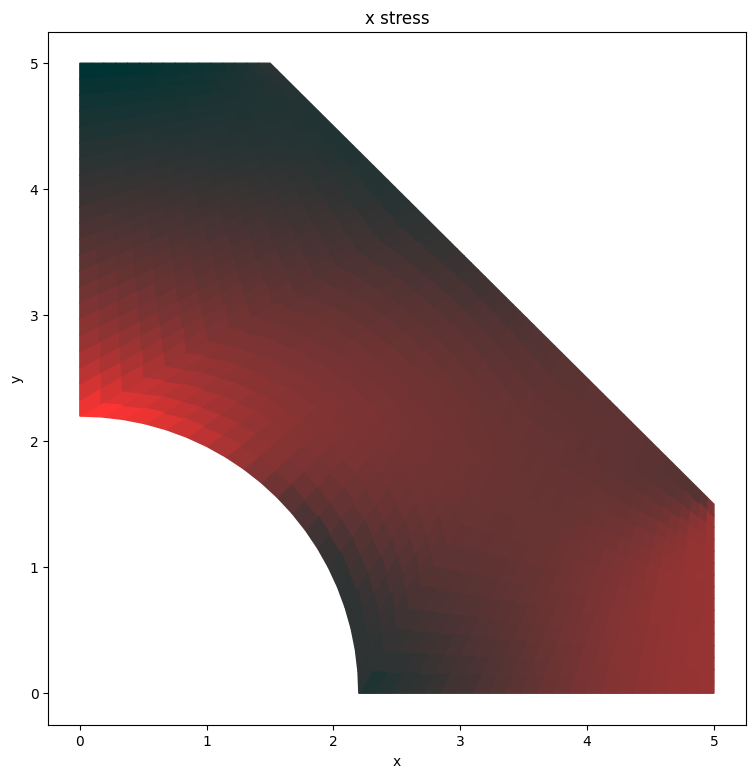

max_dU:  0.9767239983831146
max_dU:  1.0277782293018287
max_dU:  0.9964592355750868
max_dU:  0.9594178634795577
max_dU:  0.9535970116912772
max_dU:  0.9352048852520886
max_dU:  0.935072139162336
max_dU:  1.0041853016899152
max_dU:  0.925993273971389
max_dU:  0.9391481169571931
time:  0.0038694555848901202


100%|██████████| 1024/1024 [00:01<00:00, 760.47it/s]


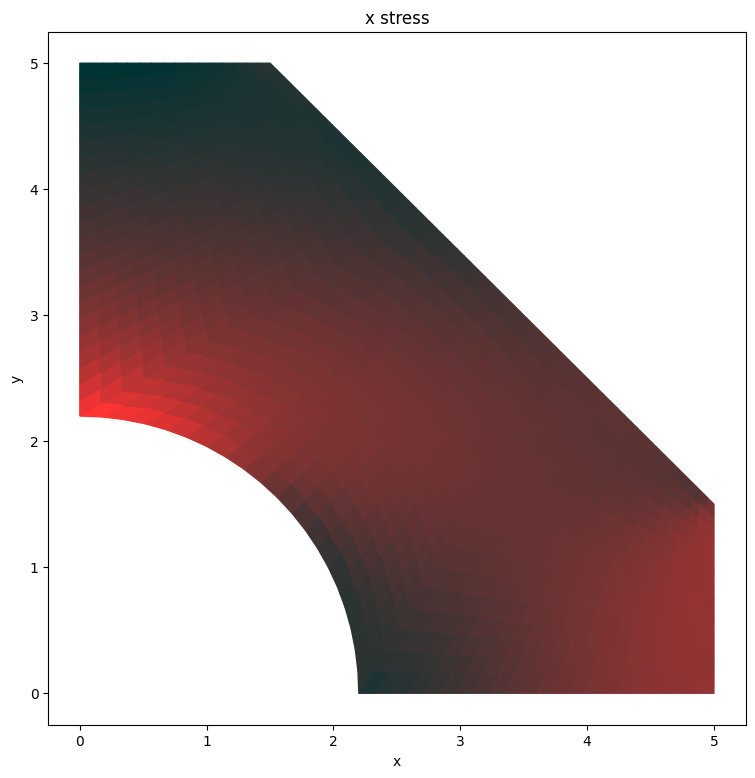

max_dU:  0.943964876366426
max_dU:  0.9372708835291759
max_dU:  0.9215352041164397
max_dU:  0.9595078669488178
max_dU:  0.9410488014873929
max_dU:  0.9253527517766468
max_dU:  0.9207203937684492
max_dU:  0.9215713321410908
max_dU:  0.9437554484517982
max_dU:  0.9298654814395934
time:  0.003962026292662611


100%|██████████| 1024/1024 [00:00<00:00, 1157.05it/s]


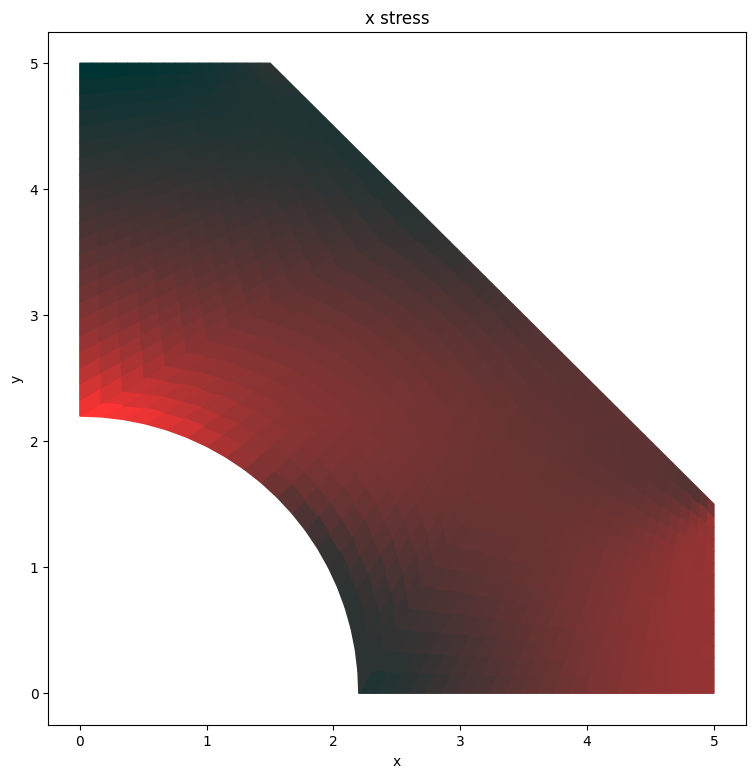

max_dU:  0.9211580906553956
max_dU:  0.908175188700912
max_dU:  0.9088296490012111
max_dU:  0.9155209435167451
max_dU:  0.9169599217589495
max_dU:  0.911999434252827
max_dU:  0.9000355817998663
max_dU:  0.8918414593059152
max_dU:  0.8798106817675188
max_dU:  0.8776863342915956
time:  0.004054597000435101


100%|██████████| 1024/1024 [00:01<00:00, 982.88it/s]


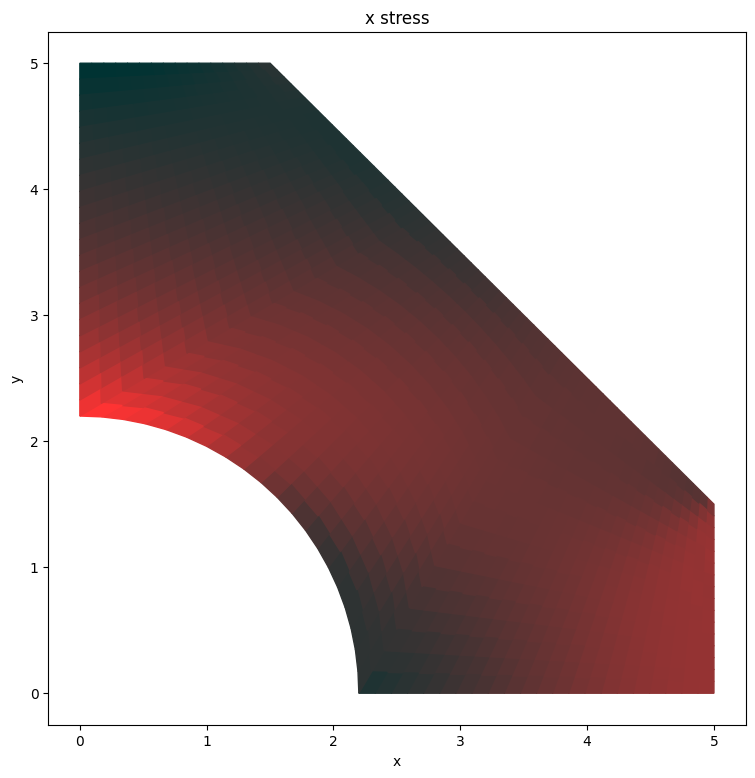

max_dU:  0.8802455247255159
max_dU:  0.8852731267460778
max_dU:  0.8887354340436845
max_dU:  0.8880529707445417
max_dU:  0.8820781214545372
max_dU:  0.8710183555344962
max_dU:  0.8559466165336567
max_dU:  0.8377117347077717
max_dU:  0.8161434692369666
max_dU:  0.7902901540963003
time:  0.004147167708207591


100%|██████████| 1024/1024 [00:00<00:00, 1089.68it/s]


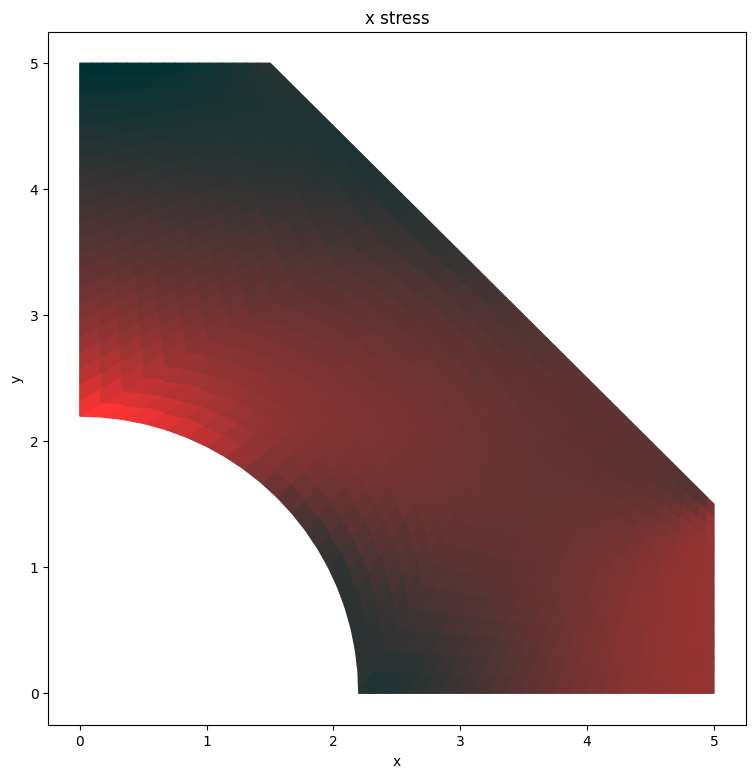

max_dU:  0.7595791248318142
max_dU:  0.7432169984382546
max_dU:  0.7129366047395892
max_dU:  0.6993905771037187
max_dU:  0.6902005067736329
max_dU:  0.6910245494190601
max_dU:  0.6968360973513565
max_dU:  0.7496802117151673
max_dU:  0.6912642200808486
max_dU:  0.6958066934167265
time:  0.004239738415980081


100%|██████████| 1024/1024 [00:00<00:00, 1052.61it/s]


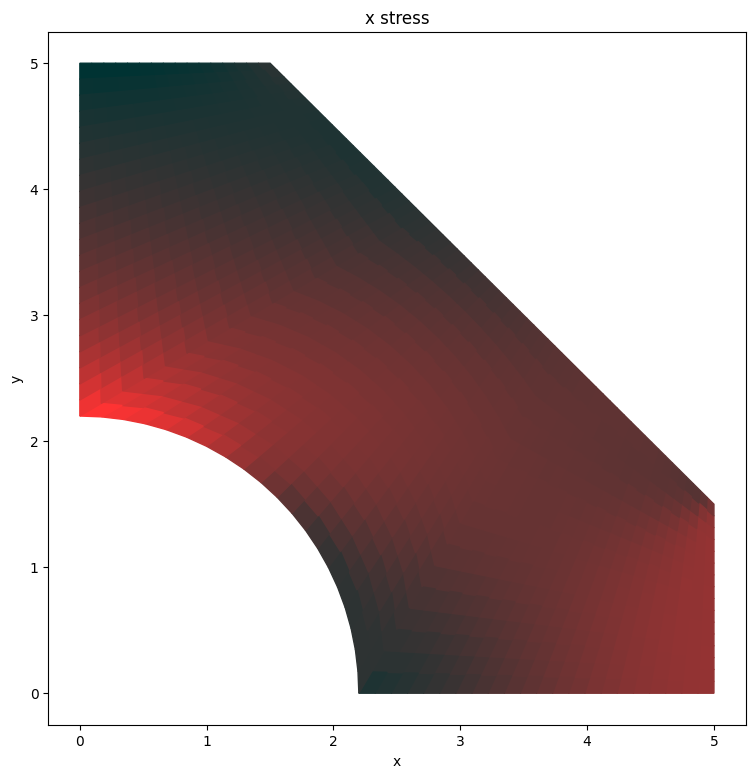

max_dU:  0.6756053337606079
max_dU:  0.6782070269181338
max_dU:  0.6818657813443108
max_dU:  0.6749753241092971
max_dU:  0.6813681196861268
max_dU:  0.6934964033332774
max_dU:  0.7278954569812539
max_dU:  0.6822440445953023
max_dU:  0.7206189648271936
max_dU:  0.6910115678181709
time:  0.004332309123752571


100%|██████████| 1024/1024 [00:01<00:00, 916.70it/s]


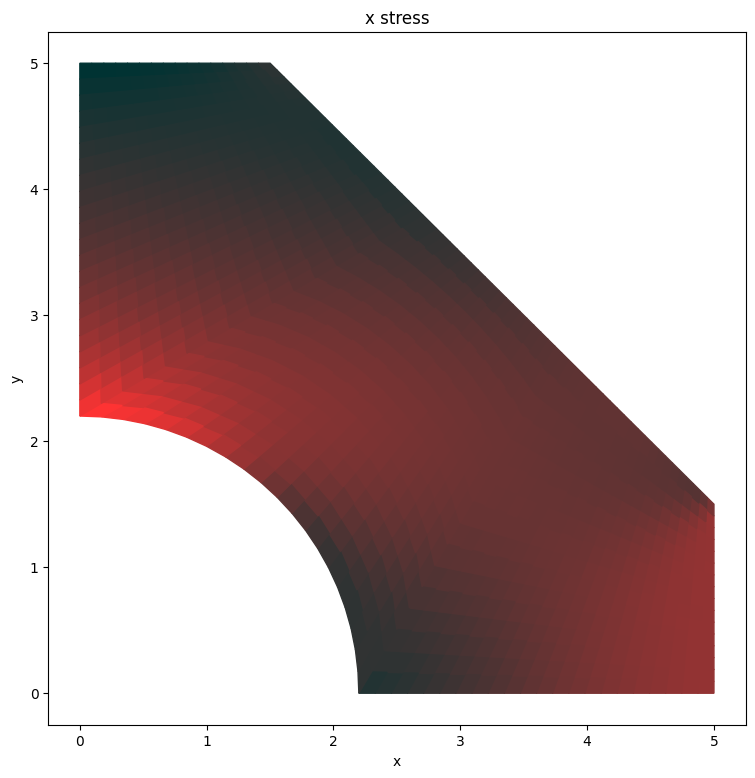

max_dU:  0.6766542257682455
max_dU:  0.6705499401604991
max_dU:  0.7773574509911194
max_dU:  0.6759630461798105
max_dU:  0.6632489482331864
max_dU:  0.7609523785945755
max_dU:  0.7559817111084185
max_dU:  0.6551690727588431
max_dU:  0.7134126713598724
max_dU:  0.7252661772795367
time:  0.004424879831525061


100%|██████████| 1024/1024 [00:01<00:00, 919.72it/s]


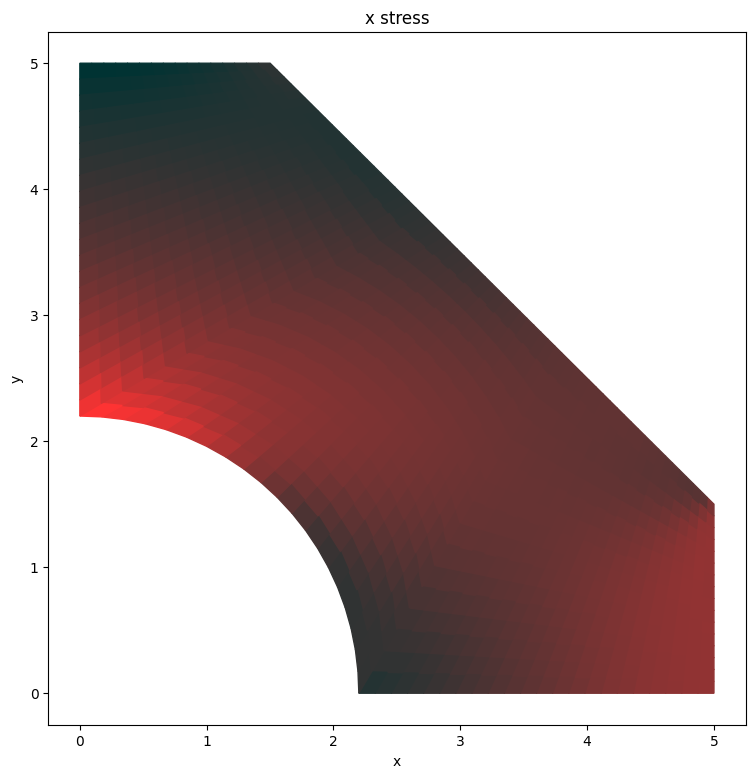

max_dU:  0.6780582217102913
max_dU:  0.7003772895012056
max_dU:  0.6887131454151443
max_dU:  0.6348319618858042
max_dU:  0.753786545453798
max_dU:  0.6316426612145044
max_dU:  0.660168465528379
max_dU:  0.6721066375351163
max_dU:  0.7230340799131381
max_dU:  0.638665106802454
time:  0.004517450539297551


100%|██████████| 1024/1024 [00:00<00:00, 1046.82it/s]


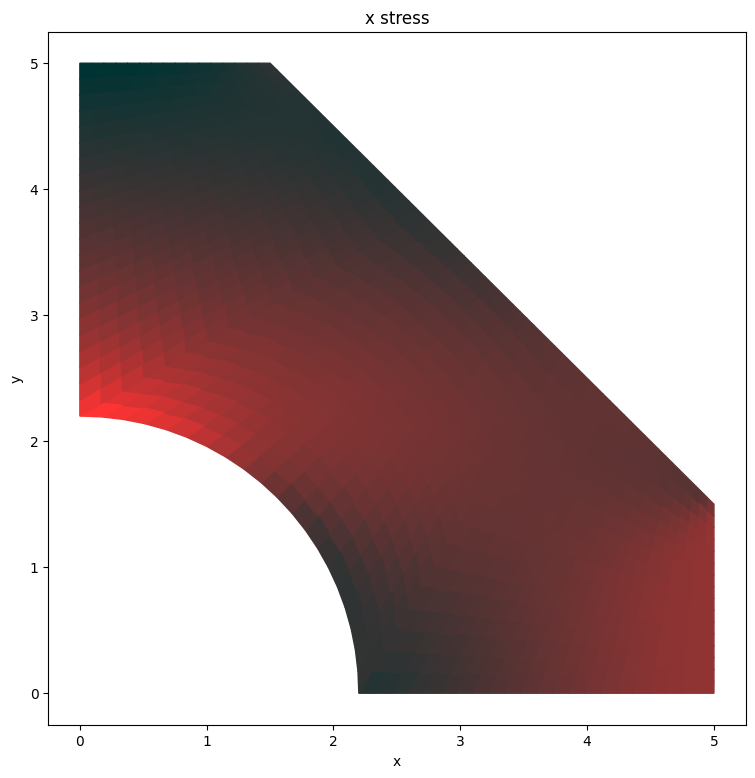

max_dU:  0.6475788927991232
max_dU:  0.6481948801499434
max_dU:  0.6417166378063835
max_dU:  0.6319233238390637
max_dU:  0.735247289464064
max_dU:  0.6443440574136665
max_dU:  0.6609879780496498
max_dU:  0.6606575707721513
max_dU:  0.6450488278231751
max_dU:  0.6446963662909304
time:  0.004610021247070041


100%|██████████| 1024/1024 [00:01<00:00, 1023.85it/s]


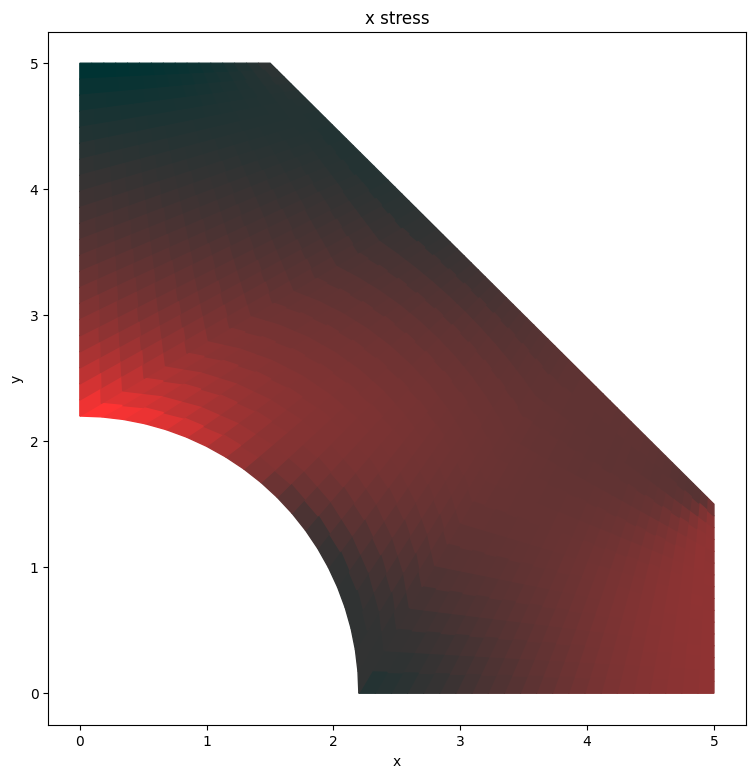

max_dU:  0.6544689905337212
max_dU:  0.6505345859322215
max_dU:  0.6317730013255302
max_dU:  0.6505891867276602
max_dU:  0.6634210725756933
max_dU:  0.6606125118053789
max_dU:  0.636278028084043
max_dU:  0.6422144571950315
max_dU:  0.6329175839242498
max_dU:  0.6815354573540844
time:  0.004702591954842531


100%|██████████| 1024/1024 [00:00<00:00, 1042.57it/s]


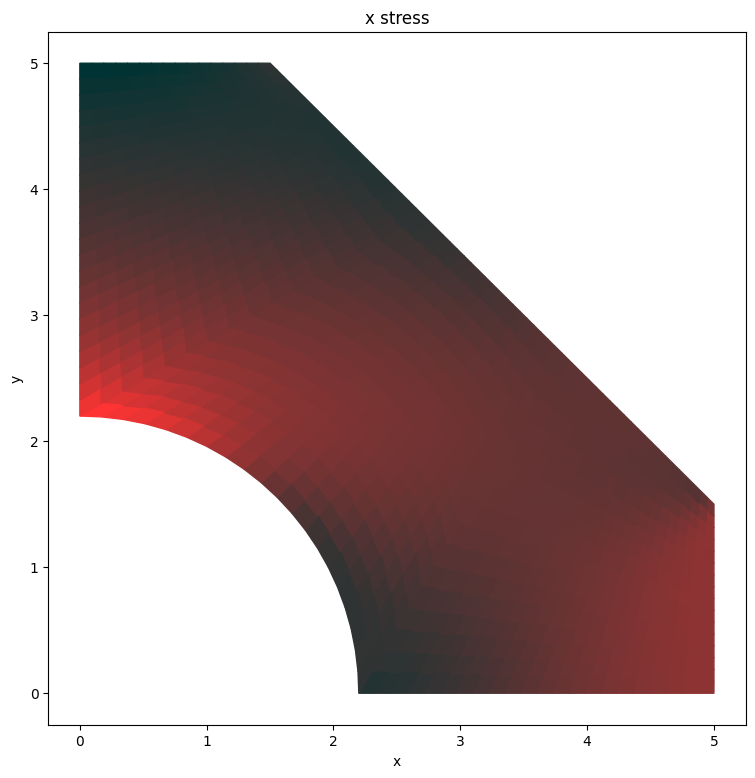

max_dU:  0.6514381808893835
max_dU:  0.6291087777858516
max_dU:  0.6632821774684602
max_dU:  0.6348658208321375
max_dU:  0.6321843175590044
max_dU:  0.6746163851105256
max_dU:  0.6164695781617031
max_dU:  0.616489363103978
max_dU:  0.6136419557559734
max_dU:  0.6087137678650602
time:  0.004795162662615021


100%|██████████| 1024/1024 [00:01<00:00, 975.11it/s]


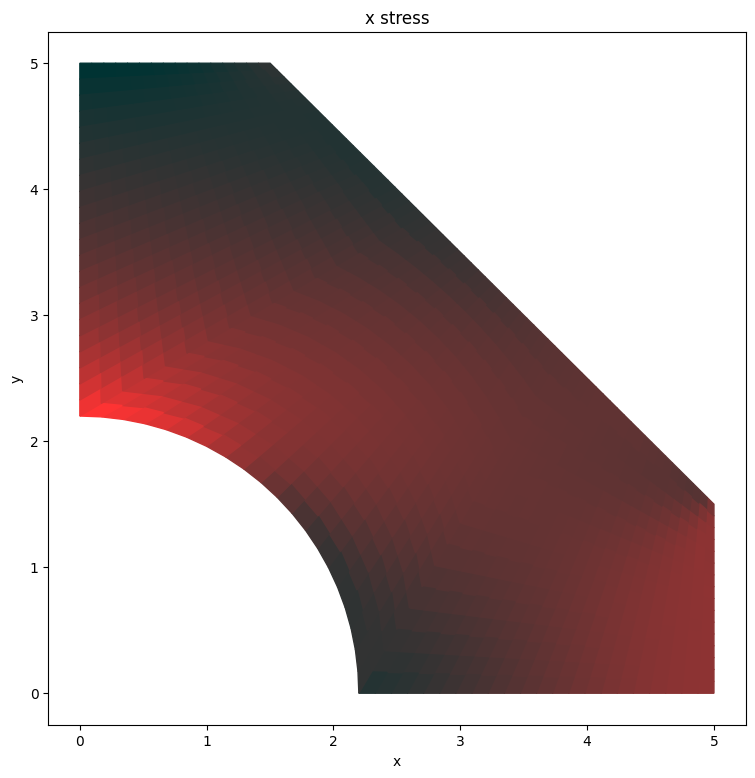

max_dU:  0.6080471153941166
max_dU:  0.6170265826709143
max_dU:  0.6136131313706992
max_dU:  0.6186788990117184
max_dU:  0.6254568522993557
max_dU:  0.6328886656607842
max_dU:  0.6330600688496886
max_dU:  0.6478523473960657
max_dU:  0.6515446369551864
max_dU:  0.6429823225916843
time:  0.0048877333703875115


100%|██████████| 1024/1024 [00:01<00:00, 961.74it/s]


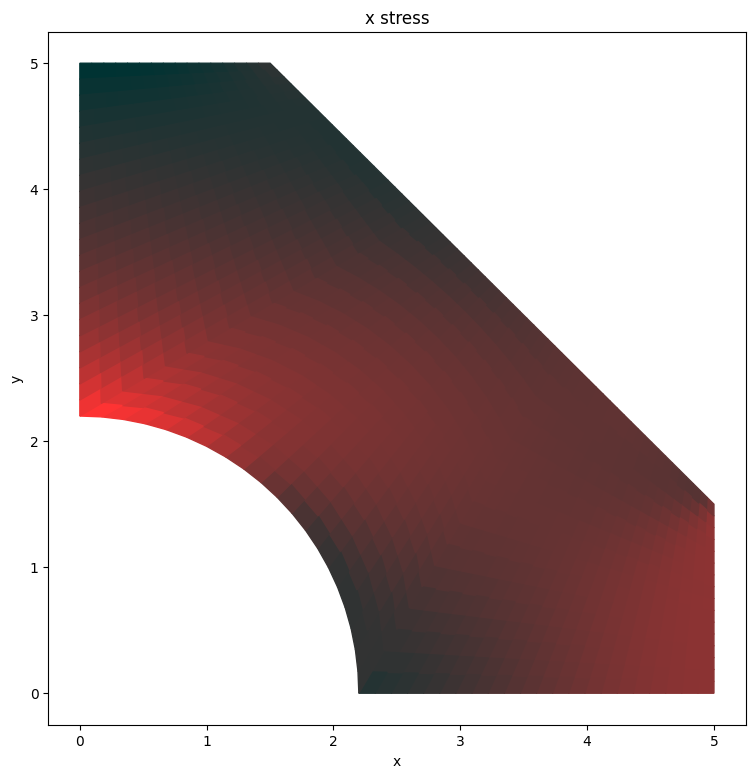

max_dU:  0.641493294290043
max_dU:  0.6447283993175088
max_dU:  0.6391437399288149
max_dU:  0.6372365756569144
max_dU:  0.6318339031087534
max_dU:  0.6356298141769215
max_dU:  0.6329140616279267
max_dU:  0.6958887400871548
max_dU:  0.637147077871417
max_dU:  0.6312736660305521
time:  0.0049803040781600015


100%|██████████| 1024/1024 [00:01<00:00, 788.61it/s]


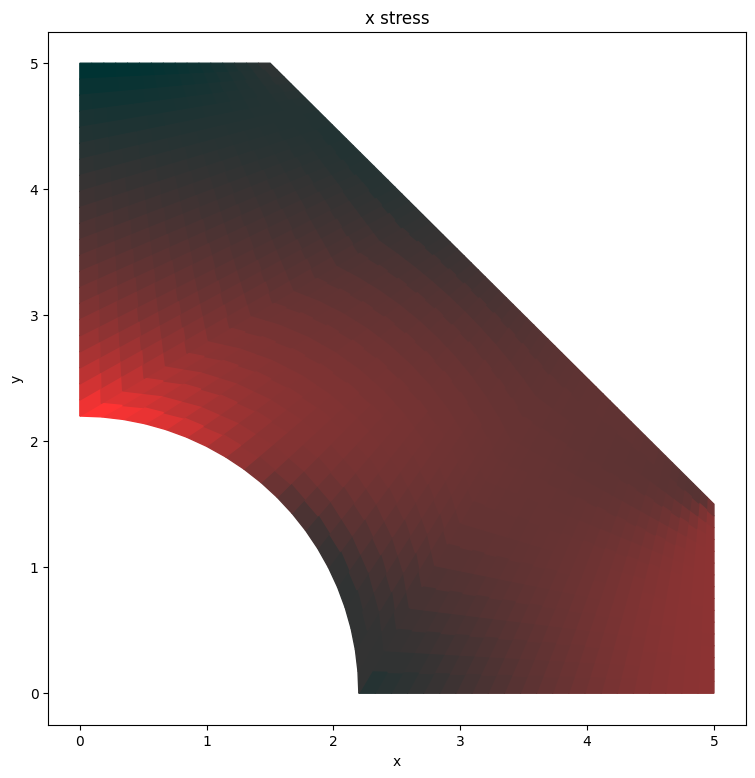

max_dU:  0.6345845608134805
max_dU:  0.6352793433748676
max_dU:  0.6393585549608065
max_dU:  0.6338511837192637
max_dU:  0.634181914728549
max_dU:  0.6405501648781884
max_dU:  0.6392009198065443
max_dU:  0.6329491853942266
max_dU:  0.6285566702870264
max_dU:  0.6279371704345172
time:  0.005072874785932492


100%|██████████| 1024/1024 [00:00<00:00, 1043.81it/s]


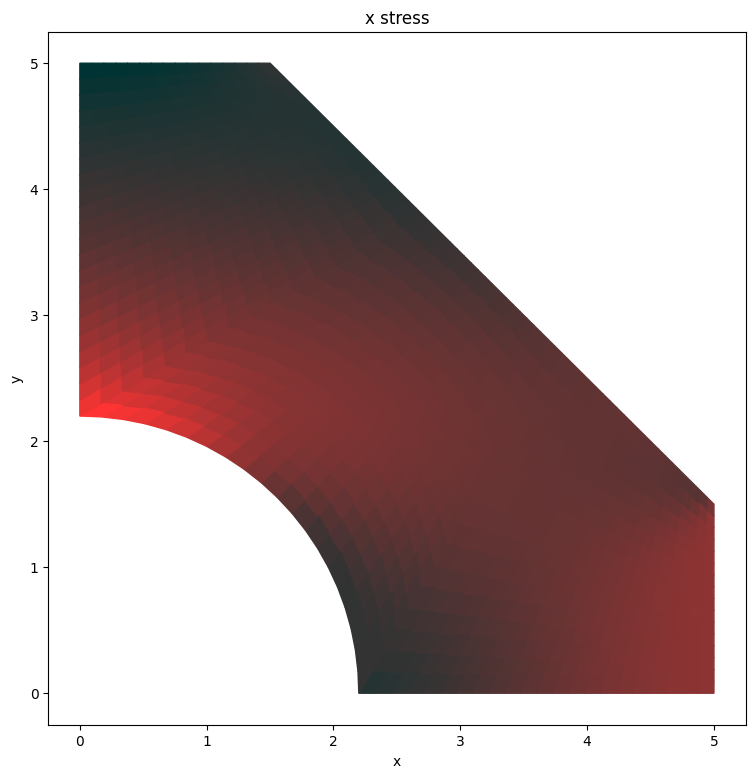

max_dU:  0.617263284514847
max_dU:  0.6092259710208149
max_dU:  0.6080661916542401
max_dU:  0.610230869380519
max_dU:  0.6005143426481745
max_dU:  0.599662012253512
max_dU:  0.6002925554664272
max_dU:  0.6005182342106846
max_dU:  0.5848833676186146
max_dU:  0.5736657880189765
time:  0.005165445493704982


100%|██████████| 1024/1024 [00:01<00:00, 978.71it/s]


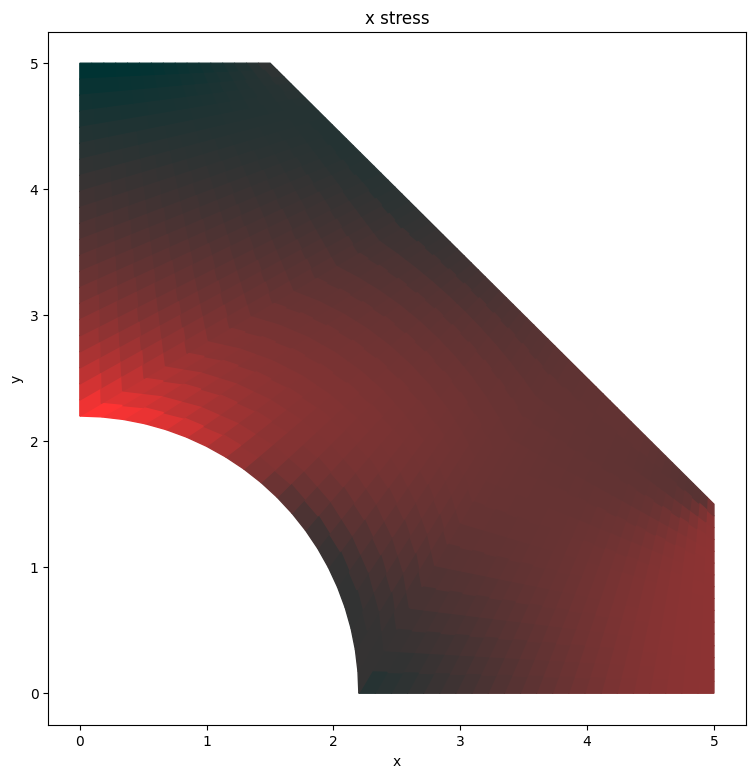

max_dU:  0.5750361849137675
max_dU:  0.5643856872957789
max_dU:  0.5613162590405347
max_dU:  0.5583901636158939
max_dU:  0.5576646801237862
max_dU:  0.5530075430610767
max_dU:  0.5442195491159182
max_dU:  0.5419260041709302
max_dU:  0.5424527818945625
max_dU:  0.539250383531536
time:  0.005258016201477472


100%|██████████| 1024/1024 [00:00<00:00, 1139.78it/s]


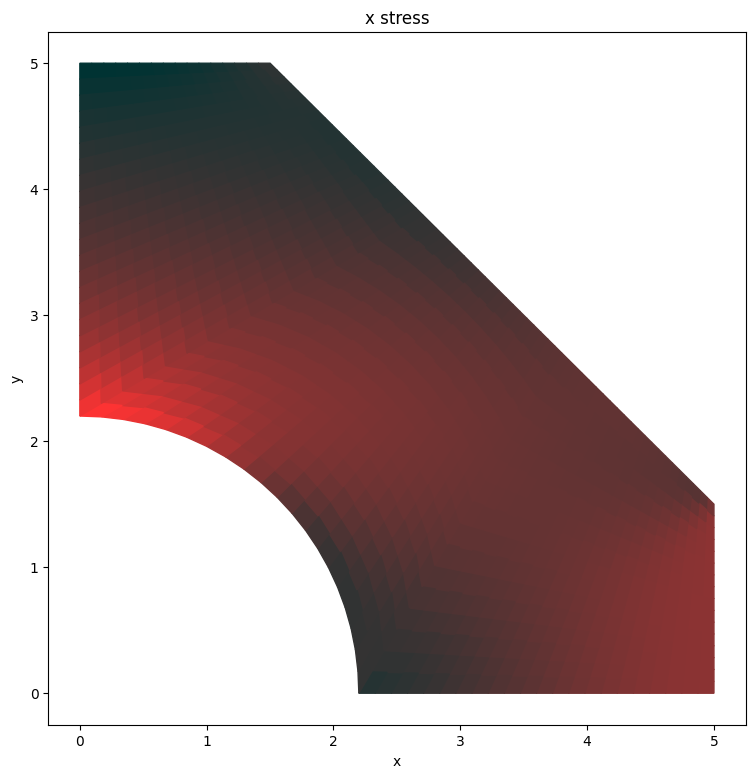

max_dU:  0.5309557949478532
max_dU:  0.5286788095570945
max_dU:  0.5306366537157036
max_dU:  0.5330525138038898
max_dU:  0.5267162133149941
max_dU:  0.5258974198759884
max_dU:  0.5309392481945553
max_dU:  0.5258366837744128
max_dU:  0.512074895904668
max_dU:  0.5166432400289277
time:  0.005350586909249962


100%|██████████| 1024/1024 [00:01<00:00, 985.04it/s]


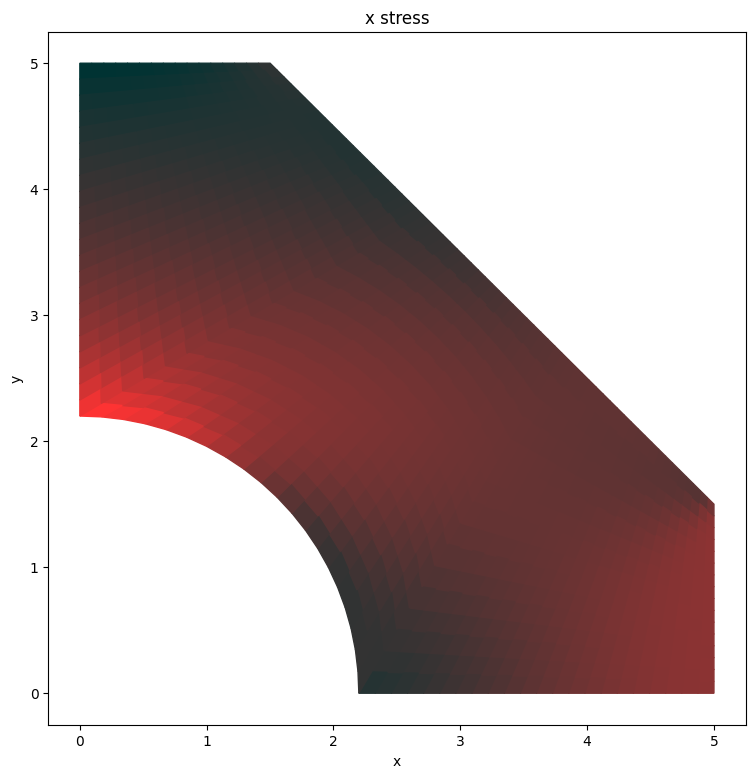

max_dU:  0.5163040798392821
max_dU:  0.5101403621707717
max_dU:  0.5050488871268887
max_dU:  0.5107638872474253
max_dU:  0.5104767848458168
max_dU:  0.5118514609665044
max_dU:  0.516243041115694
max_dU:  0.5174257218693342
max_dU:  0.514717895375548
max_dU:  0.5082151579225542
time:  0.005443157617022452


100%|██████████| 1024/1024 [00:00<00:00, 1036.01it/s]


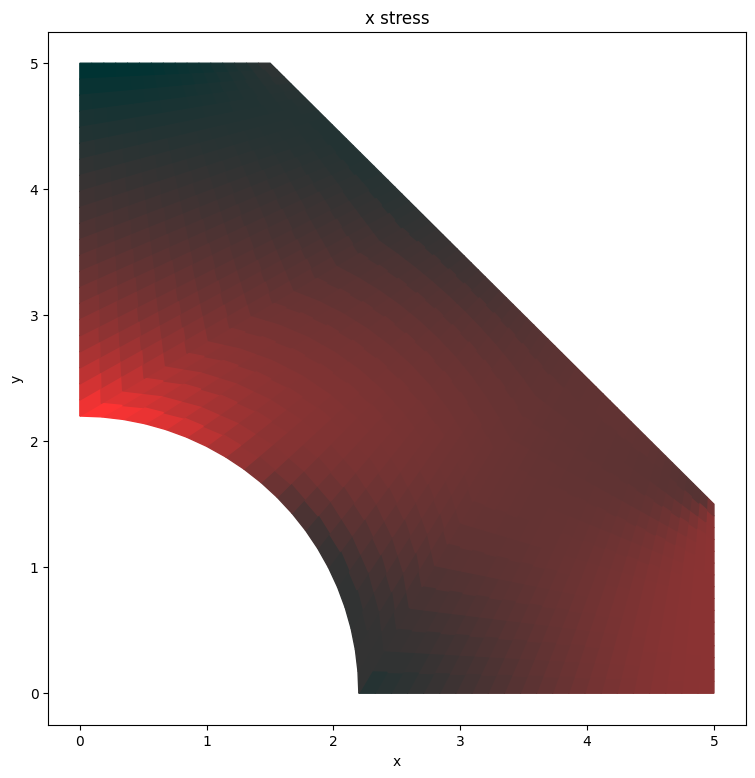

max_dU:  0.5040526117734746
max_dU:  0.4980104832992884
max_dU:  0.4944674674195484
max_dU:  0.49032537688686434
max_dU:  0.48907771008264456
max_dU:  0.4889052291956104
max_dU:  0.4888958997802841
max_dU:  0.49307041804815266
max_dU:  0.48434278636279643
max_dU:  0.4771773266181788
max_dU:  0.47729202840890955
max_dU:  0.4770771538521542
max_dU:  0.4739508865143868
max_dU:  0.46819965571446354
max_dU:  0.46349665158073033
max_dU:  0.46368075441431755
max_dU:  0.4686527253162805
max_dU:  0.46726102695508076
max_dU:  0.4578425268828759
max_dU:  0.45321592126586774
max_dU:  0.45324969677347215
max_dU:  0.4485614180525863
max_dU:  0.43389713482141895
max_dU:  0.4284506138540478
max_dU:  0.42306428881879105
max_dU:  0.42159799945123705
max_dU:  0.41936639614188903
max_dU:  0.41899970793125996
max_dU:  0.4224172949857688
max_dU:  0.44042462662970183
max_dU:  0.4119302117862335
max_dU:  0.41105086340139385
max_dU:  0.4100700959878022
max_dU:  0.40858893020813986
max_dU:  0.40294406903082114


100%|██████████| 1024/1024 [00:01<00:00, 929.40it/s]


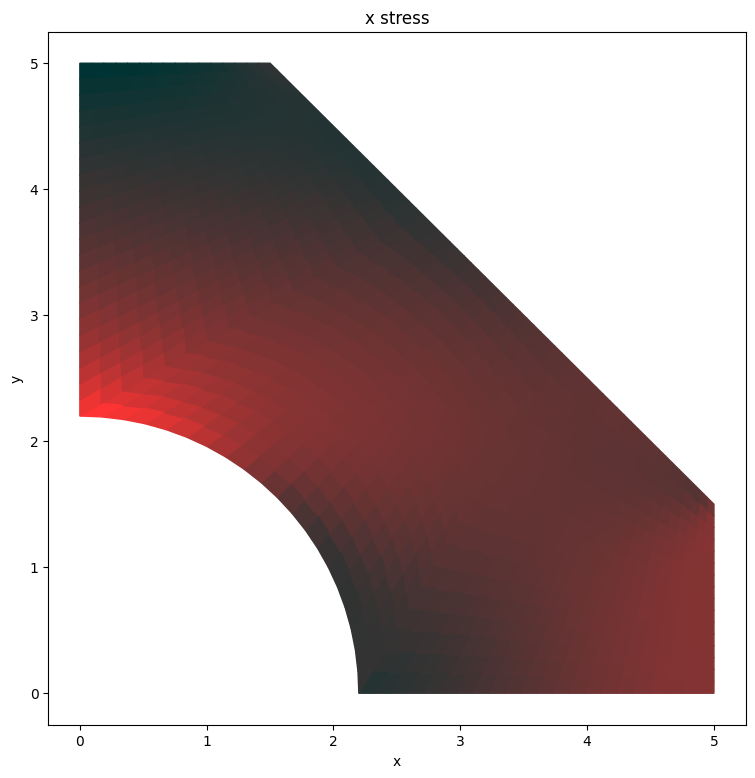

In [ ]:
NewMarkc23(verts, triag, left_data, right_data, up_data, down_data, inner_data, float(filename_1[:-2]), E, nu, ro, P, dmp, filename_1)